In [45]:
import pandas as pd
import numpy as np
import sklearn as sk
import seaborn as sns
import matplotlib.pyplot as plt
import scipy as sc
from sklearn.svm import SVC
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.dummy import DummyRegressor
from sklearn import preprocessing
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_absolute_error as mae 
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.svm import SVC
import xgboost as xg 
from numpy import inf
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
import category_encoders as ce
# options pandas pour lire entièrement les fichiers au moins jusqu'à 999 lignes et 999 colonnes
pd.options.display.max_rows = 500000
pd.options.display.max_columns = 500000
%matplotlib inline

# Modèle de Machine Learning pour la prédiction de  la consommation d'energie et de l'emission des gazs à effets de serre

In [46]:
data2 = pd.read_csv("2016data2.csv")

In [47]:
data2.head()

,Unnamed: 0,OSEBuildingID,BuildingType,PrimaryPropertyType,PropertyName,Address,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),TotalGHGEmissions,GHGEmissionsIntensity
0,0,1,NonResidential,Hotel,Mayflower park hotel,405 Olive way,downtown,47.61220,-122.33799,1927,1.0,12,88434,0,88434,Hotel,Hotel,88434.0,60.0,81.699997,84.300003,182.500000,189.000000,7226362.5,7456910.0,1.0,1.0,1.0,1.0,1.0,249.98,2.83
1,1,2,NonResidential,Hotel,Paramount Hotel,724 Pine street,downtown,47.61317,-122.33393,1996,1.0,11,103566,15064,88502,"Hotel, Parking, Restaurant",Hotel,83880.0,61.0,94.800003,97.900002,176.100006,179.399994,8387933.0,8664479.0,0.0,1.0,1.0,1.0,1.0,295.86,2.86
2,2,3,NonResidential,Hotel,5673-The Westin Seattle,1900 5th Avenue,downtown,47.61393,-122.33810,1969,1.0,41,956110,196718,759392,Hotel,Hotel,756493.0,43.0,96.000000,97.699997,241.899994,244.100006,72587024.0,73937112.0,1.0,1.0,1.0,1.0,1.0,2089.28,2.19
3,3,5,NonResidential,Hotel,HOTEL MAX,620 STEWART ST,downtown,47.61412,-122.33664,1926,1.0,10,61320,0,61320,Hotel,Hotel,61320.0,56.0,110.800003,113.300003,216.199997,224.000000,6794584.0,6946800.5,1.0,1.0,1.0,1.0,1.0,286.43,4.67
4,4,8,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,downtown,47.61375,-122.34047,1980,1.0,18,175580,62000,113580,"Hotel, Parking, Swimming Pool",Hotel,123445.0,75.0,114.800003,118.699997,211.399994,215.600006,14172606.0,14656503.0,0.0,1.0,1.0,1.0,1.0,505.01,2.88


In [48]:
data2.columns

Index(['Unnamed: 0', 'OSEBuildingID', 'BuildingType', 'PrimaryPropertyType',
       'PropertyName', 'Address', 'Neighborhood', 'Latitude', 'Longitude',
       'YearBuilt', 'NumberofBuildings', 'NumberofFloors', 'PropertyGFATotal',
       'PropertyGFAParking', 'PropertyGFABuilding(s)',
       'ListOfAllPropertyUseTypes', 'LargestPropertyUseType',
       'LargestPropertyUseTypeGFA', 'ENERGYSTARScore', 'SiteEUI(kBtu/sf)',
       'SiteEUIWN(kBtu/sf)', 'SourceEUI(kBtu/sf)', 'SourceEUIWN(kBtu/sf)',
       'SiteEnergyUse(kBtu)', 'SiteEnergyUseWN(kBtu)', 'SteamUse(kBtu)',
       'Electricity(kWh)', 'Electricity(kBtu)', 'NaturalGas(therms)',
       'NaturalGas(kBtu)', 'TotalGHGEmissions', 'GHGEmissionsIntensity'],
      dtype='object')

Je n'ai pas d'information sur la météo pour l'utilisé comme facteur prédictif de la consommation d'energie et de l'émissions de carbone. Donc j'utilise comme variable cible **'SiteEnergyUseWN(kBtu)'** qui normalise les donnnées sur la consommation d'énergie des différents types de batiments et sont maintenant comparable d'une année à une autre.
SiteEUIWN normalise la taille des batiments pour évaluer la consommation d'energie des batiments qui sont similaires.
La deuxième variable cible est la prédiction d 'émission des gaz à effet de serre : **'TotalGHGEmissions'**

Les variables candidates pour notre modèle d'apres notre analyse avec la variable cible **'SiteEnergyUse(kBtu)'**  sont : \n 
       **'NumberofFloors', 'BuildingType','Neighborhood' ,'YearBuilt',
       'PropertyGFAParking', 'PropertyGFABuilding(s)',
        'SteamUse(kBtu)','Electricity(kBtu)','NaturalGas(kBtu)'**

On va garder les energies en **(kbtu)** pour le modèle et comme on a 'PropertyGFATotal' = 'PropertyGFAParking'+ 'PropertyGFABuilding(s)' On va garder uniquement **'PropertyGFAParking'** et **PropertyGFABuilding(s)** 

In [49]:
data2.drop(['Unnamed: 0', 'OSEBuildingID'],axis = 1, inplace = True)

In [50]:
print(data2.shape)
print(round(data2.isnull().sum().sum()/data2.size*100))

(3344, 30)
0


In [51]:
index1 = data2.loc[data2['SiteEnergyUseWN(kBtu)'] == 0.0].index
data2.drop(index1 , inplace=True)

In [52]:
index2 = data2.loc[data2['TotalGHGEmissions'] == 0.0].index
data2.drop(index2 , inplace=True)

In [53]:
data2.shape

(3313, 30)

In [54]:
index3 = data2.loc[data2['TotalGHGEmissions'] < 0.0].index
data2.drop(index3 , inplace=True)

In [55]:
data2.shape

(3312, 30)

Le jeu de donnée est composé de 3313 lignes et 30 colonnes, 3313 bâtiments et 30 caractéristiques de ces bâtiments

## Modélisation

J'utilise pour mon modèle de prédiction, le jeu de donnée le plus récent celui de 2016

### Traitement des variables catégorielles avec one hot encoder

J'utilise la méthode one hot encoder. Cette méthode consiste à transformer les variables catégorielles en décomposant la variables en fonction de chacune des catégories et en les transformant en variables binaires. l'encodage par variable indicatrice est faisable si le nombre de catégories restent raisonnable.

In [56]:
#selectionner les colonnes numeriques et colonnes categorielles
data_numerique = data2.select_dtypes(include=[np.number])
num_cols = data_numerique.columns.values
data_categ = data2.select_dtypes(exclude=[np.number])
categ_cols = data_categ.columns.values
print(num_cols)
print('\n')
print(categ_cols)

['Latitude' 'Longitude' 'YearBuilt' 'NumberofBuildings' 'NumberofFloors'
 'PropertyGFATotal' 'PropertyGFAParking' 'PropertyGFABuilding(s)'
 'LargestPropertyUseTypeGFA' 'ENERGYSTARScore' 'SiteEUI(kBtu/sf)'
 'SiteEUIWN(kBtu/sf)' 'SourceEUI(kBtu/sf)' 'SourceEUIWN(kBtu/sf)'
 'SiteEnergyUse(kBtu)' 'SiteEnergyUseWN(kBtu)' 'SteamUse(kBtu)'
 'Electricity(kWh)' 'Electricity(kBtu)' 'NaturalGas(therms)'
 'NaturalGas(kBtu)' 'TotalGHGEmissions' 'GHGEmissionsIntensity']


['BuildingType' 'PrimaryPropertyType' 'PropertyName' 'Address'
 'Neighborhood' 'ListOfAllPropertyUseTypes' 'LargestPropertyUseType']


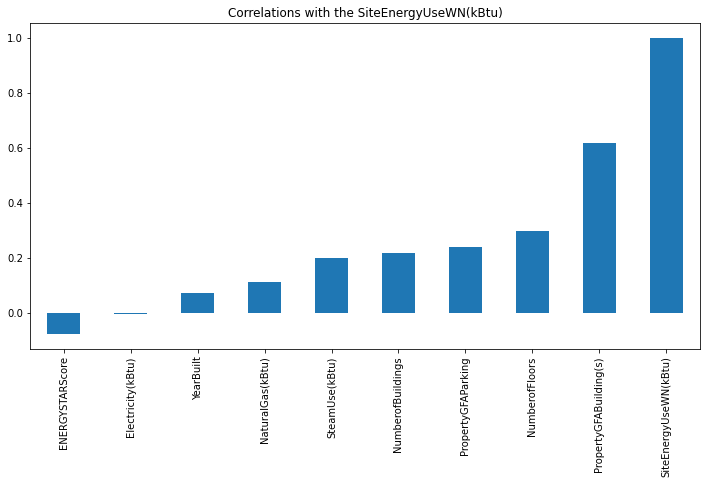

In [51]:
corr_with_EUI = data2[['YearBuilt', 'NumberofBuildings', 'NumberofFloors',
       'PropertyGFAParking', 'PropertyGFABuilding(s)', 'SteamUse(kBtu)',
       'Electricity(kBtu)', 'NaturalGas(kBtu)', 'BuildingType',
       'Neighborhood','ENERGYSTARScore','SiteEnergyUseWN(kBtu)']].corr()
plot_data = corr_with_EUI['SiteEnergyUseWN(kBtu)'].sort_values(ascending=True)
plt.figure(figsize=(12,6))
plot_data.plot.bar()
plt.title("Correlations with the SiteEnergyUseWN(kBtu)")
plt.show()
del plot_data

Cette image nous montre la corrélation linéaire entre les variables caractéristiques numériques et la variable cible, 'SiteEnergyUseWN'  , la consommation d'energie totale  de chaque batiments pour l'année 2016

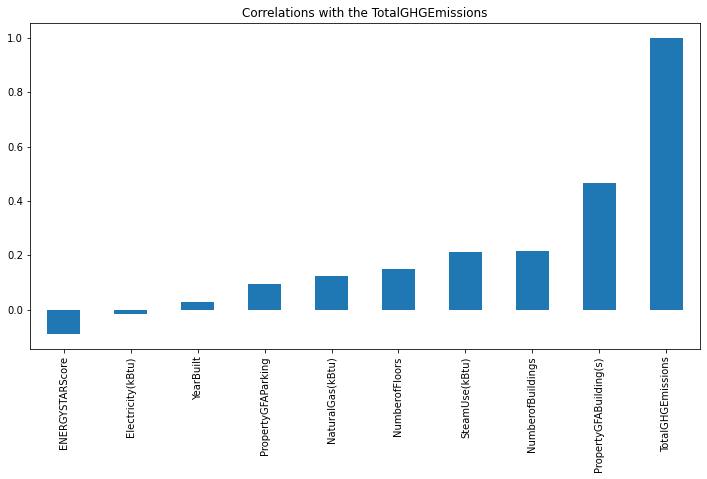

In [14]:
corr_with_EUI = data2[['YearBuilt', 'NumberofBuildings', 'NumberofFloors',
       'PropertyGFAParking', 'PropertyGFABuilding(s)', 'SteamUse(kBtu)',
       'Electricity(kBtu)', 'NaturalGas(kBtu)', 'BuildingType',
       'Neighborhood','ENERGYSTARScore','TotalGHGEmissions' ]].corr()
plot_data = corr_with_EUI['TotalGHGEmissions'].sort_values(ascending=True)
plt.figure(figsize=(12,6))
plot_data.plot.bar()
plt.title("Correlations with the TotalGHGEmissions")
plt.show()
del plot_data

Corrélation linéaire entre les variables caractéristiques numérique et mla variable cible 'TotalGHGEmissions', l'émission totale des gazs à effets de serre pour chaque batiments pour l'année 2016

In [57]:
var = ['avec','sans']
def ModeleOneHot(modele,numeroModele,var):
    if numeroModele == 1:
        
        encoder =  ce.OneHotEncoder(cols='Neighborhood',return_df=True,use_cat_names=True) 
        encoderNeighborhood = encoder.fit_transform(modele)
        encoder =  ce.OneHotEncoder(cols='BuildingType',return_df=True,use_cat_names=True) 
        encoderBuildingType = encoder.fit_transform(modele)
        encoderBuildingType = encoderBuildingType.select_dtypes(include=[np.number])
        encoderNeighborhood = encoderNeighborhood.select_dtypes(include=[np.number])
        if var == 'sans':
            encoderNeighborhood.drop(['Latitude', 'Longitude', 'PropertyGFATotal', 'LargestPropertyUseTypeGFA', 'ENERGYSTARScore', 'SiteEUI(kBtu/sf)',
           'SiteEUIWN(kBtu/sf)', 'SourceEUI(kBtu/sf)', 'SiteEnergyUse(kBtu)', 'SourceEUIWN(kBtu/sf)','TotalGHGEmissions', 'GHGEmissionsIntensity',  'Electricity(kWh)','NaturalGas(therms)'],axis = 1, inplace=True)
            encoderBuildingType.drop(['Latitude', 'Longitude', 'PropertyGFATotal', 'LargestPropertyUseTypeGFA', 'ENERGYSTARScore', 'SiteEUI(kBtu/sf)',
           'SiteEUIWN(kBtu/sf)', 'SourceEUI(kBtu/sf)', 'SiteEnergyUse(kBtu)', 'SourceEUIWN(kBtu/sf)','TotalGHGEmissions', 'GHGEmissionsIntensity',  'Electricity(kWh)','NaturalGas(therms)'],axis = 1, inplace=True)
        else:
            encoderNeighborhood.drop(['Latitude', 'Longitude', 'PropertyGFATotal', 'LargestPropertyUseTypeGFA', 'SiteEUI(kBtu/sf)',
           'SiteEUIWN(kBtu/sf)', 'SourceEUI(kBtu/sf)', 'SiteEnergyUse(kBtu)', 'SourceEUIWN(kBtu/sf)','TotalGHGEmissions', 'GHGEmissionsIntensity',  'Electricity(kWh)','NaturalGas(therms)'],axis = 1, inplace=True)
            encoderBuildingType.drop(['Latitude', 'Longitude', 'PropertyGFATotal', 'LargestPropertyUseTypeGFA', 'SiteEUI(kBtu/sf)',
           'SiteEUIWN(kBtu/sf)', 'SourceEUI(kBtu/sf)', 'SiteEnergyUse(kBtu)', 'SourceEUIWN(kBtu/sf)','TotalGHGEmissions', 'GHGEmissionsIntensity',  'Electricity(kWh)','NaturalGas(therms)'],axis = 1, inplace=True)
        modele = encoderBuildingType.merge(encoderNeighborhood, how = 'outer')
        cible = modele['SiteEnergyUseWN(kBtu)']
        median = cible.median()
        cible = cible.fillna(value = median)
        cible = np.log(cible)
        modele.drop('SiteEnergyUseWN(kBtu)',axis = 1, inplace = True)
        
    elif numeroModele == 2:
        
        encoder =  ce.OneHotEncoder(cols='Neighborhood',return_df=True,use_cat_names=True) 
        encoderNeighborhood = encoder.fit_transform(modele)
        encoder =  ce.OneHotEncoder(cols='BuildingType',return_df=True,use_cat_names=True) 
        encoderBuildingType = encoder.fit_transform(modele)
        encoderBuildingType = encoderBuildingType.select_dtypes(include=[np.number])
        encoderNeighborhood = encoderNeighborhood.select_dtypes(include=[np.number])
        if var == 'sans':
            encoderNeighborhood.drop(['Latitude', 'Longitude', 'PropertyGFATotal', 'LargestPropertyUseTypeGFA', 'ENERGYSTARScore', 'SiteEUI(kBtu/sf)','SiteEnergyUseWN(kBtu)',
           'SiteEUIWN(kBtu/sf)', 'SourceEUI(kBtu/sf)', 'SiteEnergyUse(kBtu)', 'SourceEUIWN(kBtu/sf)','TotalGHGEmissions', 'GHGEmissionsIntensity',  'Electricity(kWh)','NaturalGas(therms)'],axis = 1, inplace=True)
            encoderBuildingType.drop(['Latitude', 'Longitude', 'PropertyGFATotal', 'LargestPropertyUseTypeGFA', 'ENERGYSTARScore', 'SiteEUI(kBtu/sf)',
           'SiteEUIWN(kBtu/sf)', 'SourceEUI(kBtu/sf)', 'SiteEnergyUse(kBtu)', 'SourceEUIWN(kBtu/sf)','SiteEnergyUseWN(kBtu)', 'GHGEmissionsIntensity',  'Electricity(kWh)','NaturalGas(therms)'],axis = 1, inplace=True)
        else:
            encoderNeighborhood.drop(['Latitude', 'Longitude', 'PropertyGFATotal', 'LargestPropertyUseTypeGFA', 'SiteEUI(kBtu/sf)','SiteEnergyUseWN(kBtu)',
           'SiteEUIWN(kBtu/sf)', 'SourceEUI(kBtu/sf)', 'SiteEnergyUse(kBtu)', 'SourceEUIWN(kBtu/sf)','TotalGHGEmissions', 'GHGEmissionsIntensity',  'Electricity(kWh)','NaturalGas(therms)'],axis = 1, inplace=True)
            encoderBuildingType.drop(['Latitude', 'Longitude', 'PropertyGFATotal', 'LargestPropertyUseTypeGFA', 'SiteEUI(kBtu/sf)',
           'SiteEUIWN(kBtu/sf)', 'SourceEUI(kBtu/sf)', 'SiteEnergyUse(kBtu)', 'SourceEUIWN(kBtu/sf)','SiteEnergyUseWN(kBtu)', 'GHGEmissionsIntensity',  'Electricity(kWh)','NaturalGas(therms)'],axis = 1, inplace=True)
        modele = encoderBuildingType.merge(encoderNeighborhood, how = 'outer')
        cible = modele['TotalGHGEmissions']
        median = cible.median()
        cible = cible.fillna(value = median)
        cible = np.log(cible)
        modele.drop('TotalGHGEmissions',axis = 1, inplace = True)
        
    return modele, cible

In [58]:
[modele_avec_1, cible_avec_1] = ModeleOneHot(data2,1,"avec")
[modele_sans_1, cible_sans_1] = ModeleOneHot(data2,1,"sans")
[modele_avec_2, cible_avec_2] = ModeleOneHot(data2,2,"avec")
[modele_sans_2, cible_sans_2] = ModeleOneHot(data2,2,"sans")

C:\Users\agar.blohorn\anaconda3\lib\site-packages\category_encoders\utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):
C:\Users\agar.blohorn\anaconda3\lib\site-packages\category_encoders\utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):
C:\Users\agar.blohorn\anaconda3\lib\site-packages\category_encoders\utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):
C:\Users\agar.blohorn\anaconda3\lib\site-packages\category_encoders\utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):
C:\Users\agar.blohorn\anaconda3\

In [59]:
modele_avec_1

,BuildingType_NonResidential,BuildingType_Nonresidential COS,BuildingType_Multifamily MR (5-9),BuildingType_SPS-District K-12,BuildingType_Campus,BuildingType_Multifamily LR (1-4),BuildingType_Multifamily HR (10+),BuildingType_Nonresidential WA,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFAParking,PropertyGFABuilding(s),ENERGYSTARScore,SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),Neighborhood_downtown,Neighborhood_southeast,Neighborhood_northeast,Neighborhood_east,Neighborhood_north,Neighborhood_lake union,Neighborhood_greater duwamish,Neighborhood_magnolia / queen anne,Neighborhood_ballard,Neighborhood_northwest,Neighborhood_central,Neighborhood_southwest,Neighborhood_delridge,Neighborhood_delridge neighborhoods
0,1,0,0,0,0,0,0,0,1927,1.000000,12,0,88434,60.0,1.0,1.0,1.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1,0,0,0,0,0,0,0,1996,1.000000,11,15064,88502,61.0,0.0,1.0,1.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,1969,1.000000,41,196718,759392,43.0,1.0,1.0,1.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,1926,1.000000,10,0,61320,56.0,1.0,1.0,1.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,1980,1.000000,18,62000,113580,75.0,0.0,1.0,1.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
5,0,1,0,0,0,0,0,0,1999,1.000000,2,37198,60090,75.0,0.0,1.0,1.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
6,1,0,0,0,0,0,0,0,1926,1.000000,11,0,83008,27.0,0.0,1.0,1.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
7,1,0,0,0,0,0,0,0,1926,1.000000,8,0,102761,75.0,1.0,1.0,1.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
8,1,0,0,0,0,0,0,0,1904,1.000000,15,0,163984,43.0,0.0,1.0,1.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
9,0,0,1,0,0,0,0,0,1910,1.000000,6,1496,62216,1.0,1.0,1.0,1.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0


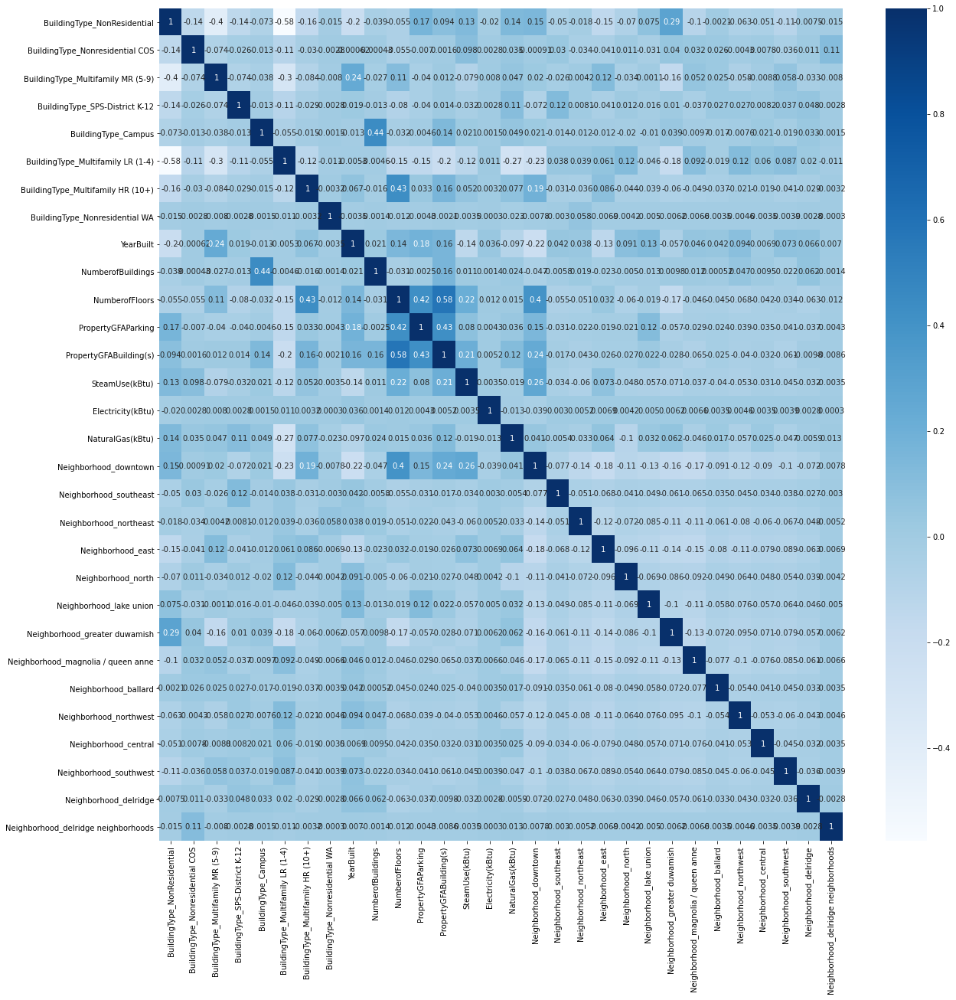

In [38]:
plt.figure(figsize = (20,20))
sns.heatmap(modele_sans_1.corr(),cmap="Blues", annot = True)
plt.show()

La heatmap permet de voir la corrélation linéaire entre variable caractéristique. les corrélations entre variable caractéristique doivent être faible pour être des variables indépendante

### Mise à l'échelle des variables

In [60]:
x_avec_1 = modele_avec_1[['YearBuilt', 'NumberofBuildings', 'NumberofFloors','PropertyGFAParking','PropertyGFABuilding(s)']]
scale = StandardScaler()
x_avec_1 = scale.fit_transform(x_avec_1)
print(x_avec_1)

[[-1.26271276 -0.07941767  1.33096662 -0.24732805  0.03487487]
 [ 0.82679515 -0.07941767  1.14839626  0.21613672  0.03538668]
 [ 0.00916162 -0.07941767  6.6255072   5.80497297  5.08498143]
 ...
 [ 0.16057524 -0.07941767 -0.67730739 -0.24732805 -0.53171331]
 [ 0.61481609 -0.07941767 -0.67730739 -0.24732805 -0.5246081 ]
 [-0.9296028  -0.07941767 -0.67730739 -0.24732805 -0.49331956]]


In [61]:
x_sans_1 = modele_sans_1[['YearBuilt', 'NumberofBuildings', 'NumberofFloors','PropertyGFAParking','PropertyGFABuilding(s)']]
scale = StandardScaler()
x_sans_1 = scale.fit_transform(x_sans_1)
print(x_sans_1)

[[-1.26271276 -0.07941767  1.33096662 -0.24732805  0.03487487]
 [ 0.82679515 -0.07941767  1.14839626  0.21613672  0.03538668]
 [ 0.00916162 -0.07941767  6.6255072   5.80497297  5.08498143]
 ...
 [ 0.16057524 -0.07941767 -0.67730739 -0.24732805 -0.53171331]
 [ 0.61481609 -0.07941767 -0.67730739 -0.24732805 -0.5246081 ]
 [-0.9296028  -0.07941767 -0.67730739 -0.24732805 -0.49331956]]


In [62]:
x_avec_2 = modele_avec_1[['YearBuilt', 'NumberofBuildings', 'NumberofFloors','PropertyGFAParking','PropertyGFABuilding(s)']]
scale = StandardScaler()
x_avec_2 = scale.fit_transform(x_avec_2)
print(x_avec_2)

[[-1.26271276 -0.07941767  1.33096662 -0.24732805  0.03487487]
 [ 0.82679515 -0.07941767  1.14839626  0.21613672  0.03538668]
 [ 0.00916162 -0.07941767  6.6255072   5.80497297  5.08498143]
 ...
 [ 0.16057524 -0.07941767 -0.67730739 -0.24732805 -0.53171331]
 [ 0.61481609 -0.07941767 -0.67730739 -0.24732805 -0.5246081 ]
 [-0.9296028  -0.07941767 -0.67730739 -0.24732805 -0.49331956]]


In [63]:
x_sans_2 = modele_sans_1[['YearBuilt', 'NumberofBuildings', 'NumberofFloors','PropertyGFAParking','PropertyGFABuilding(s)']]
scale = StandardScaler()
x_sans_2 = scale.fit_transform(x_sans_2)
print(x_sans_2)

[[-1.26271276 -0.07941767  1.33096662 -0.24732805  0.03487487]
 [ 0.82679515 -0.07941767  1.14839626  0.21613672  0.03538668]
 [ 0.00916162 -0.07941767  6.6255072   5.80497297  5.08498143]
 ...
 [ 0.16057524 -0.07941767 -0.67730739 -0.24732805 -0.53171331]
 [ 0.61481609 -0.07941767 -0.67730739 -0.24732805 -0.5246081 ]
 [-0.9296028  -0.07941767 -0.67730739 -0.24732805 -0.49331956]]


In [64]:
dfx1 = pd.DataFrame(data = x_avec_1, columns = ['YearBuilt1', 'NumberofBuildings1', 'NumberofFloors1','PropertyGFAParking1','PropertyGFABuilding(s)1'])
modelestandardiser1 = pd.concat( [modele_avec_1, dfx1 ], axis = 1)
modelestandardiser1 = modelestandardiser1.drop( ['YearBuilt', 'NumberofBuildings', 'NumberofFloors','PropertyGFAParking','PropertyGFABuilding(s)'], axis = 1)

dfx2 = pd.DataFrame(data = x_sans_1, columns = ['YearBuilt2', 'NumberofBuildings2', 'NumberofFloors2','PropertyGFAParking2','PropertyGFABuilding(s)2'])
modelestandardiser2 = pd.concat( [modele_sans_1, dfx2 ], axis = 1)
modelestandardiser2 = modelestandardiser2.drop( ['YearBuilt', 'NumberofBuildings', 'NumberofFloors','PropertyGFAParking','PropertyGFABuilding(s)'], axis = 1)

dfx3 = pd.DataFrame(data = x_avec_2, columns = ['YearBuilt3', 'NumberofBuildings3', 'NumberofFloors3','PropertyGFAParking3','PropertyGFABuilding(s)3'])
modelestandardiser3 = pd.concat( [modele_avec_2, dfx3 ], axis = 1)
modelestandardiser3 = modelestandardiser3.drop( ['YearBuilt', 'NumberofBuildings', 'NumberofFloors','PropertyGFAParking','PropertyGFABuilding(s)'], axis = 1)
modelestandardiser3 = modelestandardiser3.fillna(modelestandardiser3.median())

dfx4 = pd.DataFrame(data = x_sans_2, columns = ['YearBuilt4', 'NumberofBuildings4', 'NumberofFloors4','PropertyGFAParking4','PropertyGFABuilding(s)4'])
modelestandardiser4 = pd.concat( [modele_sans_2, dfx4 ], axis = 1)
modelestandardiser4 = modelestandardiser4.drop( ['YearBuilt', 'NumberofBuildings', 'NumberofFloors','PropertyGFAParking','PropertyGFABuilding(s)'], axis = 1)
modelestandardiser4 = modelestandardiser4.fillna(modelestandardiser4.median())

Nos variables numériques sont standardisés on passe maintenant a la séparation des jeux de données en jeu d'entrainement et je de test.

### Séparation des données en jeu d'entrainement et jeu de test

In [65]:
X1 = modelestandardiser1
y1 = cible_avec_1
X_train1, X_test1, y_train1, y_test1 = train_test_split(X1, y1, test_size=0.20, random_state=42)

X2 = modelestandardiser2
y2 = cible_sans_1
X_train2, X_test2, y_train2, y_test2 = train_test_split(X2, y2,test_size=0.20, random_state=42)

X3 = modelestandardiser3
y3 = cible_avec_2
X_train3, X_test3, y_train3, y_test3 = train_test_split(X3, y3,test_size=0.20, random_state=42)

X4 = modelestandardiser4
y4 = cible_sans_2
X_train4, X_test4, y_train4, y_test4 = train_test_split(X4, y4,test_size=0.20, random_state=42)

In [61]:
print("X_train1 shape: {}".format(X_train1.shape))
print("y_train1 shape: {}".format(y_train1.shape))
print("X_test1 shape: {}".format(X_test1.shape))
print("y_test1 shape: {}".format(y_test1.shape))

X_train1 shape: (2649, 31)
y_train1 shape: (2649,)
X_test1 shape: (663, 31)
y_test1 shape: (663,)


In [21]:
print("X_train2 shape: {}".format(X_train2.shape))
print("y_train2 shape: {}".format(y_train2.shape))
print("X_test2 shape: {}".format(X_test2.shape))
print("y_test2 shape: {}".format(y_test2.shape))

X_train2 shape: (2649, 30)
y_train2 shape: (2649,)
X_test2 shape: (663, 30)
y_test2 shape: (663,)


In [22]:
print("X_train3 shape: {}".format(X_train3.shape))
print("y_train3 shape: {}".format(y_train3.shape))
print("X_test3 shape: {}".format(X_test3.shape))
print("y_test3 shape: {}".format(y_test3.shape))

X_train3 shape: (2651, 31)
y_train3 shape: (2651,)
X_test3 shape: (663, 31)
y_test3 shape: (663,)


In [23]:
print("X_train4 shape: {}".format(X_train4.shape))
print("y_train4 shape: {}".format(y_train4.shape))
print("X_test4 shape: {}".format(X_test4.shape))
print("y_test4 shape: {}".format(y_test4.shape))

X_train4 shape: (2662, 30)
y_train4 shape: (2662,)
X_test4 shape: (666, 30)
y_test4 shape: (666,)


<AxesSubplot:xlabel='SiteEnergyUseWN(kBtu)', ylabel='Count'>

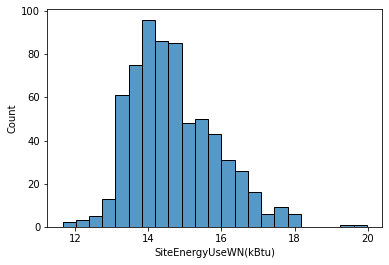

In [24]:
sns.histplot(y_test1)

<AxesSubplot:xlabel='TotalGHGEmissions', ylabel='Count'>

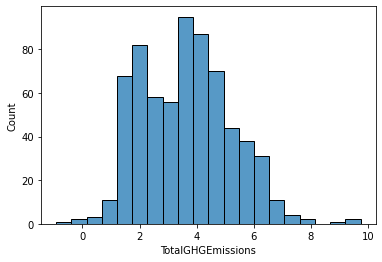

In [25]:
sns.histplot(y_test4)

### Modèle Dummy avec la méthode one hot encoder

Le modèle Dummy est un modèle parfait pour établir la base et avoir un comparatifs avec les autres modèles de machine learning

In [26]:
clf = DummyRegressor(strategy="median")

In [27]:
clf.fit(X_train1, y_train1)
clf.score(X_test1, y_test1)

-0.0427872331412853

In [28]:
clf.fit(X_train2, y_train2)
clf.score(X_test2, y_test2)

-0.0427872331412853

In [29]:
clf.fit(X_train3, y_train3)
clf.score(X_test3, y_test3)

-0.00536182552129949

In [30]:
y_train3

1459    5.640026
535     4.786908
1714    5.559797
2484    1.504077
1097    1.118415
2972    1.396245
2322    5.639244
859     3.485539
3075    4.826472
69      6.425711
3008    4.225227
2921    2.091864
1916    2.861057
436     3.259634
2228    3.356897
3204    3.380995
1407    1.976855
208     3.464798
3142    4.806886
565     3.942746
313     6.119176
601     4.894101
233     1.806648
746     1.568616
2688    2.489894
1552    1.623341
2313    3.203965
111     6.045929
1398    2.242835
964     2.587012
755     3.385745
942     3.262318
2562    3.680091
472     5.222462
2816    4.152142
2268    1.530395
3307    2.052841
3004    3.451257
2663    4.109726
2194    3.743368
2665    3.293612
1533    2.701361
3209    8.753199
655     4.259294
1432    4.383151
361     3.472587
135     4.383026
2066    3.527536
2400    3.239854
3081    4.977492
2500    1.876407
366     3.241811
2543    4.028561
29      5.599088
2763    5.882124
22      3.651437
3094    1.769855
1090    3.934371
1053    2.2690

In [31]:
clf.fit(X_train4, y_train4)
clf.score(X_test4, y_test4)

-0.0061894427844502165

Le R2 est négatif, ce modèle n'est pas du tout performant

Le score est le R^2 qui est une mesure. Elle nous dit que l 'étendu de la proportion de la variance d'une variables dépendante est expliquée par la variance des variables indépendantes. Simplement, Lorsque la variance estime les tendances, le R carré représente la dispersion autour de la ligne passant par les points.

### Modèles avec one hot encoder

#### Regression linéaire

In [37]:
def linear_regression(X_train, X_test,  y_train, y_test):
        reg =  LinearRegression()
        reg.fit(X_train, y_train)
        y_pred = reg.predict(X_test)
        mse = mean_squared_error(y_test, y_pred)
        print("\nLinear Regression Model\n")
        print('Coefficients:\n', reg.coef_)
        print('Intercept:\n', reg.intercept_)
        print("\n")
        print("Training set score: {:.2f}\n".format(reg.score(X_train,y_train)))
        print("Test set score: {:.2f}\n".format(reg.score(X_test,y_test)))
        print('Mean squared error (RMSE): %.2f\n'% mean_squared_error(y_test, y_pred))
        print('Mean absolute error (MAE): %.2f\n'% mae(y_test, y_pred))
        print('Coefficient of determination (R^2): %.2f\n'% r2_score(y_test, y_pred))
        return r2_score(y_test, y_pred), mean_squared_error(y_test, y_pred)

In [38]:
li_EUI_ENER  = linear_regression(X_train1, X_test1,  y_train1, y_test1)
li_EUI  = linear_regression(X_train2, X_test2,y_train2, y_test2)
li_GHG_ENER  = linear_regression(X_train3, X_test3,  y_train3, y_test3)
li_GHG  = linear_regression(X_train4, X_test4,  y_train4, y_test4)


Linear Regression Model

Coefficients:
 [ 5.56242977e-02  1.69596680e-01 -2.08163531e-01  1.03444126e-01
  1.86935296e-01 -4.77275093e-01  1.69838225e-01  2.91433544e-16
 -8.68654904e-03  6.35723639e-01 -1.16573418e-15  5.36400873e-01
  3.25899499e-01  5.51693908e-02  1.03579830e-01  1.43160855e-01
  1.62201822e-01  2.21100273e-01 -2.41190379e-01  1.68038629e-02
 -6.11558898e-02  8.69949472e-02  7.28993761e-02 -2.30386281e-02
  5.52376212e-02 -9.17662580e-01  1.26508523e-01  7.89086061e-02
 -2.37220119e-02  1.02262828e-01  5.33189440e-01]
Intercept:
 14.931331406503809


Training set score: 0.62

Test set score: 0.58

Mean squared error (RMSE): 0.57

Mean absolute error (MAE): 0.54

Coefficient of determination (R^2): 0.58


Linear Regression Model

Coefficients:
 [ 9.17044996e-02  1.33438989e-01 -2.54203727e-01 -3.27475147e-02
  1.65661520e-01 -4.59151251e-01  3.55297484e-01  2.22044605e-16
  6.74449429e-01  2.77555756e-16  5.40476667e-01  3.19963281e-01
  7.13337442e-02  9.53869026e

#### Regression ridge 

In [317]:
from sklearn.linear_model import Ridge

Essayons la régression de ridge qui pénalise le carré de la norme L2 (longueur euclidienne) Le sur-apprentissage est moins probable avec ridge

In [40]:
def ridge(X_train, X_test,  y_train, y_test):
        ridge = Ridge().fit(X_train,y_train)
        y_pred = ridge.predict(X_test)
        mse = mean_squared_error(y_test, y_pred)
        print("\nRidge Regression Model\n")
        print('Coefficients:\n', ridge.coef_)
        print('Intercept:\n', ridge.intercept_)
        print("\n")
        print("Training set score: {:.2f}\n".format(ridge.score(X_train,y_train)))
        print("Test set score: {:.2f}\n".format(ridge.score(X_test,y_test)))
        print('Mean squared error (MSE): %.2f\n'% mean_squared_error(y_test, y_pred))
        print('Mean absolute error (MAE): %.2f\n'% mae(y_test, y_pred))
        print('Coefficient of determination (R^2): %.2f\n'% r2_score(y_test, y_pred))
        return r2_score(y_test, y_pred), mean_squared_error(y_test, y_pred)

In [41]:
ri_EUI_ENE = ridge(X_train1, X_test1,  y_train1, y_test1)
ri_EUI = ridge(X_train2, X_test2,  y_train2, y_test2)
ri_GHG_ENE = ridge(X_train3, X_test3,  y_train3, y_test3)
ri_GHG = ridge(X_train4, X_test4,  y_train4, y_test4)


Ridge Regression Model

Coefficients:
 [ 0.05888115  0.16385443 -0.20431464  0.10541046  0.17892709 -0.47344663
  0.17068815  0.         -0.00868831  0.62930941  0.          0.53540679
  0.29144789  0.02123508  0.06871901  0.1086833   0.12681253  0.18585166
 -0.27407623 -0.0174414  -0.09429666  0.05230393  0.0383112  -0.05729926
  0.02084702 -0.47109806  0.12610773  0.07933061 -0.02321956  0.10228519
  0.53335636]
Intercept:
 14.96335685885185


Training set score: 0.62

Test set score: 0.58

Mean squared error (MSE): 0.57

Mean absolute error (MAE): 0.54

Coefficient of determination (R^2): 0.58


Ridge Regression Model

Coefficients:
 [ 0.09475216  0.12810058 -0.25064996 -0.02861842  0.15895045 -0.45558395
  0.35304914  0.          0.6673809   0.          0.53945959  0.28521723
  0.03641008  0.06011389  0.1104247   0.12035268  0.15027086 -0.25404641
 -0.04730121 -0.06562658  0.01472266  0.07742415 -0.05950433  0.05047968
 -0.4789374   0.13553643  0.08094427 -0.02732441  0.09801571  

#### Regression lasso

In [42]:
from sklearn.linear_model import Lasso

Une alternantive a ridge pour les regressions linéaires régularisées s'appelle  Lasso ( Least Absolute Shrinkage and selection Operator). Elle contraint les coefficients à se rapprocher de zéro avec la régularisation L1. Elle pénalise la somme des valeurs absolues des coefficients au lieu de la moitié du carré de la norme L2.Certains coefficients peuvent être à 0 donc des caractéristiques qui ne servent à rien. Elle peut être vu comme un modèle de séléction des variables.

In [43]:
def lasso(X_train, X_test,  y_train, y_test):
        lasso = Lasso().fit(X_train,y_train)
        y_pred = lasso.predict(X_test)
        mse = mean_squared_error(y_test, y_pred)
        print("\nLasso Regression Model\n")
        print('Coefficients:\n', lasso.coef_)
        print('Intercept:\n', lasso.intercept_)
        print("\n")
        print("Training set score: {:.2f}\n".format(lasso.score(X_train,y_train)))
        print("Test set score: {:.2f}\n".format(lasso.score(X_test,y_test)))
        print('Mean squared error (MSE): %.2f\n'% mean_squared_error(y_test, y_pred))
        print('Mean absolute error (MAE): %.2f\n'% mae(y_test, y_pred))
        print('Coefficient of determination (R^2): %.2f\n'% r2_score(y_test, y_pred))
        print("Number of features used: {}".format(np.sum(lasso.coef_!=0)))
        return r2_score(y_test, y_pred), mean_squared_error(y_test, y_pred)


In [44]:
las_EUI_ENE = lasso(X_train1, X_test1,  y_train1, y_test1)
las_EUI = lasso(X_train2, X_test2,  y_train2, y_test2)
las_GHG_ENE = lasso(X_train3, X_test3,  y_train3, y_test3)
las_GHG = lasso(X_train4, X_test4,  y_train4, y_test4)


Lasso Regression Model

Coefficients:
 [ 0.          0.          0.          0.          0.         -0.
  0.          0.         -0.00596314  0.          0.          0.
  0.         -0.         -0.         -0.         -0.          0.
 -0.         -0.         -0.         -0.         -0.         -0.
  0.         -0.          0.          0.          0.          0.
  0.        ]
Intercept:
 15.044864064783841


Training set score: 0.03

Test set score: 0.01

Mean squared error (MSE): 1.35

Mean absolute error (MAE): 0.92

Coefficient of determination (R^2): 0.01

Number of features used: 1

Lasso Regression Model

Coefficients:
 [ 0.  0. -0.  0.  0. -0.  0.  0.  0.  0.  0.  0. -0. -0. -0. -0.  0. -0.
 -0. -0. -0. -0. -0.  0. -0.  0.  0.  0.  0.  0.]
Intercept:
 14.630012652561984


Training set score: 0.00

Test set score: -0.00

Mean squared error (MSE): 1.37

Mean absolute error (MAE): 0.92

Coefficient of determination (R^2): -0.00

Number of features used: 0

Lasso Regression Model

C

#### Random Forest  

In [45]:
from sklearn.ensemble import RandomForestRegressor

Arbre de décision ou random forest est un modèle de regression ou de classification qui se base sur une suite de décision jusqu'a mettre la donnée de la bonne catégorie.

In [46]:
def tree(X_train, X_test,  y_train, y_test):
        tree =  RandomForestRegressor()
        tree.fit(X_train,y_train)
        y_pred = tree.predict(X_test)
        mse = mean_squared_error(y_test, y_pred)
        print("\nRandom forest Model\n")
        print("Training set score: {:.2f}\n".format(tree.score(X_train,y_train)))
        print("Test set score: {:.2f}\n".format(tree.score(X_test,y_test)))
        print('Mean squared error (MSE): %.2f\n'% mean_squared_error(y_test, y_pred))
        print('Mean absolute error (MAE): %.2f\n'% mae(y_test, y_pred))
        print('Coefficient of determination (R^2): %.2f\n'% r2_score(y_test, y_pred))
        return r2_score(y_test, y_pred), mean_squared_error(y_test, y_pred)


In [47]:
tree_EUI_ENE = tree(X_train1, X_test1,  y_train1, y_test1)
tree_EUI = tree(X_train2, X_test2,  y_train2, y_test2)
tree_GHG_ENE = tree(X_train3, X_test3,  y_train3, y_test3)
tree_GHG = tree(X_train4, X_test4,  y_train4, y_test4)


Random forest Model

Training set score: 0.96

Test set score: 0.75

Mean squared error (MSE): 0.34

Mean absolute error (MAE): 0.39

Coefficient of determination (R^2): 0.75


Random forest Model

Training set score: 0.96

Test set score: 0.72

Mean squared error (MSE): 0.39

Mean absolute error (MAE): 0.43

Coefficient of determination (R^2): 0.72


Random forest Model

Training set score: 0.95

Test set score: 0.59

Mean squared error (MSE): 0.85

Mean absolute error (MAE): 0.69

Coefficient of determination (R^2): 0.59


Random forest Model

Training set score: 0.94

Test set score: 0.59

Mean squared error (MSE): 1.03

Mean absolute error (MAE): 0.77

Coefficient of determination (R^2): 0.59



#### XGBoost pour la regression

In [232]:
def XGBoost(X_train, X_test,  y_train, y_test):
        xgb_r = xg.XGBRegressor( n_estimators = 10, seed = 123) 
        xgb_r.fit(X_train, y_train)
        y_pred = xgb_r.predict(X_test)
        mse = mean_squared_error(y_test, y_pred)
        print("\nXGBoost Model\n")
        print("Training set score: {:.2f}\n".format(xgb_r.score(X_train,y_train)))
        print("Test set score: {:.2f}\n".format(xgb_r.score(X_test,y_test)))
        print('Mean squared error (MSE): %.2f\n'% mean_squared_error(y_test, y_pred))
        print('Mean absolute error (MSE): %.2f\n'% mae(y_test, y_pred))
        print('Coefficient of determination (R^2): %.2f\n'% r2_score(y_test, y_pred))
        return r2_score(y_test, y_pred), mean_squared_error(y_test, y_pred)


In [233]:
boost_EUI_ENE = XGBoost(X_train1, X_test1,  y_train1, y_test1)
boost_EUI = XGBoost(X_train2, X_test2,  y_train2, y_test2)
boost_GHG_ENE = XGBoost(X_train3, X_test3,  y_train3, y_test3)
boost_GHG = XGBoost(X_train4, X_test4,  y_train4, y_test4)


XGBoost Model

Training set score: 0.66

Test set score: 0.62

Mean squared error (MSE): 0.52

Mean absolute error (MSE): 0.53

Coefficient of determination (R^2): 0.62


XGBoost Model

Training set score: 0.62

Test set score: 0.60

Mean squared error (MSE): 0.55

Mean absolute error (MSE): 0.55

Coefficient of determination (R^2): 0.60


XGBoost Model

Training set score: 0.72

Test set score: 0.59

Mean squared error (MSE): 0.86

Mean absolute error (MSE): 0.71

Coefficient of determination (R^2): 0.59


XGBoost Model

Training set score: 0.71

Test set score: 0.58

Mean squared error (MSE): 1.04

Mean absolute error (MSE): 0.76

Coefficient of determination (R^2): 0.58



In [234]:
#test_score et mse
print(boost_EUI_ENE)
print(boost_EUI)
print(boost_GHG_ENE)
print(boost_GHG)

(0.6198852578640051, 0.5202968656125984)
(0.5957226234334232, 0.5533704130591663)
(0.5891645832089566, 0.8615707081417736)
(0.5834422906608003, 1.0372036159107045)


### Traitement des variable catégorielle avec Target Encoder

In [51]:
#selectionner les colonnes numeriques et colonnes categorielles
data_numerique = data2.select_dtypes(include=[np.number])
num_cols = data_numerique.columns.values
data_categ = data2.select_dtypes(exclude=[np.number])
categ_cols = data_categ.columns.values
print(num_cols)
print('\n')
print(categ_cols)

['Latitude' 'Longitude' 'YearBuilt' 'NumberofBuildings' 'NumberofFloors'
 'PropertyGFATotal' 'PropertyGFAParking' 'PropertyGFABuilding(s)'
 'LargestPropertyUseTypeGFA' 'ENERGYSTARScore' 'SiteEUI(kBtu/sf)'
 'SiteEUIWN(kBtu/sf)' 'SourceEUI(kBtu/sf)' 'SourceEUIWN(kBtu/sf)'
 'SiteEnergyUse(kBtu)' 'SiteEnergyUseWN(kBtu)' 'SteamUse(kBtu)'
 'Electricity(kWh)' 'Electricity(kBtu)' 'NaturalGas(therms)'
 'NaturalGas(kBtu)' 'TotalGHGEmissions' 'GHGEmissionsIntensity']


['BuildingType' 'PrimaryPropertyType' 'PropertyName' 'Address'
 'Neighborhood' 'ListOfAllPropertyUseTypes' 'LargestPropertyUseType']


In [52]:
var = ['avec','sans']
cible = ['SiteEnergyUseWN(kBtu)', 'TotalGHGEmissions']

def modeletarget(data2, var, cible):
    global data3;
    data3 = data2[['YearBuilt', 'NumberofBuildings', 'NumberofFloors',
       'PropertyGFAParking', 'PropertyGFABuilding(s)', 'SteamUse(kBtu)',
       'Electricity(kBtu)', 'NaturalGas(kBtu)', 'BuildingType',
       'Neighborhood']]
    global target3
    if var == 'sans' and cible == 'SiteEnergyUseWN(kBtu)':
        target3 = data2[cible]
        target3 = data2['SiteEnergyUseWN(kBtu)']
        target3 = np.log(target3)
               
 
    elif var == 'sans' and cible == 'TotalGHGEmissions':
        target3 = data2[cible]
        target3 = data2['SiteEnergyUseWN(kBtu)']
        target3 = np.log(target3)
        
        
    if var == 'avec' and cible == 'SiteEnergyUseWN(kBtu)':
        data3 = data2[['YearBuilt', 'NumberofBuildings', 'NumberofFloors',
       'PropertyGFAParking', 'PropertyGFABuilding(s)', 'SteamUse(kBtu)',
       'Electricity(kBtu)', 'NaturalGas(kBtu)', 'BuildingType',
       'Neighborhood','ENERGYSTARScore']]
        target3 = data2[cible]
        target3 = data2['SiteEnergyUseWN(kBtu)']
        target3 = np.log(target3)
       
       
    elif var == 'avec' and cible == 'TotalGHGEmissions':
        data3 = data2[['YearBuilt', 'NumberofBuildings', 'NumberofFloors',
       'PropertyGFAParking', 'PropertyGFABuilding(s)', 'SteamUse(kBtu)',
       'Electricity(kBtu)', 'NaturalGas(kBtu)', 'BuildingType',
       'Neighborhood','ENERGYSTARScore']]
        target3 = data2[cible]
        median = target3 .median()
        target3  = target3 .fillna(value = median)
        target3 = data2['SiteEnergyUseWN(kBtu)']
        target3 = np.log(target3)
    
      
        
    X = data3   
    X_trainT, X_testT, y_trainT, y_testT = train_test_split(X, target3, random_state=0)

    encoderbu = ce.TargetEncoder()
    X_trainT['BuildingType'] = encoderbu.fit_transform(X_trainT['BuildingType'],y_trainT)
    X_testT['BuildingType'] = encoderbu.fit_transform(X_testT['BuildingType'],y_testT)
    encoderne = ce.TargetEncoder()
    X_trainT['Neighborhood'] = encoderne.fit_transform(X_trainT['Neighborhood'],y_trainT)
    X_testT['Neighborhood'] = encoderne.fit_transform(X_testT['Neighborhood'],y_testT)
    
    return X_trainT,X_testT,y_trainT,y_testT

In [53]:
[X_trainT,X_testT,y_trainT,y_testT] = modeletarget(data2, 'sans', 'SiteEnergyUseWN(kBtu)')
[X_trainTESS,X_testTESS,y_trainTESS,y_testTESS] = modeletarget(data2, 'avec', 'SiteEnergyUseWN(kBtu)')
[X_trainTGHG,X_testTGHG,y_trainTGHG,y_testTGHG] = modeletarget(data2, 'sans', 'TotalGHGEmissions')
[X_trainTGHGESS,X_testTGHGESS,y_trainTGHGESS,y_testTGHGESS] = modeletarget(data2, 'avec', 'TotalGHGEmissions')

C:\Users\agar.blohorn\anaconda3\lib\site-packages\category_encoders\utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):
<ipython-input-52-e60c2b191ce8>:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_trainT['BuildingType'] = encoderbu.fit_transform(X_trainT['BuildingType'],y_trainT)
C:\Users\agar.blohorn\anaconda3\lib\site-packages\category_encoders\utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):
<ipython-input-52-e60c2b191ce8>:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a 

In [54]:
y_testT.sort_values()

1752    11.666869
1019    11.762780
1645    11.771181
591     11.930018
1253    12.040396
2128    12.278165
2613    12.334947
1023    12.423665
992     12.495510
1720    12.554173
2134    12.677970
1628    12.722617
2372    12.793755
680     12.819342
1361    12.878554
2022    12.911767
719     12.916905
2454    12.925314
146     12.972641
3020    12.984484
1315    12.986782
1711    13.003919
1119    13.022792
2193    13.029040
2230    13.029478
1678    13.041599
1115    13.043698
2333    13.058302
2235    13.095783
2126    13.125239
1571    13.128764
2929    13.143431
1205    13.164509
739     13.177675
1897    13.178608
2482    13.180866
1410    13.183905
2368    13.190329
2898    13.203479
3210    13.207021
3098    13.214261
1984    13.219030
2293    13.240893
2794    13.244909
1790    13.258851
2555    13.262160
1716    13.272994
658     13.276060
1650    13.280115
2678    13.287883
2516    13.288194
2159    13.288521
2330    13.292254
2662    13.294011
1661    13.296347
1859    13

In [55]:
print("X_trainT shape: {}".format(X_trainT.shape))
print("y_trainT shape: {}".format(y_trainT.shape))
print("X_testT shape: {}".format(X_testT.shape))
print("y_testT shape: {}".format(y_testT.shape))

X_trainT shape: (2484, 10)
y_trainT shape: (2484,)
X_testT shape: (828, 10)
y_testT shape: (828,)


In [56]:
X_trainT.isnull().sum()

YearBuilt                 0
NumberofBuildings         0
NumberofFloors            0
PropertyGFAParking        0
PropertyGFABuilding(s)    0
SteamUse(kBtu)            0
Electricity(kBtu)         0
NaturalGas(kBtu)          0
BuildingType              0
Neighborhood              0
dtype: int64

In [57]:
print("X_trainTESS shape: {}".format(X_trainTESS.shape))
print("y_trainTESS shape: {}".format(y_trainTESS.shape))
print("X_testTESS shape: {}".format(X_testTESS.shape))
print("y_testTESS shape: {}".format(y_testTESS.shape))

X_trainTESS shape: (2484, 11)
y_trainTESS shape: (2484,)
X_testTESS shape: (828, 11)
y_testTESS shape: (828,)


In [58]:
print("X_trainTGHG shape: {}".format(X_trainTGHG.shape))
print("y_trainTGHG shape: {}".format(y_trainTGHG.shape))
print("X_testTGHG shape: {}".format(X_testTGHG.shape))
print("y_testTGHG shape: {}".format(y_testTGHG.shape))

X_trainTGHG shape: (2484, 10)
y_trainTGHG shape: (2484,)
X_testTGHG shape: (828, 10)
y_testTGHG shape: (828,)


In [59]:
print("X_trainTGHGESS shape: {}".format(X_trainTGHGESS.shape))
print("y_trainTGHGESS shape: {}".format(y_trainTGHGESS.shape))
print("X_testTGHGESS shape: {}".format(X_testTGHGESS.shape))
print("y_testTGHGESS shape: {}".format(y_testTGHGESS.shape))

X_trainTGHGESS shape: (2484, 11)
y_trainTGHGESS shape: (2484,)
X_testTGHGESS shape: (828, 11)
y_testTGHGESS shape: (828,)


### Modèle avec Target Encoder

Je vais essayer la méthode Target Encoder pour transformer les variables catégorielles. Elle est bien lorsque l'encodage par variable indicatrices n'est pas possible, lorsqu'il y a trop de catégories. Elle consiste pour chacune des catégories, a remplacer la catégorie par la différence entre la moyenne des valeurs cibles de la catégories et la moyenne de la variable cible. 



Cependant, cet encodage entraîne une perte d’information : seule une valeur de «corrélation» avec la cible y est retenue. Cela signifie que si deux catégories ont des valeurs proches pour la cible y en moyenne, elles ne pourront pas être distinguées par le modèle.

#### Regression linéaire

In [60]:
lr_EUI = linear_regression(X_trainT, X_testT,  y_trainT, y_testT)
lr_EUI_ESS = linear_regression(X_trainTESS, X_testTESS,  y_trainTESS, y_testTESS)
lr_GHG = linear_regression(X_trainTGHG, X_testTGHG,  y_trainTGHG, y_testTGHG)
lr_GHG_ESS = linear_regression(X_trainTGHGESS,X_testTGHGESS,y_trainTGHGESS,y_testTGHGESS)


Linear Regression Model

Coefficients:
 [ 4.15296648e-03  5.25053236e-02 -6.31313334e-03  3.65764683e-06
  3.69357158e-06  6.62498397e-01 -8.60422844e-16  4.94224627e-01
  4.68193981e-01  3.85515954e-01]
Intercept:
 -6.740327198079122


Training set score: 0.58

Test set score: 0.55

Mean squared error (RMSE): 0.57

Mean absolute error (MAE): 0.57

Coefficient of determination (R^2): 0.55


Linear Regression Model

Coefficients:
 [ 4.11753528e-03  5.22404574e-02 -7.09091293e-03  3.83099910e-06
  3.79754221e-06  6.57090944e-01  5.82867088e-16  5.00037597e-01
  4.30547204e-01  3.87962378e-01 -7.96038587e-03]
Intercept:
 -5.612187188369031


Training set score: 0.61

Test set score: 0.58

Mean squared error (RMSE): 0.53

Mean absolute error (MAE): 0.55

Coefficient of determination (R^2): 0.58


Linear Regression Model

Coefficients:
 [ 4.15296648e-03  5.25053236e-02 -6.31313334e-03  3.65764683e-06
  3.69357158e-06  6.62498397e-01 -8.60422844e-16  4.94224627e-01
  4.68193981e-01  3.85515

#### Regression ridge

In [61]:
re_EUI = ridge(X_trainT, X_testT,  y_trainT, y_testT)
re_EUI_ESS = ridge(X_trainTESS, X_testTESS,  y_trainTESS, y_testTESS)
re_GHG = ridge(X_trainTGHG, X_testTGHG,  y_trainTGHG, y_testTGHG)
re_GHG_ESS = ridge(X_trainTGHGESS,X_testTGHGESS,y_trainTGHGESS,y_testTGHGESS)


Ridge Regression Model

Coefficients:
 [ 4.13967900e-03  5.24742988e-02 -6.25513588e-03  3.65705086e-06
  3.69623702e-06  6.54965720e-01  0.00000000e+00  4.93256573e-01
  4.68013470e-01  3.84633805e-01]
Intercept:
 -6.698176014126677


Training set score: 0.58

Test set score: 0.55

Mean squared error (MSE): 0.57

Mean absolute error (MAE): 0.57

Coefficient of determination (R^2): 0.55


Ridge Regression Model

Coefficients:
 [ 4.10425770e-03  5.22050268e-02 -7.03366171e-03  3.83042216e-06
  3.80019138e-06  6.49605864e-01  0.00000000e+00  4.99043110e-01
  4.30434644e-01  3.87045068e-01 -7.96185480e-03]
Intercept:
 -5.570408990743136


Training set score: 0.61

Test set score: 0.58

Mean squared error (MSE): 0.53

Mean absolute error (MAE): 0.55

Coefficient of determination (R^2): 0.58


Ridge Regression Model

Coefficients:
 [ 4.13967900e-03  5.24742988e-02 -6.25513588e-03  3.65705086e-06
  3.69623702e-06  6.54965720e-01  0.00000000e+00  4.93256573e-01
  4.68013470e-01  3.84633805e-

#### Regression lasso

In [62]:
la_EUI = lasso(X_trainT, X_testT,  y_trainT, y_testT)
la_EUI_ESS = lasso(X_trainTESS, X_testTESS,  y_trainTESS, y_testTESS)
la_GHG = lasso(X_trainTGHG, X_testTGHG,  y_trainTGHG, y_testTGHG)
la_GHG_ESS = lasso(X_trainTGHGESS,X_testTGHGESS,y_trainTGHGESS,y_testTGHGESS)


Lasso Regression Model

Coefficients:
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 4.23770223e-06
 4.81679940e-06 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
Intercept:
 14.191832007655002


Training set score: 0.43

Test set score: 0.40

Mean squared error (MSE): 0.77

Mean absolute error (MAE): 0.68

Coefficient of determination (R^2): 0.40

Number of features used: 2

Lasso Regression Model

Coefficients:
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  4.34816764e-06
  4.86610531e-06  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -7.26851517e-03]
Intercept:
 14.691619037885797


Training set score: 0.46

Test set score: 0.43

Mean squared error (MSE): 0.72

Mean absolute error (MAE): 0.66

Coefficient of determination (R^2): 0.43

Number of features used: 3

Lasso Regression Model

Coefficients:
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 4.23770223e-06
 4.81679940e-06 0.00000000e+00 0.00000000e+00 0.0000000

#### Random Forest 

In [63]:
tr_EUI = tree(X_trainT, X_testT,  y_trainT, y_testT)
tr_EUI_ESS = tree(X_trainTESS, X_testTESS,  y_trainTESS, y_testTESS)
tr_GHG = tree(X_trainTGHG, X_testTGHG,y_trainTGHG, y_testTGHG)
tr_GHG_ESS = tree(X_trainTGHGESS,X_testTGHGESS,y_trainTGHGESS,y_testTGHGESS)


Random forest Model

Training set score: 0.96

Test set score: 0.68

Mean squared error (MSE): 0.41

Mean absolute error (MAE): 0.45

Coefficient of determination (R^2): 0.68


Random forest Model

Training set score: 0.97

Test set score: 0.73

Mean squared error (MSE): 0.34

Mean absolute error (MAE): 0.41

Coefficient of determination (R^2): 0.73


Random forest Model

Training set score: 0.96

Test set score: 0.68

Mean squared error (MSE): 0.40

Mean absolute error (MAE): 0.44

Coefficient of determination (R^2): 0.68


Random forest Model

Training set score: 0.97

Test set score: 0.73

Mean squared error (MSE): 0.35

Mean absolute error (MAE): 0.41

Coefficient of determination (R^2): 0.73



#### XGBoost pour la regression

In [64]:
xg_EUI = XGBoost(X_trainT, X_testT,  y_trainT, y_testT)
xg_EUI_ESS = XGBoost(X_trainTESS, X_testTESS,  y_trainTESS, y_testTESS)
xg_GHG = XGBoost(X_trainTGHG, X_testTGHG,  y_trainTGHG, y_testTGHG)
xg_GHG_ESS = XGBoost(X_trainTGHGESS,X_testTGHGESS,y_trainTGHGESS,y_testTGHGESS)

[09:10:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.

XGBoost Model

Training set score: 0.64

Test set score: 0.52

Mean squared error (MSE): 0.61

Coefficient of determination (R^2): 0.52

[09:10:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.

XGBoost Model

Training set score: 0.67

Test set score: 0.57

Mean squared error (MSE): 0.55

Coefficient of determination (R^2): 0.57

[09:10:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.

XGBoost Model

Training set score: 0.64

Test set score: 0.52

Mean squared error (MSE): 0.61

Coefficient of determination (R^2): 0.52

[09:10:28] WARNING: C:/Users/Administrator/workspace/xg

### Hyperparamétrage avec Random Search CV et la méthode one HOt encoder

Recherche aléatoire du meilleur paramétrage d'un modèle. Cette méthode est plus rapide que la méthode GridSearch. On peux définir le nombre de modèle entrainé.

GridSearch recherche toutes les combinaisons possibles des paramètres tandis que RandomSearchCV peut échantillonner un nombre donnée de candidats dans l'espace d'un paramètre avec une distribution spécificque. Ce qui garantit une vitesse d'exécution plus efficace que celui de GridSearch

#### Ridge regression

In [66]:
scoring = {'NMAE':'neg_mean_absolute_error','NRMSE':'neg_root_mean_squared_error','R2':'r2'}

In [66]:
# modele avec EUI ET ENERGYSTARSCORE
param_grid = {'alpha' : [0.1,0.5,1,2,3,4,5,6,7,8,9,10]}
ridge = Ridge()
ridgeRCV1 = RandomizedSearchCV(estimator = ridge, param_distributions = param_grid,scoring = scoring,refit='NMAE',n_iter = 100, n_jobs=-1,cv=3, return_train_score = True )
ridgeRCV1 = ridgeRCV1.fit(X_train1,y_train1)
print("\n")
print("les meilleurs paramètres sont: ", ridgeRCV1.best_params_)
print("la moyenne des tests scores du meilleur estimateur est: ", ridgeRCV1.best_score_)
print("\n")
print("\n")
print("\n")
r1 = pd.DataFrame(ridgeRCV1.cv_results_)
r1

C:\Users\agar.blohorn\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 12 is smaller than n_iter=100. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(




les meilleurs paramètres sont:  {'alpha': 1}
la moyenne des tests scores du meilleur estimateur est:  -0.5136107116422859








,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_NMAE,split1_test_NMAE,split2_test_NMAE,mean_test_NMAE,std_test_NMAE,rank_test_NMAE,split0_train_NMAE,split1_train_NMAE,split2_train_NMAE,mean_train_NMAE,std_train_NMAE,split0_test_NRMSE,split1_test_NRMSE,split2_test_NRMSE,mean_test_NRMSE,std_test_NRMSE,rank_test_NRMSE,split0_train_NRMSE,split1_train_NRMSE,split2_train_NRMSE,mean_train_NRMSE,std_train_NRMSE,split0_test_R2,split1_test_R2,split2_test_R2,mean_test_R2,std_test_R2,rank_test_R2,split0_train_R2,split1_train_R2,split2_train_R2,mean_train_R2,std_train_R2
0,0.011838,0.000593,0.004667,0.000388,0.1,{'alpha': 0.1},-0.535492,-0.512180,-0.493177,-0.513616,0.017305,4,-0.490303,-0.518901,-0.515034,-0.508080,0.012668,-0.741133,-0.664509,-0.675773,-0.693805,0.033781,12,-0.656717,-0.697452,-0.690246,-0.681472,0.017750,0.581853,0.604251,0.628417,0.604840,0.019014,12,0.632284,0.617369,0.607974,0.619209,0.010010
1,0.013414,0.001058,0.005934,0.000134,0.5,{'alpha': 0.5},-0.535516,-0.512141,-0.493181,-0.513613,0.017314,2,-0.490294,-0.519023,-0.515141,-0.508153,0.012727,-0.740964,-0.664489,-0.675779,-0.693744,0.033706,11,-0.656720,-0.697492,-0.690283,-0.681498,0.017766,0.582043,0.604274,0.628411,0.604909,0.018935,11,0.632281,0.617326,0.607931,0.619179,0.010027
2,0.013398,0.003847,0.006092,0.000130,1,{'alpha': 1},-0.535546,-0.512101,-0.493185,-0.513611,0.017327,1,-0.490284,-0.519117,-0.515220,-0.508207,0.012773,-0.740781,-0.664470,-0.675781,-0.693677,0.033626,10,-0.656729,-0.697549,-0.690337,-0.681538,0.017788,0.582250,0.604297,0.628408,0.604985,0.018850,10,0.632270,0.617263,0.607870,0.619134,0.010049
3,0.008721,0.001694,0.007018,0.001404,2,{'alpha': 2},-0.535607,-0.512044,-0.493190,-0.513614,0.017353,3,-0.490270,-0.519228,-0.515318,-0.508272,0.012829,-0.740487,-0.664440,-0.675783,-0.693570,0.033497,9,-0.656761,-0.697640,-0.690423,-0.681608,0.017815,0.582582,0.604333,0.628406,0.605107,0.018716,9,0.632235,0.617164,0.607772,0.619057,0.010076
4,0.010426,0.000990,0.005526,0.000354,3,{'alpha': 3},-0.535652,-0.512004,-0.493214,-0.513623,0.017363,5,-0.490263,-0.519299,-0.515384,-0.508315,0.012865,-0.740265,-0.664419,-0.675786,-0.693490,0.033399,8,-0.656805,-0.697710,-0.690489,-0.681668,0.017826,0.582832,0.604358,0.628402,0.605197,0.018613,8,0.632186,0.617086,0.607697,0.618990,0.010088
5,0.006961,0.000977,0.006496,0.000433,4,{'alpha': 4},-0.535684,-0.511968,-0.493254,-0.513635,0.017362,6,-0.490276,-0.519361,-0.515435,-0.508357,0.012886,-0.740094,-0.664408,-0.675794,-0.693432,0.033321,7,-0.656859,-0.697773,-0.690548,-0.681726,0.017830,0.583025,0.604371,0.628393,0.605263,0.018533,7,0.632126,0.617018,0.607630,0.618925,0.010091
6,0.008249,0.000927,0.005768,0.000570,5,{'alpha': 5},-0.535707,-0.511948,-0.493302,-0.513653,0.017354,7,-0.490297,-0.519414,-0.515482,-0.508398,0.012899,-0.739963,-0.664406,-0.675807,-0.693392,0.033258,6,-0.656919,-0.697833,-0.690604,-0.681785,0.017829,0.583173,0.604373,0.628379,0.605308,0.018467,6,0.632058,0.616951,0.607566,0.618859,0.010089
7,0.009137,0.002074,0.006002,0.000009,6,{'alpha': 6},-0.535735,-0.511943,-0.493354,-0.513677,0.017346,8,-0.490334,-0.519461,-0.515526,-0.508440,0.012903,-0.739862,-0.664413,-0.675825,-0.693366,0.033205,4,-0.656985,-0.697895,-0.690661,-0.681847,0.017826,0.583287,0.604365,0.628359,0.605337,0.018414,4,0.631984,0.616883,0.607502,0.618790,0.010085
8,0.007997,0.000012,0.006683,0.000494,7,{'alpha': 7},-0.535775,-0.511938,-0.493421,-0.513711,0.017336,9,-0.490386,-0.519508,-0.515569,-0.508488,0.012901,-0.739784,-0.664428,-0.675848,-0.693353,0.033161,2,-0.657056,-0.697960,-0.690720,-0.681912,0.017823,0.583374,0.604347,0.628334,0.605352,0.018369,2,0.631905,0.616813,0.607435,0.618717,0.010080
9,0.007914,0.000818,0.005381,0.000448,8,{'alpha': 8},-0.535811,-0.511933,-0.493492,-0.513745,0.017324,10,-0.490455,-0.519568,-0.515610,-0.508544,0.012893,-0.739726,-0.664451,-0.675876,-0.693351,0.033122,1,-0.657131,-0.698027,-0.690781,-0.681980,0.017818,0.583440,0.604320,0.

In [192]:
wandb.sklearn.plot_regressor(ridgeRCV1.best_estimator_, X_train1, X_test1, y_train1, y_test1,  model_name='Ridge')

wandb: 
wandb: Plotting Ridge.
wandb: Logged summary metrics.
wandb: Logged learning curve.
C:\Users\agar.blohorn\anaconda3\lib\site-packages\pandas\core\arraylike.py:358: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)
wandb: WARNING wandb uses only the first 10000 datapoints to create the plots.
wandb: Logged outlier candidates.
wandb: WARNING wandb uses only the first 10000 datapoints to create the plots.
wandb: WARNING wandb uses only the first 10000 datapoints to create the plots.
wandb: Logged residuals.


In [67]:
# modele avec EUI SANS ENERGYSTARSCORE
param_grid = {'alpha' : [0.1,0.5,1,2,3,4,5,6,7,8,9,10]}
ridge = Ridge()
ridgeRCV2 =RandomizedSearchCV(estimator = ridge, param_distributions = param_grid,n_iter = 10,scoring = scoring,refit='NMAE', n_jobs=-1,cv=3, return_train_score = True )
ridgeRCV2 = ridgeRCV2.fit(X_train2,y_train2)
print("\n")
print("les meilleurs paramètres sont: ", ridgeRCV2.best_params_)
print("la moyenne des tests scores du meilleur estimateur est: ", ridgeRCV2.best_score_)
r2 = pd.DataFrame(ridgeRCV2.cv_results_) 
r2



les meilleurs paramètres sont:  {'alpha': 5}
la moyenne des tests scores du meilleur estimateur est:  -0.5380324324340072


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_NMAE,split1_test_NMAE,split2_test_NMAE,mean_test_NMAE,std_test_NMAE,rank_test_NMAE,split0_train_NMAE,split1_train_NMAE,split2_train_NMAE,mean_train_NMAE,std_train_NMAE,split0_test_NRMSE,split1_test_NRMSE,split2_test_NRMSE,mean_test_NRMSE,std_test_NRMSE,rank_test_NRMSE,split0_train_NRMSE,split1_train_NRMSE,split2_train_NRMSE,mean_train_NRMSE,std_train_NRMSE,split0_test_R2,split1_test_R2,split2_test_R2,mean_test_R2,std_test_R2,rank_test_R2,split0_train_R2,split1_train_R2,split2_train_R2,mean_train_R2,std_train_R2
0,0.004987,4.899036e-07,0.004322,0.000470,5,{'alpha': 5},-0.564061,-0.537250,-0.512786,-0.538032,0.020940,1,-0.513027,-0.540107,-0.543115,-0.532083,0.013530,-0.770700,-0.691686,-0.700129,-0.720838,0.035426,5,-0.683672,-0.725900,-0.720938,-0.710170,0.018846,0.547824,0.571217,0.601149,0.573397,0.021824,5,0.601479,0.585520,0.572335,0.586444,0.011916
1,0.005708,9.481265e-04,0.004347,0.000451,2,{'alpha': 2},-0.564239,-0.537426,-0.512491,-0.538052,0.021131,4,-0.512971,-0.540118,-0.542963,-0.532017,0.013518,-0.771398,-0.691820,-0.699786,-0.721001,0.035784,7,-0.683502,-0.725694,-0.720759,-0.709985,0.018835,0.547005,0.571052,0.601539,0.573199,0.022315,7,0.601678,0.585754,0.572547,0.586660,0.011910
2,0.005708,6.253876e-04,0.003794,0.000625,0.1,{'alpha': 0.1},-0.564367,-0.537574,-0.512364,-0.538102,0.021233,10,-0.512989,-0.539912,-0.542664,-0.531855,0.013388,-0.772132,-0.691944,-0.699568,-0.721215,0.036138,10,-0.683457,-0.725509,-0.720581,-0.709849,0.018770,0.546142,0.570898,0.601788,0.572943,0.022763,10,0.601730,0.585965,0.572758,0.586818,0.011843
3,0.005621,2.606858e-04,0.004331,0.000237,0.5,{'alpha': 0.5},-0.564345,-0.537534,-0.512389,-0.538089,0.021215,9,-0.512982,-0.540017,-0.542781,-0.531927,0.013443,-0.771948,-0.691917,-0.699616,-0.721161,0.036050,9,-0.683460,-0.725548,-0.720619,-0.709876,0.018787,0.546358,0.570931,0.601733,0.573007,0.022654,9,0.601726,0.585921,0.572713,0.586787,0.011860
4,0.005724,3.336668e-04,0.003773,0.000178,8,{'alpha': 8},-0.563877,-0.537160,-0.513146,-0.538061,0.020721,5,-0.513199,-0.540122,-0.543248,-0.532190,0.013489,-0.770293,-0.691645,-0.700488,-0.720808,0.035177,2,-0.683912,-0.726115,-0.721112,-0.710380,0.018827,0.548302,0.571269,0.600740,0.573437,0.021463,1,0.601199,0.585274,0.572128,0.586200,0.011886
5,0.005760,6.264923e-04,0.004490,0.000414,1,{'alpha': 1},-0.564313,-0.537493,-0.512422,-0.538076,0.021189,7,-0.512976,-0.540077,-0.542865,-0.531973,0.013481,-0.771743,-0.691884,-0.699674,-0.721100,0.035951,8,-0.683469,-0.725604,-0.720673,-0.709915,0.018808,0.546600,0.570973,0.601667,0.573080,0.022531,8,0.601715,0.585857,0.572649,0.586741,0.011883
6,0.005141,6.192344e-04,0.004009,0.000015,4,{'alpha': 4},-0.564116,-0.537301,-0.512684,-0.538034,0.021004,2,-0.512999,-0.540118,-0.543070,-0.532063,0.013534,-0.770890,-0.691720,-0.700013,-0.720875,0.035528,6,-0.683606,-0.725833,-0.720883,-0.710107,0.018848,0.547601,0.571175,0.601281,0.573353,0.021969,6,0.601556,0.585595,0.572400,0.586517,0.011921
7,0.005663,4.787040e-04,0.011323,0.009678,9,{'alpha': 9},-0.563818,-0.537134,-0.513263,-0.538072,0.020649,6,-0.513265,-0.540152,-0.543290,-0.532236,0.013475,-0.770197,-0.691649,-0.700610,-0.720819,0.035107,3,-0.684003,-0.726195,-0.721175,-0.710457,0.018818,0.548414,0.571264,0.600600,0.573426,0.021360,3,0.601093,0.585183,0.572054,0.586110,0.011874
8,0.006429,4.130178e-04,0.005272,0.001373,10,{'alpha': 10},-0.563759,-0.537110,-0.513380,-0.538083,0.020579,8,-0.513335,-0.540202,-0.543333,-0.532290,0.013464,-0.770116,-0.691661,-0.700734,-0.720837,0.035042,4,-0.684098,-0.726278,-0.721241,-0.710539,0.018809,0.548509,0.571249,0.600459,0.573405,0.021263,4,0.600982,0.585087,0.571976,0.586015,0.011860
9,0.006989,1.450724e-03,0.004049,0.000818,7,{'alpha': 7},-0.563940,-0.537187,-0.513026,-0.538051,0.020794,3,-0.513133,-0.540097,-0.543205,-0.532145,0.013503,-0.770406,-0.691649,-0.700366,-0.720807,0.035252,1,-0.683826,-0.726039,-0.721052,-

In [68]:
ridgeRCV2

RandomizedSearchCV(cv=3, estimator=Ridge(), n_jobs=-1,
                   param_distributions={'alpha': [0.1, 0.5, 1, 2, 3, 4, 5, 6, 7,
                                                  8, 9, 10]},
                   refit='NMAE', return_train_score=True,
                   scoring={'NMAE': 'neg_mean_absolute_error',
                            'NRMSE': 'neg_root_mean_squared_error',
                            'R2': 'r2'})

In [69]:
# modele avec GHG ET ENERGYSTARSCORE
param_grid = {'alpha' : [0.1,0.5,1,2,3,4,5,6,7,8,9,10]}
ridge = Ridge()
ridgeRCV3 = RandomizedSearchCV(estimator = ridge, param_distributions = param_grid,n_iter = 10,scoring = scoring,refit='NMAE', n_jobs=-1,cv=3,return_train_score = True )
ridgeRCV3 = ridgeRCV3.fit(X_train3,y_train3)
print("\n")
print("les meilleurs paramètres sont: ", ridgeRCV3.best_params_)
print("le meilleurs score est: ", ridgeRCV3.best_score_)
print("Pourcentage d'erreur",ridgeRCV3.best_score_*100 )
r3 = pd.DataFrame(ridgeRCV3.cv_results_)
r3



les meilleurs paramètres sont:  {'alpha': 4}
le meilleurs score est:  -0.7202300879847173
Pourcentage d'erreur -72.02300879847174


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_NMAE,split1_test_NMAE,split2_test_NMAE,mean_test_NMAE,std_test_NMAE,rank_test_NMAE,split0_train_NMAE,split1_train_NMAE,split2_train_NMAE,mean_train_NMAE,std_train_NMAE,split0_test_NRMSE,split1_test_NRMSE,split2_test_NRMSE,mean_test_NRMSE,std_test_NRMSE,rank_test_NRMSE,split0_train_NRMSE,split1_train_NRMSE,split2_train_NRMSE,mean_train_NRMSE,std_train_NRMSE,split0_test_R2,split1_test_R2,split2_test_R2,mean_test_R2,std_test_R2,rank_test_R2,split0_train_R2,split1_train_R2,split2_train_R2,mean_train_R2,std_train_R2
0,0.006008,0.000020,0.004349,0.000474,5,{'alpha': 5},-0.739944,-0.715683,-0.705260,-0.720296,0.014530,3,-0.695212,-0.714562,-0.714689,-0.708155,0.009152,-0.969740,-0.926379,-0.930205,-0.942108,0.019601,6,-0.906299,-0.933385,-0.931850,-0.923844,0.012423,0.593935,0.600944,0.599158,0.598012,0.002974,6,0.618798,0.610604,0.611172,0.613525,0.003736
1,0.006327,0.000462,0.004347,0.000464,10,{'alpha': 10},-0.740875,-0.716137,-0.706707,-0.721240,0.014408,10,-0.696275,-0.715914,-0.715644,-0.709278,0.009195,-0.970333,-0.927109,-0.931963,-0.943135,0.019333,10,-0.908145,-0.935190,-0.933368,-0.925568,0.012342,0.593438,0.600315,0.597641,0.597131,0.002830,10,0.617243,0.609096,0.609904,0.612081,0.003665
2,0.005631,0.000515,0.003957,0.000870,6,{'alpha': 6},-0.740082,-0.715638,-0.705569,-0.720430,0.014492,5,-0.695348,-0.714755,-0.714827,-0.708310,0.009166,-0.969801,-0.926449,-0.930544,-0.942265,0.019543,7,-0.906634,-0.933709,-0.932125,-0.924156,0.012407,0.593884,0.600884,0.598865,0.597878,0.002942,7,0.618516,0.610334,0.610942,0.613264,0.003722
3,0.005563,0.000407,0.004363,0.000495,9,{'alpha': 9},-0.740681,-0.715965,-0.706424,-0.721023,0.014435,9,-0.696007,-0.715519,-0.715440,-0.708988,0.009179,-0.970164,-0.926899,-0.931601,-0.942888,0.019382,9,-0.907746,-0.934799,-0.933039,-0.925195,0.012359,0.593580,0.600497,0.597953,0.597343,0.002856,9,0.617579,0.609424,0.610178,0.612394,0.003680
4,0.005330,0.000227,0.004180,0.000613,0.5,{'alpha': 0.5},-0.740381,-0.716456,-0.704829,-0.720555,0.014800,7,-0.694779,-0.714129,-0.714325,-0.707744,0.009168,-0.970134,-0.926946,-0.928859,-0.941980,0.019923,4,-0.905069,-0.932436,-0.930848,-0.922785,0.012543,0.593605,0.600456,0.600317,0.598126,0.003197,4,0.619831,0.611396,0.612007,0.614411,0.003841
5,0.006032,0.000022,0.003710,0.000434,4,{'alpha': 4},-0.739954,-0.715768,-0.704969,-0.720230,0.014627,1,-0.695115,-0.714368,-0.714557,-0.708013,0.009121,-0.969718,-0.926363,-0.929876,-0.941986,0.019662,5,-0.905985,-0.933090,-0.931592,-0.923556,0.012439,0.593953,0.600958,0.599441,0.598118,0.003009,5,0.619061,0.610851,0.611387,0.613766,0.003751
6,0.005989,0.000054,0.003850,0.000217,1,{'alpha': 1},-0.740207,-0.716300,-0.704814,-0.720440,0.014743,6,-0.694865,-0.714053,-0.714369,-0.707763,0.009121,-0.969999,-0.926780,-0.928988,-0.941923,0.019874,3,-0.905185,-0.932477,-0.930939,-0.922867,0.012519,0.593718,0.600599,0.600206,0.598174,0.003155,3,0.619734,0.611361,0.611931,0.614342,0.003820
7,0.006541,0.001764,0.004492,0.000406,2,{'alpha': 2},-0.740080,-0.716045,-0.704777,-0.720301,0.014723,4,-0.694967,-0.714024,-0.714422,-0.707804,0.009079,-0.969829,-0.926545,-0.929263,-0.941879,0.019795,1,-0.905430,-0.932622,-0.931137,-0.923063,0.012483,0.593860,0.600802,0.599970,0.598211,0.003095,1,0.619528,0.611241,0.611766,0.614178,0.003789
8,0.005991,0.000038,0.008070,0.002425,3,{'alpha': 3},-0.739997,-0.715889,-0.704819,-0.720235,0.014686,2,-0.695038,-0.714195,-0.714455,-0.707896,0.009092,-0.969743,-0.926413,-0.929560,-0.941905,0.019726,2,-0.905696,-0.932832,-0.931354,-0.923294,0.012458,0.593932,0.600915,0.599713,0.598187,0.003048,2,0.619305,0.611066,0.611585,0.613985,0.003767
9,0.005996,0.000791,0.003715,0.000513,8,{'alpha': 8},-0.740483,-0.715796,-0.706142,-0.720807,0.014461,8,-0.695750,-0.715190,-0.715230,-0.708723,0.009174,-0.970017,-0.926715,-0.931244,-0.942659,0.019433,8,-0.907360,-0.934420,-0.932722,-0.924834,0.012375,0.593703,0.600655,0.598262

In [70]:
# modele avec GHG SANS ENERGYSTARSCORE
param_grid = {'alpha' : [0.1,0.5,1,2,3,4,5,6,7,8,9,10]}
ridge = Ridge()
ridgeRCV4 = RandomizedSearchCV(estimator = ridge, param_distributions = param_grid, n_jobs=-1,scoring = scoring,refit='NMAE',cv=10, return_train_score = True )
ridgeRCV4 = ridgeRCV2.fit(X_train4,y_train4)
print("\n")
print("les meilleurs paramètres sont: ", ridgeRCV4.best_params_)
print("le meilleurs score est: ", ridgeRCV4.best_score_)
r4 = pd.DataFrame(ridgeRCV4.cv_results_) 
r4



les meilleurs paramètres sont:  {'alpha': 1}
le meilleurs score est:  -0.7138501516697455


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_NMAE,split1_test_NMAE,split2_test_NMAE,mean_test_NMAE,std_test_NMAE,rank_test_NMAE,split0_train_NMAE,split1_train_NMAE,split2_train_NMAE,mean_train_NMAE,std_train_NMAE,split0_test_NRMSE,split1_test_NRMSE,split2_test_NRMSE,mean_test_NRMSE,std_test_NRMSE,rank_test_NRMSE,split0_train_NRMSE,split1_train_NRMSE,split2_train_NRMSE,mean_train_NRMSE,std_train_NRMSE,split0_test_R2,split1_test_R2,split2_test_R2,mean_test_R2,std_test_R2,rank_test_R2,split0_train_R2,split1_train_R2,split2_train_R2,mean_train_R2,std_train_R2
0,0.004513,0.000407,0.003979,0.000790,6,{'alpha': 6},-0.687981,-0.741945,-0.713800,-0.714575,0.022038,8,-0.719548,-0.693132,-0.709232,-0.707304,0.010870,-0.907781,-0.946792,-0.934569,-0.929714,0.016292,8,-0.926368,-0.907745,-0.913762,-0.915959,0.007760,0.585652,0.587334,0.595917,0.589635,0.004495,8,0.603981,0.602944,0.598673,0.601866,0.002297
1,0.004846,0.001015,0.003507,0.000413,0.5,{'alpha': 0.5},-0.687571,-0.741815,-0.712170,-0.713852,0.022177,2,-0.718742,-0.691780,-0.708144,-0.706222,0.011091,-0.906814,-0.946301,-0.932828,-0.928648,0.016389,2,-0.925046,-0.906540,-0.912320,-0.914635,0.007730,0.586535,0.587762,0.597422,0.590573,0.004869,2,0.605110,0.603998,0.599939,0.603016,0.002223
2,0.005333,0.000619,0.004049,0.000059,10,{'alpha': 10},-0.688844,-0.742397,-0.715158,-0.715466,0.021864,10,-0.720307,-0.694488,-0.710080,-0.708291,0.010616,-0.908788,-0.947808,-0.936403,-0.930999,0.016382,10,-0.927646,-0.909135,-0.915149,-0.917310,0.007710,0.584733,0.586448,0.594330,0.588504,0.004179,10,0.602887,0.601728,0.597454,0.600690,0.002336
3,0.005682,0.001257,0.004015,0.000018,2,{'alpha': 2},-0.687521,-0.741771,-0.712572,-0.713954,0.022169,4,-0.718988,-0.692096,-0.708470,-0.706518,0.011065,-0.906991,-0.946247,-0.933165,-0.928801,0.016321,4,-0.925358,-0.906731,-0.912658,-0.914916,0.007770,0.586374,0.587809,0.597131,0.590438,0.004769,4,0.604844,0.603831,0.599642,0.602772,0.002251
4,0.005359,0.000479,0.003675,0.000481,0.1,{'alpha': 0.1},-0.687611,-0.741887,-0.712073,-0.713857,0.022194,3,-0.718583,-0.691710,-0.707941,-0.706078,0.011050,-0.906789,-0.946358,-0.932756,-0.928634,0.016415,1,-0.924984,-0.906521,-0.912254,-0.914586,0.007716,0.586558,0.587713,0.597483,0.590584,0.004901,1,0.605163,0.604015,0.599997,0.603058,0.002215
5,0.004925,0.000114,0.004618,0.000414,4,{'alpha': 4},-0.687656,-0.741859,-0.713128,-0.714214,0.022142,6,-0.719256,-0.692547,-0.708856,-0.706887,0.010992,-0.907346,-0.946432,-0.933792,-0.929190,0.016285,6,-0.925824,-0.907171,-0.913167,-0.915387,0.007775,0.586050,0.587648,0.596589,0.590096,0.004638,6,0.604446,0.603446,0.599196,0.602362,0.002276
6,0.006207,0.000278,0.003832,0.000277,5,{'alpha': 5},-0.687792,-0.741900,-0.713461,-0.714384,0.022099,7,-0.719403,-0.692834,-0.709051,-0.707096,0.010935,-0.907556,-0.946595,-0.934165,-0.929439,0.016284,7,-0.926086,-0.907445,-0.913455,-0.915662,0.007769,0.585858,0.587506,0.596267,0.589877,0.004568,7,0.604221,0.603207,0.598943,0.602124,0.002287
7,0.006037,0.000114,0.004925,0.000739,9,{'alpha': 9},-0.688629,-0.742243,-0.714822,-0.715231,0.021890,9,-0.720080,-0.694134,-0.709852,-0.708022,0.010671,-0.908524,-0.947527,-0.935919,-0.930657,0.016352,9,-0.927307,-0.908765,-0.914783,-0.916952,0.007724,0.584974,0.586693,0.594749,0.588806,0.004261,9,0.603177,0.602052,0.597776,0.601002,0.002327
8,0.006042,0.000840,0.004705,0.000450,3,{'alpha': 3},-0.687581,-0.741817,-0.712843,-0.714080,0.022159,5,-0.719129,-0.692313,-0.708637,-0.706693,0.011034,-0.907155,-0.946311,-0.933456,-0.928974,0.016296,5,-0.925581,-0.906930,-0.912902,-0.915138,0.007777,0.586224,0.587753,0.596879,0.590285,0.004704,5,0.604653,0.603657,0.599428,0.602579,0.002265
9,0.005356,0.000476,0.003341,0.000476,1,{'alpha': 1},-0.687518,-0.741727,-0.712305,-0.713850,0.022157,1,-0.718851,-0.691888,-0.708299,-0.706346,0.011094,-0.906861,-0.946258,-0.932927,-0.928682,0.016361,3,-0.925147,-0.906586,-0.912429,-0.914721,0.007749,0.586492,0.587799,0.59

Abaisser la valeur de alpha permet aux coefficients d'être moins restreints. Pour de très petite valeurs de ce parametre, le modele ressemble de plus en plus à une regression linéaire

#### Lasso regression

In [71]:
param_grid = {'alpha' : [0.001,0.01,0.1,0.5,0.6,0.7,0.8,0.9,1], 'max_iter':[1000,10000,100000]}
lasso = Lasso()
lassoRCV1 = RandomizedSearchCV(estimator = lasso, param_distributions = param_grid, n_jobs=-1,scoring = scoring,refit='NMAE',cv=3, return_train_score = True )
lassoRCV1 = lassoRCV1.fit(X_train1,y_train1)
print("\n")
print("les meilleurs paramètres sont: ", lassoRCV1.best_params_)
print("le meilleurs score est: ", lassoRCV1.best_score_)
l1= pd.DataFrame(lassoRCV1.cv_results_) 
l1



les meilleurs paramètres sont:  {'max_iter': 10000, 'alpha': 0.001}
le meilleurs score est:  -0.5132290393281987


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_iter,param_alpha,params,split0_test_NMAE,split1_test_NMAE,split2_test_NMAE,mean_test_NMAE,std_test_NMAE,rank_test_NMAE,split0_train_NMAE,split1_train_NMAE,split2_train_NMAE,mean_train_NMAE,std_train_NMAE,split0_test_NRMSE,split1_test_NRMSE,split2_test_NRMSE,mean_test_NRMSE,std_test_NRMSE,rank_test_NRMSE,split0_train_NRMSE,split1_train_NRMSE,split2_train_NRMSE,mean_train_NRMSE,std_train_NRMSE,split0_test_R2,split1_test_R2,split2_test_R2,mean_test_R2,std_test_R2,rank_test_R2,split0_train_R2,split1_train_R2,split2_train_R2,mean_train_R2,std_train_R2
0,0.007817,0.000533,0.003658,0.000484,10000,0.001,"{'max_iter': 10000, 'alpha': 0.001}",-0.535345,-0.511456,-0.492886,-0.513229,0.017379,1,-0.490123,-0.519360,-0.515755,-0.508412,0.013016,-0.739409,-0.664013,-0.675698,-0.693040,0.033133,1,-0.657108,-0.698049,-0.690883,-0.682013,0.017852,0.583796,0.604841,0.628499,0.605712,0.018260,1,0.631846,0.616714,0.607250,0.618603,0.010130
1,0.005866,0.000681,0.004044,0.000151,100000,0.1,"{'max_iter': 100000, 'alpha': 0.1}",-0.619701,-0.592703,-0.590194,-0.600866,0.013358,4,-0.579578,-0.613238,-0.602560,-0.598459,0.014044,-0.819670,-0.755417,-0.764976,-0.780021,0.028306,4,-0.748544,-0.792656,-0.781122,-0.774107,0.018679,0.488537,0.488563,0.523843,0.500314,0.016637,4,0.522262,0.505780,0.497951,0.508664,0.010132
2,0.006014,0.000112,0.004306,0.000501,1000,1,"{'max_iter': 1000, 'alpha': 1}",-0.876291,-0.836206,-0.853729,-0.855408,0.016408,10,-0.843346,-0.866482,-0.855632,-0.855153,0.009451,-1.130884,-1.047625,-1.092028,-1.090179,0.034015,10,-1.069563,-1.109816,-1.089781,-1.089720,0.016433,0.026418,0.016373,0.029665,0.024152,0.005658,10,0.024632,0.031158,0.022793,0.026194,0.003589
3,0.005680,0.000459,0.003998,0.000010,100000,0.7,"{'max_iter': 100000, 'alpha': 0.7}",-0.875618,-0.813752,-0.853211,-0.847527,0.025575,8,-0.842863,-0.841614,-0.855045,-0.846507,0.006059,-1.130199,-1.016247,-1.091196,-1.079214,0.047286,8,-1.069139,-1.069149,-1.089365,-1.075885,0.009532,0.027598,0.074413,0.031142,0.044384,0.021283,8,0.025405,0.100860,0.023538,0.049934,0.036018
4,0.005999,0.000042,0.004315,0.000448,1000,0.5,"{'max_iter': 1000, 'alpha': 0.5}",-0.801684,-0.748300,-0.774861,-0.774949,0.021794,6,-0.773403,-0.769410,-0.779069,-0.773960,0.003963,-1.012917,-0.929604,-0.969055,-0.970525,0.034028,6,-0.965868,-0.963044,-0.976873,-0.968595,0.005966,0.218941,0.225512,0.235898,0.226784,0.006981,6,0.204590,0.270470,0.214792,0.229951,0.028953
5,0.006823,0.001503,0.004176,0.000236,1000,0.01,"{'max_iter': 1000, 'alpha': 0.01}",-0.540068,-0.513151,-0.497962,-0.517060,0.017410,2,-0.496914,-0.525894,-0.520686,-0.514498,0.012614,-0.747718,-0.667159,-0.682349,-0.699075,0.034950,2,-0.667227,-0.706091,-0.699117,-0.690812,0.016918,0.574390,0.601087,0.621150,0.598876,0.019154,2,0.620420,0.607832,0.597832,0.608695,0.009242
6,0.005831,0.000634,0.004398,0.000245,100000,0.8,"{'max_iter': 100000, 'alpha': 0.8}",-0.875825,-0.836047,-0.853365,-0.855079,0.016285,9,-0.843006,-0.866281,-0.855225,-0.854838,0.009506,-1.130411,-1.047811,-1.091457,-1.089893,0.033739,9,-1.069264,-1.109525,-1.089488,-1.089426,0.016437,0.027231,0.016023,0.030678,0.024644,0.006256,9,0.025178,0.031666,0.023319,0.026721,0.003578
7,0.005981,0.000031,0.004440,0.000414,10000,0.5,"{'max_iter': 10000, 'alpha': 0.5}",-0.801684,-0.748300,-0.774861,-0.774949,0.021794,6,-0.773403,-0.769410,-0.779069,-0.773960,0.003963,-1.012917,-0.929604,-0.969055,-0.970525,0.034028,6,-0.965868,-0.963044,-0.976873,-0.968595,0.005966,0.218941,0.225512,0.235898,0.226784,0.006981,6,0.204590,0.270470,0.214792,0.229951,0.028953
8,0.008977,0.003290,0.006407,0.002564,10000,0.01,"{'max_iter': 10000, 'alpha': 0.01}",-0.540068,-0.513151,-0.497962,-0.517060,0.017410,2,-0.496914,-0.525894,-0.520686,-0.514498,0.012614,-0.747718,-0.667159,-0.682349,-0.699075,0.034950,2,-0.667227,-0.706091,-0.699117,-0.690812,0.016918,0.574390,0.601087,0.621150,0.598876,0.019154,2,0.620420,0.607832,0.597832,0.608

In [72]:
param_grid = {'alpha' : [0.001,0.01,0.1,0.5,0.6,0.7,0.8,0.9,1], 'max_iter':[1000,10000,100000]}
lasso = Lasso()
lassoRCV2 = RandomizedSearchCV(estimator = lasso, param_distributions = param_grid, n_jobs=-1,scoring = scoring,refit='NMAE',cv=3,return_train_score = True )
lassoRCV2 = lassoRCV2.fit(X_train2,y_train2)
print("\n")
print("les meilleurs paramètres sont: ", lassoRCV2.best_params_)
print("le meilleurs score est: ", lassoRCV2.best_score_)
l2= pd.DataFrame(lassoRCV2.cv_results_) 
l2



les meilleurs paramètres sont:  {'max_iter': 10000, 'alpha': 0.001}
le meilleurs score est:  -0.5379275624742007


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_iter,param_alpha,params,split0_test_NMAE,split1_test_NMAE,split2_test_NMAE,mean_test_NMAE,std_test_NMAE,rank_test_NMAE,split0_train_NMAE,split1_train_NMAE,split2_train_NMAE,mean_train_NMAE,std_train_NMAE,split0_test_NRMSE,split1_test_NRMSE,split2_test_NRMSE,mean_test_NRMSE,std_test_NRMSE,rank_test_NRMSE,split0_train_NRMSE,split1_train_NRMSE,split2_train_NRMSE,mean_train_NRMSE,std_train_NRMSE,split0_test_R2,split1_test_R2,split2_test_R2,mean_test_R2,std_test_R2,rank_test_R2,split0_train_R2,split1_train_R2,split2_train_R2,mean_train_R2,std_train_R2
0,0.006402,0.000502,0.004024,0.000066,1000,0.01,"{'max_iter': 1000, 'alpha': 0.01}",-0.567685,-0.538544,-0.521536,-0.542588,0.019056,2,-0.521240,-0.548098,-0.549526,-0.539621,0.013011,-0.776498,-0.694780,-0.711094,-0.727458,0.035311,2,-0.693901,-0.734735,-0.729553,-0.719396,0.018152,0.540995,0.567373,0.588558,0.565642,0.019456,2,0.589464,0.575368,0.562053,0.575629,0.011192
1,0.009147,0.001920,0.003657,0.000471,10000,0.001,"{'max_iter': 10000, 'alpha': 0.001}",-0.564349,-0.536863,-0.512570,-0.537928,0.021152,1,-0.513013,-0.540542,-0.543386,-0.532313,0.013697,-0.770448,-0.691441,-0.699987,-0.720625,0.035402,1,-0.683879,-0.726094,-0.721180,-0.710384,0.018849,0.548120,0.571521,0.601311,0.573651,0.021767,1,0.601238,0.585298,0.572048,0.586194,0.011934
2,0.005663,0.000477,0.004643,0.000463,1000,0.9,"{'max_iter': 1000, 'alpha': 0.9}",-0.889704,-0.848240,-0.865456,-0.867800,0.017008,8,-0.854502,-0.880401,-0.867272,-0.867392,0.010574,-1.146478,-1.057343,-1.108746,-1.104189,0.036532,8,-1.082984,-1.127521,-1.102417,-1.104307,0.018231,-0.000618,-0.001961,-0.000272,-0.000950,0.000729,8,0.000000,0.000000,0.000000,0.000000,0.000000
3,0.005997,0.000010,0.003639,0.000459,100000,0.9,"{'max_iter': 100000, 'alpha': 0.9}",-0.889704,-0.848240,-0.865456,-0.867800,0.017008,8,-0.854502,-0.880401,-0.867272,-0.867392,0.010574,-1.146478,-1.057343,-1.108746,-1.104189,0.036532,8,-1.082984,-1.127521,-1.102417,-1.104307,0.018231,-0.000618,-0.001961,-0.000272,-0.000950,0.000729,8,0.000000,0.000000,0.000000,0.000000,0.000000
4,0.006653,0.000953,0.007641,0.005176,1000,0.7,"{'max_iter': 1000, 'alpha': 0.7}",-0.889704,-0.828592,-0.865456,-0.861250,0.025125,6,-0.854502,-0.858763,-0.867272,-0.860179,0.005309,-1.146478,-1.029801,-1.108746,-1.095008,0.048614,6,-1.082984,-1.092575,-1.102417,-1.092659,0.007934,-0.000618,0.049559,-0.000272,0.016223,0.023573,6,0.000000,0.061026,0.000000,0.020342,0.028768
5,0.006451,0.001049,0.010970,0.009177,10000,0.8,"{'max_iter': 10000, 'alpha': 0.8}",-0.889704,-0.848240,-0.865456,-0.867800,0.017008,8,-0.854502,-0.880401,-0.867272,-0.867392,0.010574,-1.146478,-1.057343,-1.108746,-1.104189,0.036532,8,-1.082984,-1.127521,-1.102417,-1.104307,0.018231,-0.000618,-0.001961,-0.000272,-0.000950,0.000729,8,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.009781,0.005113,0.004199,0.000576,10000,0.01,"{'max_iter': 10000, 'alpha': 0.01}",-0.567685,-0.538544,-0.521536,-0.542588,0.019056,2,-0.521240,-0.548098,-0.549526,-0.539621,0.013011,-0.776498,-0.694780,-0.711094,-0.727458,0.035311,2,-0.693901,-0.734735,-0.729553,-0.719396,0.018152,0.540995,0.567373,0.588558,0.565642,0.019456,2,0.589464,0.575368,0.562053,0.575629,0.011192
7,0.005992,0.000012,0.009685,0.003307,10000,0.6,"{'max_iter': 10000, 'alpha': 0.6}",-0.868321,-0.796087,-0.834948,-0.833119,0.029518,5,-0.834601,-0.823060,-0.837445,-0.831702,0.006220,-1.111011,-0.985940,-1.059024,-1.051992,0.051302,5,-1.052137,-1.038144,-1.056547,-1.048943,0.007845,0.060334,0.128797,0.087430,0.092187,0.028151,5,0.056156,0.152253,0.081487,0.096632,0.040667
8,0.005677,0.000476,0.008041,0.003324,10000,0.5,"{'max_iter': 10000, 'alpha': 0.5}",-0.820258,-0.764138,-0.793120,-0.792505,0.022915,4,-0.790013,-0.787830,-0.796549,-0.791464,0.003704,-1.038143,-0.945399,-0.996180,-0.993241,0.037919,4,-0.987261,-0.989752,-0.998582,-0.991865,0.004857,0.179553,0.198969,0.192524,0.190349,0.008075,4,0.168965,0.229444,0.1

In [73]:
param_grid = {'alpha' : [0.001,0.01,0.1,0.5,0.6,0.7,0.8,0.9,1], 'max_iter':[1000,10000,100000]}
lasso = Lasso()
lassoRCV3 = RandomizedSearchCV(estimator = lasso, param_distributions = param_grid, n_jobs=-1,scoring = scoring,refit='NMAE',cv=3, return_train_score = True )
lassoRCV3 = lassoRCV3.fit(X_train3,y_train3)
print("\n")
print("les meilleurs paramètres sont: ", lassoRCV3.best_params_)
print("le meilleurs score est: ", lassoRCV3.best_score_)
l3= pd.DataFrame(lassoRCV3.cv_results_) 
l3



les meilleurs paramètres sont:  {'max_iter': 100000, 'alpha': 0.001}
le meilleurs score est:  -0.719807807175183


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_iter,param_alpha,params,split0_test_NMAE,split1_test_NMAE,split2_test_NMAE,mean_test_NMAE,std_test_NMAE,rank_test_NMAE,split0_train_NMAE,split1_train_NMAE,split2_train_NMAE,mean_train_NMAE,std_train_NMAE,split0_test_NRMSE,split1_test_NRMSE,split2_test_NRMSE,mean_test_NRMSE,std_test_NRMSE,rank_test_NRMSE,split0_train_NRMSE,split1_train_NRMSE,split2_train_NRMSE,mean_train_NRMSE,std_train_NRMSE,split0_test_R2,split1_test_R2,split2_test_R2,mean_test_R2,std_test_R2,rank_test_R2,split0_train_R2,split1_train_R2,split2_train_R2,mean_train_R2,std_train_R2
0,0.009361,0.000475,0.004472,0.000406,100000,0.001,"{'max_iter': 100000, 'alpha': 0.001}",-0.740230,-0.715132,-0.704061,-0.719808,0.015132,1,-0.695643,-0.714056,-0.714631,-0.708110,0.008819,-0.969629,-0.925470,-0.928488,-0.941196,0.020143,1,-0.905855,-0.932669,-0.931468,-0.923331,0.012367,0.594028,0.601727,0.600636,0.598797,0.003402,1,0.619171,0.611202,0.611490,0.613954,0.003690
1,0.006987,0.002101,0.004182,0.000223,1000,0.01,"{'max_iter': 1000, 'alpha': 0.01}",-0.747848,-0.716302,-0.712087,-0.725412,0.015957,3,-0.707014,-0.724273,-0.723530,-0.718272,0.007967,-0.978382,-0.927115,-0.937404,-0.947634,0.022144,3,-0.919542,-0.946469,-0.943469,-0.936493,0.012049,0.586666,0.600310,0.592929,0.593302,0.005577,3,0.607576,0.599611,0.601415,0.602867,0.003410
2,0.006340,0.000452,0.005331,0.000459,10000,1,"{'max_iter': 10000, 'alpha': 1}",-1.233172,-1.205217,-1.202539,-1.213643,0.013853,10,-1.203106,-1.216704,-1.218322,-1.212711,0.006824,-1.509170,-1.461128,-1.456484,-1.475594,0.023817,10,-1.458538,-1.481312,-1.485033,-1.474961,0.011712,0.016530,0.007268,0.017284,0.013694,0.004555,10,0.012702,0.019240,0.012498,0.014813,0.003131
3,0.006019,0.000024,0.004332,0.000466,1000,0.9,"{'max_iter': 1000, 'alpha': 0.9}",-1.233032,-1.205418,-1.202355,-1.213602,0.013796,8,-1.203061,-1.216608,-1.218296,-1.212655,0.006819,-1.508936,-1.461251,-1.456253,-1.475480,0.023745,8,-1.458420,-1.481195,-1.484918,-1.474844,0.011713,0.016834,0.007100,0.017597,0.013844,0.004778,8,0.012862,0.019395,0.012651,0.014970,0.003131
4,0.007363,0.001839,0.003847,0.000220,100000,0.1,"{'max_iter': 100000, 'alpha': 0.1}",-0.844182,-0.820501,-0.807962,-0.824215,0.015018,4,-0.811425,-0.827420,-0.827685,-0.822177,0.007603,-1.088518,-1.034039,-1.047003,-1.056520,0.023237,4,-1.034636,-1.067950,-1.056774,-1.053120,0.013844,0.488369,0.502802,0.492177,0.494449,0.006107,4,0.503193,0.490234,0.499931,0.497786,0.005504
5,0.009496,0.000883,0.004344,0.000509,1000,0.001,"{'max_iter': 1000, 'alpha': 0.001}",-0.740230,-0.715132,-0.704061,-0.719808,0.015132,1,-0.695643,-0.714056,-0.714631,-0.708110,0.008819,-0.969629,-0.925470,-0.928488,-0.941196,0.020143,1,-0.905855,-0.932669,-0.931468,-0.923331,0.012367,0.594028,0.601727,0.600636,0.598797,0.003402,1,0.619171,0.611202,0.611490,0.613954,0.003690
6,0.005556,0.000502,0.004635,0.000443,100000,0.9,"{'max_iter': 100000, 'alpha': 0.9}",-1.233032,-1.205418,-1.202355,-1.213602,0.013796,8,-1.203061,-1.216608,-1.218296,-1.212655,0.006819,-1.508936,-1.461251,-1.456253,-1.475480,0.023745,8,-1.458420,-1.481195,-1.484918,-1.474844,0.011713,0.016834,0.007100,0.017597,0.013844,0.004778,8,0.012862,0.019395,0.012651,0.014970,0.003131
7,0.006043,0.000014,0.004015,0.000019,1000,0.6,"{'max_iter': 1000, 'alpha': 0.6}",-1.232642,-1.206022,-1.201837,-1.213500,0.013642,7,-1.202981,-1.216413,-1.218286,-1.212560,0.006817,-1.508308,-1.461697,-1.455630,-1.475212,0.023534,7,-1.458139,-1.480917,-1.484646,-1.474567,0.011716,0.017652,0.006494,0.018437,0.014195,0.005454,7,0.013242,0.019764,0.013013,0.015340,0.003130
8,0.011099,0.000831,0.003971,0.000027,100000,0.5,"{'max_iter': 100000, 'alpha': 0.5}",-1.232528,-1.206230,-1.201679,-1.213479,0.013597,6,-1.202989,-1.216362,-1.218318,-1.212557,0.006812,-1.508123,-1.461871,-1.455446,-1.475147,0.023465,6,-1.458070,-1.480849,-1.484579,-1.474499,0.011717,0.017893,0.006257,0.018685,0.014279,0.005681,6,0.013335,0.019854,0.013101,0.0

In [74]:
param_grid = {'alpha' : [0.001,0.01,0.1,0.5,0.6,0.7,0.8,0.9,1], 'max_iter':[1000,10000,100000]}
lasso = Lasso()
lassoRCV4 = RandomizedSearchCV(estimator = lasso, param_distributions = param_grid, n_jobs=-1,scoring = scoring,refit='NMAE',cv=3,return_train_score = True )
lassoRCV4 = lassoRCV4.fit(X_train4,y_train4)
print("\n")
print("les meilleurs paramètres sont: ", lassoRCV4.best_params_)
print("le score moyen des tests du meilleur estimateur: ", lassoRCV4.best_score_)
l4= pd.DataFrame(lassoRCV4.cv_results_) 
l4



les meilleurs paramètres sont:  {'max_iter': 10000, 'alpha': 0.001}
le score moyen des tests du meilleur estimateur:  -0.7141690553254895


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_iter,param_alpha,params,split0_test_NMAE,split1_test_NMAE,split2_test_NMAE,mean_test_NMAE,std_test_NMAE,rank_test_NMAE,split0_train_NMAE,split1_train_NMAE,split2_train_NMAE,mean_train_NMAE,std_train_NMAE,split0_test_NRMSE,split1_test_NRMSE,split2_test_NRMSE,mean_test_NRMSE,std_test_NRMSE,rank_test_NRMSE,split0_train_NRMSE,split1_train_NRMSE,split2_train_NRMSE,mean_train_NRMSE,std_train_NRMSE,split0_test_R2,split1_test_R2,split2_test_R2,mean_test_R2,std_test_R2,rank_test_R2,split0_train_R2,split1_train_R2,split2_train_R2,mean_train_R2,std_train_R2
0,0.006118,0.000147,0.004424,0.000308,1000,0.6,"{'max_iter': 1000, 'alpha': 0.6}",-1.153878,-1.222367,-1.206883,-1.194376,0.029326,3,-1.214520,-1.180319,-1.188239,-1.194359,0.014618,-1.410356,-1.473868,-1.470369,-1.451531,0.029150,3,-1.472059,-1.440582,-1.442395,-1.451679,0.014430,-0.000138,-0.000015,-0.000231,-0.000128,0.000088,3,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.007853,0.000973,0.004322,0.000470,10000,0.001,"{'max_iter': 10000, 'alpha': 0.001}",-0.688347,-0.741932,-0.712228,-0.714169,0.021919,1,-0.719507,-0.692652,-0.708915,-0.707025,0.011045,-0.907121,-0.946146,-0.932106,-0.928458,0.016139,1,-0.925763,-0.906934,-0.913164,-0.915287,0.007832,0.586255,0.587897,0.598045,0.590732,0.005214,1,0.604498,0.603654,0.599198,0.602450,0.002325
2,0.005999,0.000413,0.004162,0.000252,100000,1,"{'max_iter': 100000, 'alpha': 1}",-1.153878,-1.222367,-1.206883,-1.194376,0.029326,3,-1.214520,-1.180319,-1.188239,-1.194359,0.014618,-1.410356,-1.473868,-1.470369,-1.451531,0.029150,3,-1.472059,-1.440582,-1.442395,-1.451679,0.014430,-0.000138,-0.000015,-0.000231,-0.000128,0.000088,3,0.000000,0.000000,0.000000,0.000000,0.000000
3,0.005823,0.000227,0.005665,0.000932,100000,0.6,"{'max_iter': 100000, 'alpha': 0.6}",-1.153878,-1.222367,-1.206883,-1.194376,0.029326,3,-1.214520,-1.180319,-1.188239,-1.194359,0.014618,-1.410356,-1.473868,-1.470369,-1.451531,0.029150,3,-1.472059,-1.440582,-1.442395,-1.451679,0.014430,-0.000138,-0.000015,-0.000231,-0.000128,0.000088,3,0.000000,0.000000,0.000000,0.000000,0.000000
4,0.006295,0.000439,0.004275,0.000501,1000,0.9,"{'max_iter': 1000, 'alpha': 0.9}",-1.153878,-1.222367,-1.206883,-1.194376,0.029326,3,-1.214520,-1.180319,-1.188239,-1.194359,0.014618,-1.410356,-1.473868,-1.470369,-1.451531,0.029150,3,-1.472059,-1.440582,-1.442395,-1.451679,0.014430,-0.000138,-0.000015,-0.000231,-0.000128,0.000088,3,0.000000,0.000000,0.000000,0.000000,0.000000
5,0.006056,0.000408,0.004000,0.000012,10000,0.1,"{'max_iter': 10000, 'alpha': 0.1}",-0.781605,-0.848039,-0.828650,-0.819431,0.027894,2,-0.826234,-0.813715,-0.812947,-0.817632,0.006091,-1.008693,-1.053474,-1.063390,-1.041852,0.023794,2,-1.046223,-1.043803,-1.028693,-1.039573,0.007757,0.488411,0.489099,0.476843,0.484784,0.005623,2,0.494876,0.474998,0.491368,0.487081,0.008663
6,0.006921,0.000407,0.006143,0.003421,1000,1,"{'max_iter': 1000, 'alpha': 1}",-1.153878,-1.222367,-1.206883,-1.194376,0.029326,3,-1.214520,-1.180319,-1.188239,-1.194359,0.014618,-1.410356,-1.473868,-1.470369,-1.451531,0.029150,3,-1.472059,-1.440582,-1.442395,-1.451679,0.014430,-0.000138,-0.000015,-0.000231,-0.000128,0.000088,3,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.006504,0.000393,0.004452,0.000757,10000,0.8,"{'max_iter': 10000, 'alpha': 0.8}",-1.153878,-1.222367,-1.206883,-1.194376,0.029326,3,-1.214520,-1.180319,-1.188239,-1.194359,0.014618,-1.410356,-1.473868,-1.470369,-1.451531,0.029150,3,-1.472059,-1.440582,-1.442395,-1.451679,0.014430,-0.000138,-0.000015,-0.000231,-0.000128,0.000088,3,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.006243,0.000673,0.004740,0.000200,10000,0.6,"{'max_iter': 10000, 'alpha': 0.6}",-1.153878,-1.222367,-1.206883,-1.194376,0.029326,3,-1.214520,-1.180319,-1.188239,-1.194359,0.014618,-1.410356,-1.473868,-1.470369,-1.451531,0.029150,3,-1.472059,-1.440582,-1.442395,-1.451679,0.014430,-0.000138,-0.000015,-0.000231,-0.000128,0.000088,3,0.000000,0.000000

#### Random Forest

In [75]:
RandomForestRegressor().get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'criterion': 'mse',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}

In [76]:
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}

In [77]:
#essaie paramétrage
tree =  RandomForestRegressor()
treeCV1 = RandomizedSearchCV(estimator = tree, param_distributions = random_grid ,random_state = 42,scoring = scoring,refit='NMAE',n_jobs = -1, n_iter=20, cv=3, return_train_score = True )
treeCV1 = treeCV1.fit(X_train1,y_train1)
print("\n")
print("les meilleurs paramètres sont: ", treeCV1.best_params_)
print("le score moyen des tests du meilleur estimateur:  ", treeCV1.best_score_)
t1= pd.DataFrame(treeCV1.cv_results_) 
t1



les meilleurs paramètres sont:  {'n_estimators': 2000, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': 'auto', 'max_depth': 50, 'bootstrap': True}
le score moyen des tests du meilleur estimateur:   -0.3745178216976644


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_estimators,param_min_samples_split,param_min_samples_leaf,param_max_features,param_max_depth,param_bootstrap,params,split0_test_NMAE,split1_test_NMAE,split2_test_NMAE,mean_test_NMAE,std_test_NMAE,rank_test_NMAE,split0_train_NMAE,split1_train_NMAE,split2_train_NMAE,mean_train_NMAE,std_train_NMAE,split0_test_NRMSE,split1_test_NRMSE,split2_test_NRMSE,mean_test_NRMSE,std_test_NRMSE,rank_test_NRMSE,split0_train_NRMSE,split1_train_NRMSE,split2_train_NRMSE,mean_train_NRMSE,std_train_NRMSE,split0_test_R2,split1_test_R2,split2_test_R2,mean_test_R2,std_test_R2,rank_test_R2,split0_train_R2,split1_train_R2,split2_train_R2,mean_train_R2,std_train_R2
0,0.754511,0.003420,0.046367,0.000665,200,10,2,sqrt,50,True,"{'n_estimators': 200, 'min_samples_split': 10,...",-0.415628,-0.378803,-0.376051,-0.390160,0.018043,11,-0.295177,-0.306563,-0.313195,-0.304978,0.007441,-0.606074,-0.544930,-0.538315,-0.563106,0.030503,11,-0.426479,-0.443345,-0.452261,-0.440695,0.010691,0.720367,0.733866,0.764209,0.739481,0.018333,11,0.844922,0.845391,0.831699,0.840671,0.006347
1,2.113060,0.026356,0.125448,0.000849,600,10,4,sqrt,90,False,"{'n_estimators': 600, 'min_samples_split': 10,...",-0.418428,-0.382245,-0.380871,-0.393848,0.017390,13,-0.294241,-0.301552,-0.310068,-0.301954,0.006468,-0.606751,-0.548219,-0.542459,-0.565810,0.029045,13,-0.427621,-0.438823,-0.449956,-0.438800,0.009118,0.719743,0.730644,0.760565,0.736984,0.017258,13,0.844090,0.848529,0.833410,0.842010,0.006345
2,9.548029,0.104678,0.182514,0.040422,600,2,2,auto,60,False,"{'n_estimators': 600, 'min_samples_split': 2, ...",-0.513886,-0.521305,-0.506725,-0.513972,0.005953,18,-0.142526,-0.150367,-0.148899,-0.147264,0.003403,-0.750546,-0.740144,-0.697049,-0.729246,0.023160,18,-0.222585,-0.233263,-0.231872,-0.229240,0.004740,0.571164,0.509035,0.604651,0.561617,0.039615,18,0.957758,0.957200,0.955761,0.956906,0.000841
3,5.658472,0.016424,0.333572,0.003484,1400,5,1,sqrt,30,True,"{'n_estimators': 1400, 'min_samples_split': 5,...",-0.406290,-0.372164,-0.365165,-0.381206,0.017966,7,-0.209841,-0.216021,-0.221097,-0.215653,0.004603,-0.595578,-0.537768,-0.523978,-0.552441,0.031017,3,-0.304220,-0.314446,-0.322247,-0.313637,0.007382,0.729969,0.740816,0.776601,0.749129,0.019924,3,0.921090,0.922224,0.914555,0.919290,0.003380
4,14.113187,0.847096,0.251902,0.033451,1000,10,1,auto,80,False,"{'n_estimators': 1000, 'min_samples_split': 10...",-0.502377,-0.487112,-0.505263,-0.498250,0.007964,16,-0.195197,-0.207176,-0.200312,-0.200895,0.004908,-0.724153,-0.691403,-0.708410,-0.707989,0.013373,16,-0.297138,-0.310827,-0.317136,-0.308367,0.008347,0.600794,0.571568,0.591658,0.588007,0.012207,16,0.924721,0.924004,0.917244,0.921990,0.003368
5,1.720220,0.057525,0.099504,0.001172,400,10,1,sqrt,60,False,"{'n_estimators': 400, 'min_samples_split': 10,...",-0.406119,-0.374370,-0.367247,-0.382579,0.016897,8,-0.197739,-0.200382,-0.206266,-0.201462,0.003564,-0.592783,-0.542111,-0.524039,-0.552978,0.029097,4,-0.286966,-0.290321,-0.299025,-0.292104,0.005082,0.732497,0.736612,0.776549,0.748553,0.019867,4,0.929787,0.933701,0.926426,0.929971,0.002973
6,32.993235,1.129575,0.613798,0.029966,2000,2,2,auto,50,False,"{'n_estimators': 2000, 'min_samples_split': 2,...",-0.513921,-0.521538,-0.506922,-0.514127,0.005969,19,-0.142526,-0.150367,-0.148899,-0.147264,0.003403,-0.750652,-0.740430,-0.697356,-0.729480,0.023095,20,-0.222585,-0.233263,-0.231872,-0.229240,0.004740,0.571043,0.508655,0.604302,0.561333,0.039647,20,0.957758,0.957200,0.955761,0.956906,0.000841
7,0.621557,0.008864,0.041540,0.001907,200,5,2,sqrt,10,True,"{'n_estimators': 200, 'min_samples_split': 5, ...",-0.438866,-0.400627,-0.393351,-0.410948,0.019963,14,-0.343087,-0.352430,-0.352336,-0.349284,0.004382,-0.626564,-0.566651,-0.556543,-0.583253,0.030903,14,-0.488648,-0.503801,-0.504735,-0.499062,0.007373,0.701140,0.712227,0.747970,0.720446,0.019982,14,0.796414,0.800350,0.790379,0.795714,0.004101
8,9.948587,0.227520,0.287390,0.0

In [78]:

tree =  RandomForestRegressor()
treeCV2 = RandomizedSearchCV(estimator = tree, param_distributions = random_grid,random_state = 42,scoring = scoring,refit='NMAE',n_iter=100, n_jobs=-1,cv=3, return_train_score = True )
treeCV2 = treeCV2.fit(X_train2,y_train2)
print("\n")
print("les meilleurs paramètres sont: ", treeCV2.best_params_)
print("le score moyen des tests du meilleur estimateur: ", treeCV2.best_score_)
t2= pd.DataFrame(treeCV2.cv_results_) 
t2



les meilleurs paramètres sont:  {'n_estimators': 1600, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 10, 'bootstrap': True}
le score moyen des tests du meilleur estimateur:  -0.4073412986009384


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_estimators,param_min_samples_split,param_min_samples_leaf,param_max_features,param_max_depth,param_bootstrap,params,split0_test_NMAE,split1_test_NMAE,split2_test_NMAE,mean_test_NMAE,std_test_NMAE,rank_test_NMAE,split0_train_NMAE,split1_train_NMAE,split2_train_NMAE,mean_train_NMAE,std_train_NMAE,split0_test_NRMSE,split1_test_NRMSE,split2_test_NRMSE,mean_test_NRMSE,std_test_NRMSE,rank_test_NRMSE,split0_train_NRMSE,split1_train_NRMSE,split2_train_NRMSE,mean_train_NRMSE,std_train_NRMSE,split0_test_R2,split1_test_R2,split2_test_R2,mean_test_R2,std_test_R2,rank_test_R2,split0_train_R2,split1_train_R2,split2_train_R2,mean_train_R2,std_train_R2
0,1.590442,0.043677,0.102348,0.000747,400,5,1,sqrt,30,True,"{'n_estimators': 400, 'min_samples_split': 5, ...",-0.437056,-0.407452,-0.392517,-0.412341,0.018509,11,-0.233933,-0.240409,-0.250729,-0.241690,0.006916,-0.626206,-0.577739,-0.555701,-0.586548,0.029450,18,-0.331206,-0.343547,-0.353583,-0.342778,0.009151,0.701482,0.700855,0.748732,0.717023,0.022423,18,0.906470,0.907163,0.897130,0.903587,0.004575
1,6.304361,0.070463,0.525202,0.039073,2000,5,1,sqrt,10,True,"{'n_estimators': 2000, 'min_samples_split': 5,...",-0.450957,-0.420085,-0.405000,-0.425347,0.019127,68,-0.347423,-0.357830,-0.369920,-0.358391,0.009193,-0.637880,-0.583847,-0.569780,-0.597169,0.029354,63,-0.488685,-0.507526,-0.516507,-0.504239,0.011594,0.690248,0.694496,0.735839,0.706861,0.020564,63,0.796383,0.797387,0.780487,0.791419,0.007741
2,3.621048,0.041541,0.216683,0.003008,1200,5,2,sqrt,10,False,"{'n_estimators': 1200, 'min_samples_split': 5,...",-0.450122,-0.420327,-0.407941,-0.426130,0.017702,71,-0.344187,-0.353185,-0.369330,-0.355567,0.010402,-0.636241,-0.584590,-0.573196,-0.598009,0.027431,65,-0.488376,-0.502922,-0.518473,-0.503257,0.012289,0.691838,0.693718,0.732662,0.706073,0.018817,66,0.796640,0.801046,0.778813,0.792167,0.009612
3,27.311445,1.169736,0.516938,0.001301,2000,2,4,auto,30,False,"{'n_estimators': 2000, 'min_samples_split': 2,...",-0.503741,-0.505385,-0.493784,-0.500970,0.005125,86,-0.273996,-0.291726,-0.288813,-0.284845,0.007763,-0.709019,-0.680242,-0.688906,-0.692722,0.012054,87,-0.392119,-0.409252,-0.411397,-0.404256,0.008627,0.617306,0.585289,0.613834,0.605476,0.014345,87,0.868904,0.868256,0.860739,0.865966,0.003706
4,6.286857,1.119386,0.339512,0.005996,1600,2,4,sqrt,10,True,"{'n_estimators': 1600, 'min_samples_split': 2,...",-0.463277,-0.426922,-0.415352,-0.435184,0.020419,77,-0.384610,-0.395041,-0.408105,-0.395919,0.009612,-0.655044,-0.591582,-0.584363,-0.610329,0.031755,77,-0.542646,-0.559729,-0.569950,-0.557442,0.011263,0.673354,0.686348,0.722144,0.693949,0.020631,76,0.748933,0.753563,0.732711,0.745069,0.008941
5,3.623323,0.262578,0.208099,0.011949,800,5,4,sqrt,30,False,"{'n_estimators': 800, 'min_samples_split': 5, ...",-0.442221,-0.412631,-0.399320,-0.418058,0.017930,55,-0.322595,-0.330814,-0.342955,-0.332121,0.008363,-0.630197,-0.578075,-0.563554,-0.590609,0.028614,36,-0.459105,-0.473433,-0.485406,-0.472648,0.010752,0.697665,0.700507,0.741580,0.713250,0.020066,36,0.820287,0.823693,0.806127,0.816702,0.007606
6,5.040701,0.197293,0.277557,0.004488,1000,5,2,sqrt,100,False,"{'n_estimators': 1000, 'min_samples_split': 5,...",-0.434948,-0.410043,-0.392932,-0.412641,0.017251,15,-0.241253,-0.246653,-0.256676,-0.248194,0.006390,-0.622649,-0.578374,-0.555194,-0.585406,0.027984,8,-0.345173,-0.356074,-0.365296,-0.355514,0.008225,0.704863,0.700197,0.749191,0.718084,0.022078,10,0.898415,0.900269,0.890201,0.896295,0.004375
7,3.440910,0.048262,0.191466,0.006838,600,5,1,sqrt,60,False,"{'n_estimators': 600, 'min_samples_split': 5, ...",-0.438560,-0.413733,-0.396695,-0.416330,0.017190,43,-0.137087,-0.141794,-0.145883,-0.141588,0.003594,-0.630748,-0.586092,-0.561336,-0.592725,0.028723,49,-0.196027,-0.205462,-0.207171,-0.202886,0.004900,0.697136,0.692142,0.743611,0.710963,0.023176,50,0.967237,0.966794,0.964685,0.966239,0.001114
8,20.601159,0.691588,0.475368

In [79]:
tree =  RandomForestRegressor()
treeCV3 = RandomizedSearchCV(estimator = tree, param_distributions = random_grid,scoring = scoring,refit='NMAE', n_jobs=-1,n_iter = 20,cv=3, return_train_score = True )
treeCV3 = treeCV3.fit(X_train3,y_train3)
print("\n")
print("les meilleurs paramètres sont: ", treeCV3.best_params_)
print("le score moyen des tests du meilleur estimateur: ", treeCV3.best_score_)
t3= pd.DataFrame(treeCV3.cv_results_) 
t3



les meilleurs paramètres sont:  {'n_estimators': 600, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_features': 'auto', 'max_depth': 10, 'bootstrap': True}
le score moyen des tests du meilleur estimateur:  -0.6848336234404085


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_estimators,param_min_samples_split,param_min_samples_leaf,param_max_features,param_max_depth,param_bootstrap,params,split0_test_NMAE,split1_test_NMAE,split2_test_NMAE,mean_test_NMAE,std_test_NMAE,rank_test_NMAE,split0_train_NMAE,split1_train_NMAE,split2_train_NMAE,mean_train_NMAE,std_train_NMAE,split0_test_NRMSE,split1_test_NRMSE,split2_test_NRMSE,mean_test_NRMSE,std_test_NRMSE,rank_test_NRMSE,split0_train_NRMSE,split1_train_NRMSE,split2_train_NRMSE,mean_train_NRMSE,std_train_NRMSE,split0_test_R2,split1_test_R2,split2_test_R2,mean_test_R2,std_test_R2,rank_test_R2,split0_train_R2,split1_train_R2,split2_train_R2,mean_train_R2,std_train_R2
0,10.579786,0.352650,0.718449,0.158676,2000,5,4,sqrt,80,False,"{'n_estimators': 2000, 'min_samples_split': 5,...",-0.703985,-0.700837,-0.680875,-0.695232,0.010233,10,-0.525758,-0.529902,-0.532926,-0.529528,0.002938,-0.927433,-0.914598,-0.899385,-0.913805,0.011464,9,-0.694096,-0.698688,-0.704652,-0.699145,0.004321,0.628593,0.611030,0.625280,0.621634,0.007619,9,0.776410,0.781809,0.777661,0.778627,0.002308
1,20.639480,0.855778,0.484887,0.004821,1600,5,4,auto,None,True,"{'n_estimators': 1600, 'min_samples_split': 5,...",-0.699548,-0.697173,-0.675801,-0.690841,0.010679,3,-0.453464,-0.457500,-0.458613,-0.456526,0.002212,-0.923829,-0.910176,-0.901222,-0.911742,0.009295,5,-0.612351,-0.617684,-0.621998,-0.617345,0.003946,0.631474,0.614782,0.623747,0.623334,0.006821,5,0.825974,0.829469,0.826762,0.827402,0.001497
2,36.712623,0.864735,0.574510,0.010045,1800,5,4,auto,60,False,"{'n_estimators': 1800, 'min_samples_split': 5,...",-0.840734,-0.864218,-0.831796,-0.845583,0.013673,16,-0.443612,-0.445702,-0.451742,-0.447019,0.003447,-1.103285,-1.134597,-1.086910,-1.108264,0.019784,16,-0.609694,-0.596657,-0.604214,-0.603522,0.005345,0.474394,0.401397,0.452728,0.442840,0.030610,16,0.827481,0.840882,0.836526,0.834963,0.005581
3,6.254884,0.266754,0.164496,0.016026,600,10,2,auto,10,True,"{'n_estimators': 600, 'min_samples_split': 10,...",-0.688941,-0.694017,-0.671543,-0.684834,0.009624,1,-0.542927,-0.546232,-0.554899,-0.548019,0.005048,-0.913050,-0.908176,-0.893193,-0.904806,0.008450,1,-0.720682,-0.723514,-0.735580,-0.726592,0.006460,0.640023,0.616473,0.630422,0.628973,0.009669,1,0.758954,0.766028,0.757716,0.760899,0.003662
4,1.453973,0.021659,0.082634,0.001118,200,2,1,sqrt,80,True,"{'n_estimators': 200, 'min_samples_split': 2, ...",-0.706947,-0.702348,-0.682259,-0.697185,0.010720,12,-0.256877,-0.254338,-0.256443,-0.255886,0.001109,-0.937563,-0.917994,-0.903529,-0.919696,0.013946,12,-0.339856,-0.336428,-0.342368,-0.339551,0.002435,0.620435,0.608136,0.621818,0.616796,0.006150,12,0.946395,0.949411,0.947513,0.947773,0.001245
5,3.224756,0.009812,0.197807,0.003970,600,10,1,sqrt,50,True,"{'n_estimators': 600, 'min_samples_split': 10,...",-0.703382,-0.697089,-0.677778,-0.692750,0.010894,8,-0.485069,-0.485290,-0.490247,-0.486869,0.002391,-0.928138,-0.911868,-0.897242,-0.912416,0.012619,7,-0.638047,-0.638635,-0.646724,-0.641135,0.003959,0.628028,0.613349,0.627063,0.622813,0.006704,7,0.811062,0.817705,0.812715,0.813827,0.002824
6,7.123615,0.950695,0.349999,0.013993,1200,5,4,sqrt,50,True,"{'n_estimators': 1200, 'min_samples_split': 5,...",-0.716033,-0.704842,-0.690209,-0.703695,0.010574,13,-0.592843,-0.598698,-0.602318,-0.597953,0.003904,-0.940310,-0.918701,-0.909691,-0.922901,0.012848,14,-0.778245,-0.786228,-0.791815,-0.785430,0.005569,0.618207,0.607532,0.616642,0.614127,0.004707,13,0.718910,0.723709,0.719254,0.720624,0.002186
7,7.637969,0.260309,0.407558,0.011613,1200,5,2,sqrt,70,False,"{'n_estimators': 1200, 'min_samples_split': 5,...",-0.695836,-0.696154,-0.676405,-0.689465,0.009236,2,-0.374459,-0.374460,-0.378450,-0.375790,0.001881,-0.920796,-0.912232,-0.895587,-0.909539,0.010466,2,-0.503789,-0.501581,-0.511611,-0.505660,0.004303,0.633889,0.613039,0.628438,0.625122,0.008829,2,0.882210,0.887552,0.882795,0.884186,0.002392
8,7.427287,0.107476,0.450775,0.029433,1

In [80]:
tree =  RandomForestRegressor()
treeCV4 = RandomizedSearchCV(estimator = tree, param_distributions = random_grid, n_jobs=-1,n_iter = 100,scoring = scoring,refit='NMAE',cv=3, return_train_score = True )
treeCV4 = treeCV4.fit(X_train4,y_train4)
print("\n")
print("les meilleurs paramètres sont: ", treeCV4.best_params_)
print("le meilleurs score est: ", treeCV4.best_score_)
t4= pd.DataFrame(treeCV4.cv_results_) 
t4



les meilleurs paramètres sont:  {'n_estimators': 1200, 'min_samples_split': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 70, 'bootstrap': True}
le meilleurs score est:  -0.6872157333819907


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_estimators,param_min_samples_split,param_min_samples_leaf,param_max_features,param_max_depth,param_bootstrap,params,split0_test_NMAE,split1_test_NMAE,split2_test_NMAE,mean_test_NMAE,std_test_NMAE,rank_test_NMAE,split0_train_NMAE,split1_train_NMAE,split2_train_NMAE,mean_train_NMAE,std_train_NMAE,split0_test_NRMSE,split1_test_NRMSE,split2_test_NRMSE,mean_test_NRMSE,std_test_NRMSE,rank_test_NRMSE,split0_train_NRMSE,split1_train_NRMSE,split2_train_NRMSE,mean_train_NRMSE,std_train_NRMSE,split0_test_R2,split1_test_R2,split2_test_R2,mean_test_R2,std_test_R2,rank_test_R2,split0_train_R2,split1_train_R2,split2_train_R2,mean_train_R2,std_train_R2
0,14.194073,0.266462,0.373931,0.023376,1200,2,4,auto,80,True,"{'n_estimators': 1200, 'min_samples_split': 2,...",-0.662049,-0.724416,-0.701314,-0.695927,0.025745,49,-0.480585,-0.462507,-0.470816,-0.471303,0.007388,-0.875799,-0.931675,-0.930646,-0.912707,0.026101,56,-0.637674,-0.622741,-0.622294,-0.627570,0.007147,0.614334,0.600406,0.599302,0.604681,0.006841,56,0.812351,0.813130,0.813867,0.813116,0.000619
1,20.305520,0.491340,0.558617,0.081187,1600,10,2,auto,30,True,"{'n_estimators': 1600, 'min_samples_split': 10...",-0.660320,-0.724411,-0.700176,-0.694969,0.026423,44,-0.450874,-0.434181,-0.444582,-0.443213,0.006883,-0.875417,-0.929900,-0.930271,-0.911863,0.025771,52,-0.597884,-0.584132,-0.586980,-0.589665,0.005927,0.614670,0.601928,0.599625,0.605408,0.006617,52,0.835038,0.835584,0.834393,0.835005,0.000486
2,42.124228,1.005850,0.691809,0.012488,2000,10,1,auto,40,False,"{'n_estimators': 2000, 'min_samples_split': 10...",-0.861298,-0.885934,-0.841799,-0.863010,0.018058,92,-0.364961,-0.358371,-0.368098,-0.363810,0.004054,-1.120726,-1.147791,-1.118701,-1.129073,0.013262,92,-0.514120,-0.501208,-0.518772,-0.511366,0.007430,0.368460,0.393522,0.421004,0.394328,0.021459,92,0.878023,0.878951,0.870645,0.875873,0.003716
3,11.893320,0.718221,0.233006,0.005606,600,2,1,auto,90,True,"{'n_estimators': 600, 'min_samples_split': 2, ...",-0.670644,-0.732668,-0.703486,-0.702266,0.025336,71,-0.265392,-0.255452,-0.261165,-0.260670,0.004073,-0.889692,-0.943383,-0.939146,-0.924074,0.024373,68,-0.347355,-0.339704,-0.340153,-0.342404,0.003506,0.602001,0.590300,0.591949,0.594750,0.005171,68,0.944320,0.944394,0.944387,0.944367,0.000033
4,9.248326,0.970971,0.464998,0.008444,1600,2,4,sqrt,80,False,"{'n_estimators': 1600, 'min_samples_split': 2,...",-0.659268,-0.724418,-0.689522,-0.691069,0.026620,30,-0.557992,-0.535820,-0.550646,-0.548153,0.009222,-0.865559,-0.925889,-0.916038,-0.902495,0.026426,24,-0.727596,-0.708192,-0.712550,-0.716113,0.008313,0.623300,0.605354,0.611783,0.613479,0.007424,24,0.755696,0.758329,0.755959,0.756661,0.001184
5,7.740086,0.067063,0.474601,0.044708,1600,10,4,sqrt,20,False,"{'n_estimators': 1600, 'min_samples_split': 10...",-0.658536,-0.723024,-0.690153,-0.690571,0.026329,24,-0.569159,-0.547750,-0.562913,-0.559940,0.008989,-0.865323,-0.924298,-0.915831,-0.901817,0.026036,15,-0.742006,-0.723743,-0.728642,-0.731464,0.007718,0.623506,0.606710,0.611958,0.614058,0.007016,15,0.745924,0.747598,0.744812,0.746111,0.001145
6,12.739800,0.241083,0.614074,0.011302,2000,2,2,sqrt,70,True,"{'n_estimators': 2000, 'min_samples_split': 2,...",-0.655012,-0.721515,-0.689072,-0.688533,0.027152,9,-0.511691,-0.490968,-0.504966,-0.502542,0.008632,-0.862213,-0.924035,-0.915535,-0.900595,0.027361,11,-0.669192,-0.651091,-0.654357,-0.658213,0.007877,0.626207,0.606933,0.612209,0.615116,0.008132,11,0.793342,0.795729,0.794193,0.794421,0.000987
7,26.878709,0.706962,0.802528,0.161842,1800,5,1,auto,70,True,"{'n_estimators': 1800, 'min_samples_split': 5,...",-0.669392,-0.731705,-0.701417,-0.700838,0.025443,67,-0.329217,-0.316739,-0.323702,-0.323220,0.005105,-0.886264,-0.939181,-0.935067,-0.920171,0.024034,66,-0.436724,-0.427979,-0.425773,-0.430159,0.004729,0.605062,0.593942,0.595487,0.598164,0.004918,66,0.911983,0.911739,0.912866,0.912196,0.000484
8,10.413183,0.143849,0

#### XBBoost regression

In [81]:
xg.XGBRegressor(objective ='reg:linear', seed = 123).get_params()

{'objective': 'reg:linear',
 'base_score': None,
 'booster': None,
 'colsample_bylevel': None,
 'colsample_bynode': None,
 'colsample_bytree': None,
 'gamma': None,
 'gpu_id': None,
 'importance_type': 'gain',
 'interaction_constraints': None,
 'learning_rate': None,
 'max_delta_step': None,
 'max_depth': None,
 'min_child_weight': None,
 'missing': nan,
 'monotone_constraints': None,
 'n_estimators': 100,
 'n_jobs': None,
 'num_parallel_tree': None,
 'random_state': None,
 'reg_alpha': None,
 'reg_lambda': None,
 'scale_pos_weight': None,
 'subsample': None,
 'tree_method': None,
 'validate_parameters': None,
 'verbosity': None,
 'seed': 123}

In [30]:
from scipy.stats import uniform, randint
params = {
    "gamma": [1,2,3,4,5,6,7,8,9,10],
    "learning_rate": [0.001,0.008,0.01,0.03,0.05,0.1,0.3,0.5], 
    "max_depth": [5,10,15,20,50,60,80,90,100] ,
    "n_estimators":[500,1000,1200],
    "colsample_bytree": [0.1,0.5,0.7],
    "subsample": [0.1,0.5,0.7]
}

In [36]:
#essaie meilleur paramétres
xgb_r = xg.XGBRegressor()
random_Search_CV1 = RandomizedSearchCV(estimator = xgb_r, param_distributions = params,scoring = scoring,refit='NMAE', n_jobs=-1,n_iter=20, cv=5, return_train_score = True)
random_Search_CV1 = random_Search_CV1.fit(X_train1,y_train1)
y_pred1 = random_Search_CV1.predict(X_test1)
print("\n")
print("les meilleurs paramètres sont: ", random_Search_CV1.best_params_)
print('Mean squared error (MSE): %.2f\n'% mean_squared_error(y_test1, y_pred1))
print('R2: %.2f\n'% r2_score(y_test1, y_pred1))
print("le score moyen des tests du meilleur estimateur: ", random_Search_CV1.best_score_)
x1= pd.DataFrame(random_Search_CV1.cv_results_) 
x1




les meilleurs paramètres sont:  {'subsample': 0.7, 'n_estimators': 1000, 'max_depth': 90, 'learning_rate': 0.03, 'gamma': 3, 'colsample_bytree': 0.5}
Mean squared error (MSE): 0.31

R2: 0.78

le score moyen des tests du meilleur estimateur:  -0.35909267910708875


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_subsample,param_n_estimators,param_max_depth,param_learning_rate,param_gamma,param_colsample_bytree,params,split0_test_NMAE,split1_test_NMAE,split2_test_NMAE,split3_test_NMAE,split4_test_NMAE,mean_test_NMAE,std_test_NMAE,rank_test_NMAE,split0_train_NMAE,split1_train_NMAE,split2_train_NMAE,split3_train_NMAE,split4_train_NMAE,mean_train_NMAE,std_train_NMAE,split0_test_NRMSE,split1_test_NRMSE,split2_test_NRMSE,split3_test_NRMSE,split4_test_NRMSE,mean_test_NRMSE,std_test_NRMSE,rank_test_NRMSE,split0_train_NRMSE,split1_train_NRMSE,split2_train_NRMSE,split3_train_NRMSE,split4_train_NRMSE,mean_train_NRMSE,std_train_NRMSE,split0_test_R2,split1_test_R2,split2_test_R2,split3_test_R2,split4_test_R2,mean_test_R2,std_test_R2,rank_test_R2,split0_train_R2,split1_train_R2,split2_train_R2,split3_train_R2,split4_train_R2,mean_train_R2,std_train_R2
0,6.466764,0.323709,0.035462,0.053529,0.1,1000,80,0.01,8,0.1,"{'subsample': 0.1, 'n_estimators': 1000, 'max_...",-0.573500,-0.492624,-0.485394,-0.513772,-0.482105,-0.509479,0.033854,14,-0.501759,-0.503536,-0.505942,-0.504865,-0.502515,-0.503724,0.001522,-0.780204,-0.680057,-0.650272,-0.705175,-0.653097,-0.693761,0.047614,14,-0.677529,-0.687712,-0.692685,-0.686994,-0.687933,-0.686571,0.004949,0.570717,0.587983,0.618983,0.599344,0.646619,0.604729,0.026169,14,0.607793,0.619859,0.615380,0.611437,0.613037,0.613501,0.004025
1,7.522997,0.431792,0.011611,0.006995,0.1,1200,80,0.01,2,0.1,"{'subsample': 0.1, 'n_estimators': 1200, 'max_...",-0.494910,-0.433913,-0.423515,-0.441058,-0.403958,-0.439471,0.030406,12,-0.420271,-0.422900,-0.427161,-0.424436,-0.426293,-0.424212,0.002463,-0.689909,-0.611248,-0.579573,-0.626549,-0.565547,-0.614565,0.043494,12,-0.582241,-0.592851,-0.599927,-0.587868,-0.598005,-0.592178,0.006508,0.664332,0.667142,0.697328,0.683709,0.735013,0.689505,0.025689,12,0.710355,0.717497,0.711492,0.715478,0.707594,0.712483,0.003565
2,59.685643,5.592113,0.042301,0.039750,0.5,1200,60,0.01,7,0.7,"{'subsample': 0.5, 'n_estimators': 1200, 'max_...",-0.413220,-0.388476,-0.353083,-0.385635,-0.355686,-0.379220,0.022449,5,-0.360055,-0.356597,-0.366621,-0.359560,-0.368115,-0.362190,0.004416,-0.601022,-0.566019,-0.515377,-0.570546,-0.502631,-0.551119,0.036656,5,-0.519023,-0.520032,-0.530247,-0.518803,-0.536954,-0.525012,0.007338,0.745253,0.714578,0.760665,0.737724,0.790691,0.749782,0.025287,5,0.769838,0.782634,0.774619,0.778405,0.764250,0.773949,0.006430
3,36.375190,12.737095,0.007182,0.001138,0.1,1200,90,0.3,5,0.7,"{'subsample': 0.1, 'n_estimators': 1200, 'max_...",-0.418416,-0.442511,-0.397630,-0.406855,-0.382188,-0.409520,0.020313,8,-0.373541,-0.382072,-0.390143,-0.377442,-0.388958,-0.382431,0.006421,-0.587182,-0.630728,-0.550544,-0.583363,-0.532791,-0.576922,0.033720,8,-0.523234,-0.532344,-0.532925,-0.523192,-0.538289,-0.529997,0.005914,0.756851,0.645587,0.726889,0.725808,0.764819,0.723991,0.042203,8,0.766088,0.772220,0.772336,0.774640,0.763076,0.769672,0.004350
4,39.574325,4.391376,0.015929,0.013921,0.5,500,50,0.05,5,0.7,"{'subsample': 0.5, 'n_estimators': 500, 'max_d...",-0.394764,-0.374367,-0.345661,-0.374815,-0.330604,-0.364042,0.022902,2,-0.332879,-0.330542,-0.342739,-0.331924,-0.338628,-0.335342,0.004611,-0.578726,-0.553039,-0.502599,-0.558721,-0.475448,-0.533706,0.038439,2,-0.477921,-0.478908,-0.494111,-0.477819,-0.492020,-0.484156,0.007314,0.763804,0.727519,0.772387,0.748483,0.812719,0.764982,0.028322,2,0.804848,0.815653,0.804292,0.812032,0.802056,0.807776,0.005169
5,3.543728,0.870440,0.010117,0.002290,0.7,500,50,0.008,3,0.1,"{'subsample': 0.7, 'n_estimators': 500, 'max_d...",-0.624542,-0.555078,-0.553828,-0.574654,-0.561932,-0.574007,0.026327,15,-0.553894,-0.565031,-0.566238,-0.564291,-0.571771,-0.564245,0.005803,-0.855333,-0.765573,-0.745289,-0.793076,-0.761808,-0.784216,0.038733,15,-0.751646,-0.769931,-0.772819,-0.766594,-0.777144,-0.767627,0.008710,0.484062,0.477847,0.499500,0.493234,0.519183,0.494765,0.014295,15,0.517289,0.523531,0


RMSE:  0.55

R-Squared:  0.78

Prediction Error Plot


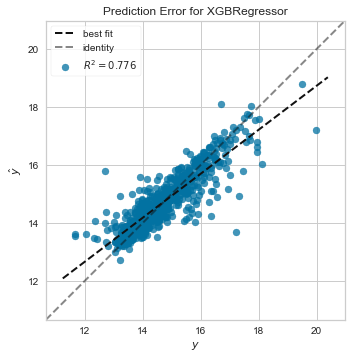

C:\Users\agar.blohorn\anaconda3\lib\site-packages\sklearn\base.py:209: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  warnings.warn('From version 0.24, get_params will raise an '


PredictionError(ax=<AxesSubplot:title={'center':'Prediction Error for XGBRegressor'}, xlabel='$y$', ylabel='$\\hat{y}$'>,
                model=None)

Residuals Plot


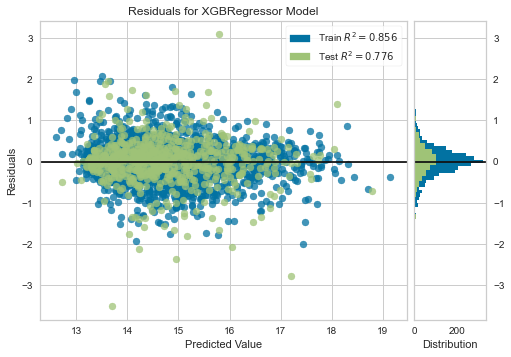

ResidualsPlot(ax=<AxesSubplot:title={'center':'Residuals for XGBRegressor Model'}, xlabel='Predicted Value', ylabel='Residuals'>,
              line_color=None, model=None, test_alpha=None, test_color=None,
              train_alpha=None, train_color=None)


C:\Users\agar.blohorn\anaconda3\lib\site-packages\sklearn\base.py:209: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  warnings.warn('From version 0.24, get_params will raise an '


In [107]:
from yellowbrick.regressor import residuals_plot
from yellowbrick.regressor import prediction_error

# Instantiate an XGBoost object with hyperparameters
xgb_reg = random_Search_CV1.best_estimator_

# Train the model with train data sets
xgb_reg.fit(X_train1, y_train1)

y_pred = xgb_reg.predict(X_test1) # Predictions
y_true = y_test1 # True values

MSE = mean_squared_error(y_true, y_pred)
RMSE = np.sqrt(MSE)

R_squared = r2_score(y_true, y_pred)

print("\nRMSE: ", np.round(RMSE, 2))
print()
print("R-Squared: ", np.round(R_squared, 2))

# Making the Prediction Error Plot
print("\nPrediction Error Plot")
print(prediction_error(xgb_reg, X_train1, y_train1, X_test1, y_test1))

# Making the Residuals Plot
print("\nResiduals Plot")
print(residuals_plot(xgb_reg, X_train1, y_train1, X_test1, y_test1))

In [99]:
random_Search_CV1.best_estimator_

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.5, gamma=3, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.03, max_delta_step=0, max_depth=90,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=1000, n_jobs=8, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=0.7,
             tree_method='exact', validate_parameters=1, verbosity=None)

In [110]:
wandb.init(project = 'Graphique des residus')
wandb.sklearn.plot_residuals(random_Search_CV1.best_estimator_, X_train1, y_train1)

wandb: WARNING Ignored wandb.init() arg project when running a sweep


wandb: WARNING wandb uses only the first 10000 datapoints to create the plots.
wandb: WARNING wandb uses only the first 10000 datapoints to create the plots.


In [133]:
wandb.config.update({'subsample': 0.7, 'n_estimators': 500, 'max_depth': 5, 'learning_rate': 0.05, 'gamma': 3, 'colsample_bytree': 0.7})

In [134]:
 wandb.log({'NMAE':'neg_mean_absolute_error','NRMSE':'neg_root_mean_squared_error','R2':'r2'})

In [226]:
sweep_config = {
    'method': 'random'
    }


In [228]:
parameters_dict = {
  
    "gamma": {'values':[1,2,3,4,5,6,7,8,9,10]},
    "learning_rate": {'values':[0.001,0.008,0.01,0.03,0.05,0.1,0.3,0.5]}, 
    "max_depth": {'values':[5,10,15,20,50,60,80,90,100]} ,
    "n_estimators":{'values':[500,1000,1200]},
    "colsample_bytree": {'values':[0.1,0.5,0.7]},
    "subsample": {'values':[0.1,0.5,0.7]}
    }

sweep_config['parameters'] = parameters_dict

In [84]:
dic = {'y_test1':y_test1, 'y_pred1':y_pred1}
h = pd.DataFrame(dic)
h['comp'] = abs(y_pred1-y_test1)
h.sort_values(by="comp", ascending=False)

,y_test1,y_pred1,comp
229,17.217990,13.766470,3.451520
32,12.695337,15.736490,3.041153
33,19.971671,17.292379,2.679292
785,17.314818,14.912108,2.402710
295,18.133983,15.940625,2.193358
2178,16.370387,14.258926,2.111461
1462,11.665532,13.665332,1.999800
676,15.796731,13.997211,1.799521
1728,11.666869,13.417438,1.750569
3183,13.207021,14.954076,1.747054


In [85]:
data2.loc[[229,32,33,785,2178]]

,BuildingType,PrimaryPropertyType,PropertyName,Address,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),TotalGHGEmissions,GHGEmissionsIntensity
229,NonResidential,Large Office,Fourth & Madison,925 Fourth Avenue,downtown,47.60549,-122.33319,2002,1.0,37,1052469,164420,888049,"Convenience Store without Gas Station, Data Ce...",Office,765351.0,93.0,46.299999,47.200001,145.300003,148.300003,4.121358e+07,4.207171e+07,0.0,1.0,1.0,0.0,0.0,287.32,0.27
32,NonResidential,Small- and Mid-Sized Office,Good Shepherd Center,4649 Sunnyside Ave. N.,lake union,47.66410,-122.33118,1906,1.0,3,87262,0,87262,"K-12 School, Multifamily Housing, Office, Othe...",Office,40943.0,75.0,61.500000,69.800003,106.500000,115.900002,4.145920e+06,4.703690e+06,0.0,1.0,1.0,1.0,1.0,157.77,1.81
33,NonResidential,Hotel,Silver Cloud University,5036 25th Ave NE,northeast,47.66583,-122.29965,1994,1.0,4,81871,0,81871,Hotel,Hotel,81871.0,29.0,81.500000,82.199997,162.500000,164.899994,6.668568e+06,6.731282e+06,0.0,1.0,1.0,1.0,1.0,215.00,2.63
785,Multifamily LR (1-4),Low-Rise Multifamily,(ID19865) Dorothy Day House,106 Bell St,downtown,47.61358,-122.34656,1900,1.0,3,23015,0,23015,"Multifamily Housing, Retail Store",Multifamily Housing,19132.0,75.0,63.400002,64.699997,139.699997,143.899994,1.458617e+06,1.489198e+06,0.0,1.0,1.0,1.0,1.0,40.28,1.75
2178,Multifamily LR (1-4),Senior Care Community,Fred Lind Manor,1802 17th ave,central,47.61806,-122.30984,1988,1.0,4,63998,0,63998,"Parking, Senior Care Community",Senior Care Community,60000.0,56.0,64.900002,67.699997,125.000000,127.599998,3.896148e+06,4.060441e+06,0.0,1.0,1.0,1.0,1.0,131.69,2.06


In [86]:

xgb_r = xg.XGBRegressor(objective ='reg:linear', n_estimators = 10, seed = 123)
random_Search_CV2 = RandomizedSearchCV(estimator = xgb_r, param_distributions = params,n_jobs=-1,scoring = scoring,refit='NMAE',n_iter = 100,cv=4, return_train_score = True )

random_Search_CV2 = random_Search_CV2.fit(X_train2,y_train2)
y_pred2 = random_Search_CV2.predict(X_test2)

print("\n")
print("les meilleurs paramètres sont: ", random_Search_CV2.best_params_)
print('Mean squared error (MSE): %.2f\n'% mean_squared_error(y_test2, y_pred2))
print("le score moyen des tests du meilleur estimateur:  ", random_Search_CV2.best_score_)
x2= pd.DataFrame(random_Search_CV2.cv_results_) 
x2

[10:01:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.


les meilleurs paramètres sont:  {'subsample': 0.1, 'n_estimators': 1000, 'max_depth': 80, 'learning_rate': 0.008, 'gamma': 1, 'colsample_bytree': 0.7}
Mean squared error (MSE): 0.34

le score moyen des tests du meilleur estimateur:   -0.39865511589374086


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_subsample,param_n_estimators,param_max_depth,param_learning_rate,param_gamma,param_colsample_bytree,params,split0_test_NMAE,split1_test_NMAE,split2_test_NMAE,split3_test_NMAE,mean_test_NMAE,std_test_NMAE,rank_test_NMAE,split0_train_NMAE,split1_train_NMAE,split2_train_NMAE,split3_train_NMAE,mean_train_NMAE,std_train_NMAE,split0_test_NRMSE,split1_test_NRMSE,split2_test_NRMSE,split3_test_NRMSE,mean_test_NRMSE,std_test_NRMSE,rank_test_NRMSE,split0_train_NRMSE,split1_train_NRMSE,split2_train_NRMSE,split3_train_NRMSE,mean_train_NRMSE,std_train_NRMSE,split0_test_R2,split1_test_R2,split2_test_R2,split3_test_R2,mean_test_R2,std_test_R2,rank_test_R2,split0_train_R2,split1_train_R2,split2_train_R2,split3_train_R2,mean_train_R2,std_train_R2
0,8.035503,0.133795,0.014787,0.004139,0.5,1200,50,0.008,10,0.1,"{'subsample': 0.5, 'n_estimators': 1200, 'max_...",-0.501707,-0.475719,-0.488013,-0.434689,-0.475032,0.025040,75,-0.448665,-0.468365,-0.466912,-0.483297,-0.466810,0.012283,-0.701001,-0.650285,-0.659358,-0.598429,-0.652268,0.036496,73,-0.615919,-0.643332,-0.642361,-0.660151,-0.640441,0.015826,6.298120e-01,6.406545e-01,6.421931e-01,6.912713e-01,6.509827e-01,2.374500e-02,73,6.796151e-01,6.646870e-01,6.622162e-01,6.484938e-01,6.637531e-01,1.104179e-02
1,75.686438,0.773926,0.080526,0.018089,0.7,1200,20,0.1,9,0.7,"{'subsample': 0.7, 'n_estimators': 1200, 'max_...",-0.433981,-0.428805,-0.426122,-0.370651,-0.414890,0.025697,23,-0.385436,-0.395775,-0.391180,-0.407530,-0.394980,0.008119,-0.621210,-0.600107,-0.589919,-0.522751,-0.583497,0.036843,23,-0.538444,-0.554247,-0.549270,-0.568168,-0.552532,0.010683,7.092889e-01,6.939715e-01,7.135884e-01,7.644191e-01,7.203170e-01,2.648574e-02,23,7.551461e-01,7.511217e-01,7.530252e-01,7.396250e-01,7.497295e-01,6.005014e-03
2,2.964070,0.068676,0.009893,0.001566,0.5,1000,50,0.001,10,0.5,"{'subsample': 0.5, 'n_estimators': 1000, 'max_...",-5.198221,-5.218184,-5.228061,-5.187930,-5.208099,0.015847,92,-5.208232,-5.207569,-5.207673,-5.210040,-5.208379,0.000992,-5.276590,-5.285550,-5.298069,-5.252319,-5.278132,0.016742,93,-5.275198,-5.276743,-5.276972,-5.282032,-5.277736,0.002572,-1.997449e+01,-2.274021e+01,-2.210158e+01,-2.278227e+01,-2.189964e+01,1.143740e+00,93,-2.250189e+01,-2.155858e+01,-2.179556e+01,-2.150339e+01,-2.183985e+01,3.976733e-01
3,14.956734,0.763918,0.012310,0.004037,0.5,1000,10,0.5,6,0.7,"{'subsample': 0.5, 'n_estimators': 1000, 'max_...",-0.445383,-0.445587,-0.456478,-0.379063,-0.431628,0.030678,52,-0.378051,-0.379156,-0.365645,-0.382306,-0.376290,0.006341,-0.628638,-0.620020,-0.629019,-0.532904,-0.602645,0.040426,50,-0.516134,-0.525226,-0.500420,-0.527177,-0.517239,0.010567,7.022955e-01,6.733249e-01,6.743625e-01,7.551792e-01,7.012905e-01,3.321218e-02,52,7.750170e-01,7.765029e-01,7.950018e-01,7.758400e-01,7.805904e-01,8.337064e-03
4,3.511615,0.564779,0.009673,0.002818,0.1,1000,100,0.001,3,0.5,"{'subsample': 0.1, 'n_estimators': 1000, 'max_...",-5.227724,-5.244732,-5.240398,-5.211513,-5.231092,0.012916,94,-5.231272,-5.230070,-5.229850,-5.233175,-5.231091,0.001319,-5.328694,-5.333528,-5.332699,-5.298827,-5.323437,0.014326,95,-5.320453,-5.322649,-5.322332,-5.327670,-5.323276,0.002672,-2.039076e+01,-2.317315e+01,-2.240457e+01,-2.320531e+01,-2.229345e+01,1.144325e+00,95,-2.290685e+01,-2.195279e+01,-2.218914e+01,-2.189394e+01,-2.223568e+01,4.029445e-01
5,77.017287,6.465959,0.056814,0.043788,0.7,1200,80,0.008,4,0.7,"{'subsample': 0.7, 'n_estimators': 1200, 'max_...",-0.422517,-0.413908,-0.414067,-0.359276,-0.402442,0.025164,2,-0.356290,-0.363195,-0.360626,-0.373746,-0.363464,0.006429,-0.607986,-0.588256,-0.576910,-0.512608,-0.571440,0.035740,2,-0.496804,-0.506503,-0.506715,-0.518152,-0.507044,0.007560,7.215345e-01,7.059394e-01,7.260809e-01,7.734718e-01,7.317566e-01,2.521601e-02,2,7.915529e-01,7.921530e-01,7.898117e-01,7.834492e-01,7.892417e-01,3.453091e-03
6,24.487096,2.344318,0.011521,0.003264,0.5,500,90,0.05,2,0.7,"{'subsample': 0.5, 'n_est

In [87]:

xgb_r = xg.XGBRegressor(objective ='reg:linear', seed = 123)
random_Search_CV3 = RandomizedSearchCV(estimator = xgb_r, param_distributions = params ,n_jobs=-1,scoring = scoring,refit='NMAE',n_iter = 100,cv=3, return_train_score = True )

random_Search_CV3 = random_Search_CV3.fit(X_train3,y_train3)
y_pred3 = random_Search_CV3.predict(X_test3)
print("\n")
print("les meilleurs paramètres sont: ", random_Search_CV3.best_params_)
print('Mean squared error (MSE): %.2f\n'% mean_squared_error(y_test3, y_pred3))
print("le meilleurs score est: ", random_Search_CV3.best_score_)
x3= pd.DataFrame(random_Search_CV3.cv_results_) 
x3

[10:13:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.


les meilleurs paramètres sont:  {'subsample': 0.7, 'n_estimators': 1000, 'max_depth': 10, 'learning_rate': 0.008, 'gamma': 6, 'colsample_bytree': 0.7}
Mean squared error (MSE): 0.80

le meilleurs score est:  -0.6896082201130312


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_subsample,param_n_estimators,param_max_depth,param_learning_rate,param_gamma,param_colsample_bytree,params,split0_test_NMAE,split1_test_NMAE,split2_test_NMAE,mean_test_NMAE,std_test_NMAE,rank_test_NMAE,split0_train_NMAE,split1_train_NMAE,split2_train_NMAE,mean_train_NMAE,std_train_NMAE,split0_test_NRMSE,split1_test_NRMSE,split2_test_NRMSE,mean_test_NRMSE,std_test_NRMSE,rank_test_NRMSE,split0_train_NRMSE,split1_train_NRMSE,split2_train_NRMSE,mean_train_NRMSE,std_train_NRMSE,split0_test_R2,split1_test_R2,split2_test_R2,mean_test_R2,std_test_R2,rank_test_R2,split0_train_R2,split1_train_R2,split2_train_R2,mean_train_R2,std_train_R2
0,34.372525,0.741021,0.033136,0.012714,0.7,1200,50,0.001,9,0.7,"{'subsample': 0.7, 'n_estimators': 1200, 'max_...",-1.095075,-1.098377,-1.051051,-1.081501,0.021574,84,-1.055008,-1.069032,-1.071897,-1.065312,0.007380,-1.403550,-1.402900,-1.360081,-1.388844,0.020340,84,-1.356234,-1.365406,-1.367636,-1.363092,0.004934,0.149369,0.084814,0.143070,0.125751,0.029061,84,0.146345,0.166716,0.162457,0.158506,0.008773
1,5.317237,0.030071,0.008768,0.000221,0.7,500,80,0.03,5,0.1,"{'subsample': 0.7, 'n_estimators': 500, 'max_d...",-0.776746,-0.748832,-0.747671,-0.757749,0.013441,56,-0.637986,-0.642907,-0.639453,-0.640116,0.002063,-1.003060,-0.967304,-0.956750,-0.975705,0.019817,55,-0.813894,-0.818263,-0.817657,-0.816604,0.001932,0.565551,0.564907,0.575954,0.568804,0.005063,55,0.692568,0.700736,0.700630,0.697978,0.003826
2,2.962037,0.038468,0.008491,0.001086,0.1,500,80,0.03,2,0.1,"{'subsample': 0.1, 'n_estimators': 500, 'max_d...",-0.776838,-0.763116,-0.758491,-0.766148,0.007791,60,-0.684367,-0.689077,-0.684871,-0.686105,0.002112,-1.011508,-0.981313,-0.969869,-0.987563,0.017564,60,-0.876329,-0.884796,-0.881432,-0.880852,0.003481,0.558202,0.552214,0.564245,0.558220,0.004912,60,0.643592,0.650091,0.652109,0.648597,0.003634
3,9.380091,0.774723,0.012875,0.003113,0.7,1000,20,0.3,5,0.1,"{'subsample': 0.7, 'n_estimators': 1000, 'max_...",-0.758362,-0.775937,-0.740963,-0.758421,0.014278,57,-0.550612,-0.534454,-0.550234,-0.545100,0.007529,-0.991373,-1.012435,-0.959638,-0.987816,0.021701,61,-0.702406,-0.686003,-0.710204,-0.699537,0.010086,0.575615,0.523360,0.573390,0.557455,0.024126,61,0.771024,0.789660,0.774144,0.778276,0.008150
4,1.956475,0.012888,0.009322,0.000474,0.7,500,5,0.001,3,0.1,"{'subsample': 0.7, 'n_estimators': 500, 'max_d...",-1.897126,-1.903721,-1.863090,-1.887979,0.017804,95,-1.881129,-1.882934,-1.894200,-1.886088,0.005784,-2.325504,-2.308897,-2.282567,-2.305656,0.017678,95,-2.292984,-2.304844,-2.308414,-2.302081,0.006595,-1.335175,-1.478934,-1.413588,-1.409232,0.058770,95,-1.440141,-1.374393,-1.386124,-1.400219,0.028632
5,8.116102,0.253170,0.026062,0.011503,0.5,1200,5,0.01,3,0.7,"{'subsample': 0.5, 'n_estimators': 1200, 'max_...",-0.699664,-0.691478,-0.679595,-0.690246,0.008240,3,-0.568725,-0.570022,-0.575179,-0.571309,0.002788,-0.919444,-0.905642,-0.898961,-0.908016,0.008529,5,-0.736277,-0.743023,-0.747232,-0.742177,0.004512,0.634964,0.618610,0.625632,0.626402,0.006699,5,0.748409,0.753240,0.749979,0.750543,0.002012
6,3.139282,0.037755,0.007530,0.000019,0.5,500,10,0.1,7,0.1,"{'subsample': 0.5, 'n_estimators': 500, 'max_d...",-0.732698,-0.712075,-0.721340,-0.722038,0.008434,45,-0.656744,-0.655319,-0.660733,-0.657599,0.002291,-0.955535,-0.924433,-0.935384,-0.938451,0.012881,42,-0.849960,-0.846887,-0.845234,-0.847360,0.001958,0.605744,0.602619,0.594682,0.601015,0.004656,42,0.664718,0.679432,0.680096,0.674749,0.007098
7,21.650678,0.205964,0.023645,0.008613,0.7,1000,15,0.001,6,0.5,"{'subsample': 0.7, 'n_estimators': 1000, 'max_...",-1.263935,-1.281470,-1.227722,-1.257709,0.022380,89,-1.229510,-1.234753,-1.244287,-1.236184,0.006117,-1.603490,-1.604783,-1.563088,-1.590454,0.019358,89,-1.552951,-1.560254,-1.565943,-1.559716,0.005317,-0.110242,-0.197537,-0.131835,-0.146538,0.037123,89,-0.119254,-0.088078,-0.098039,-0.101790,0.013001
8,59.250776,0.939172,0.02

In [88]:

xgb_r = xg.XGBRegressor(objective ='reg:linear', seed = 123)
random_Search_CV4 = RandomizedSearchCV(estimator = xgb_r, param_distributions = params,scoring = scoring,refit='NMAE', n_jobs=-1,n_iter = 20,cv=3, return_train_score = True )
random_Search_CV4 = random_Search_CV4.fit(X_train4,y_train4)
y_pred4 = random_Search_CV4.predict(X_test4)
print("\n")
print("les meilleurs paramètres sont: ", random_Search_CV4.best_params_)
print('Mean squared error (MSE): %.2f\n'% mean_squared_error(y_test4, y_pred4))
print("le score moyen test est: ", random_Search_CV4.best_score_)
x4= pd.DataFrame(random_Search_CV4.cv_results_) 
x4

[10:15:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.


les meilleurs paramètres sont:  {'subsample': 0.5, 'n_estimators': 1000, 'max_depth': 15, 'learning_rate': 0.1, 'gamma': 8, 'colsample_bytree': 0.7}
Mean squared error (MSE): 1.02

le score moyen test est:  -0.6821328868860684


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_subsample,param_n_estimators,param_max_depth,param_learning_rate,param_gamma,param_colsample_bytree,params,split0_test_NMAE,split1_test_NMAE,split2_test_NMAE,mean_test_NMAE,std_test_NMAE,rank_test_NMAE,split0_train_NMAE,split1_train_NMAE,split2_train_NMAE,mean_train_NMAE,std_train_NMAE,split0_test_NRMSE,split1_test_NRMSE,split2_test_NRMSE,mean_test_NRMSE,std_test_NRMSE,rank_test_NRMSE,split0_train_NRMSE,split1_train_NRMSE,split2_train_NRMSE,mean_train_NRMSE,std_train_NRMSE,split0_test_R2,split1_test_R2,split2_test_R2,mean_test_R2,std_test_R2,rank_test_R2,split0_train_R2,split1_train_R2,split2_train_R2,mean_train_R2,std_train_R2
0,9.522731,0.094960,0.039183,0.003847,0.1,500,100,0.3,7,0.7,"{'subsample': 0.1, 'n_estimators': 500, 'max_d...",-0.777721,-0.773824,-0.789209,-0.780251,0.006531,19,-0.699221,-0.670531,-0.682593,-0.684115,0.011762,-1.002008,-1.001167,-1.027782,-1.010319,0.012353,19,-0.882019,-0.857836,-0.856919,-0.865591,0.011622,0.495171,0.538573,0.511292,0.515012,0.017913,19,0.640991,0.645405,0.647052,0.644482,0.002559
1,5.091970,0.520899,0.028007,0.011182,0.7,500,60,0.1,2,0.1,"{'subsample': 0.7, 'n_estimators': 500, 'max_d...",-0.713488,-0.771744,-0.730489,-0.738574,0.024460,13,-0.483765,-0.447792,-0.458166,-0.463241,0.015118,-0.922188,-0.984870,-0.959235,-0.955431,0.025731,12,-0.609905,-0.565261,-0.578164,-0.584444,0.018759,0.572396,0.553474,0.574306,0.566725,0.009403,12,0.828338,0.846035,0.839330,0.837901,0.007295
2,7.064943,0.521942,0.012597,0.003257,0.5,500,10,0.1,1,0.5,"{'subsample': 0.5, 'n_estimators': 500, 'max_d...",-0.707913,-0.768527,-0.740078,-0.738839,0.024761,14,-0.315523,-0.310223,-0.316199,-0.313981,0.002672,-0.914742,-0.993561,-0.979038,-0.962447,0.034250,13,-0.397025,-0.388830,-0.394359,-0.393404,0.003413,0.579273,0.545558,0.556548,0.560460,0.014039,13,0.927258,0.927148,0.925249,0.926552,0.000922
3,6.484162,0.184113,0.013782,0.001731,0.5,1200,90,0.001,3,0.1,"{'subsample': 0.5, 'n_estimators': 1200, 'max_...",-1.232177,-1.309653,-1.295356,-1.279062,0.033662,20,-1.270250,-1.255614,-1.263212,-1.263025,0.005977,-1.544053,-1.621018,-1.612863,-1.592645,0.034520,20,-1.585774,-1.566980,-1.571711,-1.574822,0.007982,-0.198746,-0.209665,-0.203489,-0.203967,0.004471,20,-0.160465,-0.183180,-0.187345,-0.176997,0.011813
4,14.347095,0.170192,0.038005,0.030408,0.5,500,50,0.008,4,0.5,"{'subsample': 0.5, 'n_estimators': 500, 'max_d...",-0.656334,-0.730191,-0.695561,-0.694028,0.030171,3,-0.614289,-0.589151,-0.602200,-0.601880,0.010265,-0.860433,-0.933910,-0.918259,-0.904201,0.031601,3,-0.786022,-0.763856,-0.767241,-0.772373,0.009750,0.627748,0.598487,0.609898,0.612044,0.012042,3,0.714886,0.718845,0.717060,0.716930,0.001619
5,5.016254,0.342107,0.007710,0.000502,0.1,1000,80,0.3,8,0.1,"{'subsample': 0.1, 'n_estimators': 1000, 'max_...",-0.752769,-0.787215,-0.751838,-0.763941,0.016461,18,-0.727732,-0.694688,-0.708421,-0.710280,0.013554,-0.974390,-1.014385,-0.989343,-0.992706,0.016500,17,-0.928083,-0.898068,-0.899353,-0.908501,0.013856,0.522615,0.526309,0.547164,0.532029,0.010807,17,0.602513,0.611365,0.611231,0.608369,0.004142
6,16.555986,0.345576,0.009178,0.000776,0.1,1200,15,0.03,10,0.5,"{'subsample': 0.1, 'n_estimators': 1200, 'max_...",-0.672381,-0.742149,-0.710017,-0.708182,0.028512,8,-0.706825,-0.678215,-0.694347,-0.693129,0.011711,-0.875203,-0.944877,-0.926162,-0.915414,0.029442,5,-0.902933,-0.880371,-0.886761,-0.890022,0.009495,0.614859,0.589001,0.603155,0.602338,0.010572,5,0.623764,0.626530,0.622041,0.624112,0.001849
7,36.818486,2.797460,0.059050,0.062690,0.7,1200,15,0.3,1,0.7,"{'subsample': 0.7, 'n_estimators': 1200, 'max_...",-0.746548,-0.778780,-0.758809,-0.761379,0.013284,17,-0.243608,-0.243247,-0.245117,-0.243991,0.000810,-0.975016,-1.010828,-1.018187,-1.001344,0.018857,18,-0.305926,-0.306984,-0.307824,-0.306911,0.000776,0.522002,0.529626,0.520374,0.524001,0.004033,18,0.956810,0.954590,0.954455,0.955285,0.001080
8,24.496257,2.462013,0.053105,0.058

### Hyperparamétrage avec Random Search CV et la méthode target encoder

#### Ridge regression

In [120]:
# modele avec EUI SANS ENERGYSTARSCORE
param_grid = {'alpha' : [0.1,0.5,1,2,3,4,5,6,7,8,9,10]}
ridge = Ridge()
ridgeRCV1T = RandomizedSearchCV(estimator = ridge, param_distributions = param_grid,scoring = scoring,refit='NMAE',n_iter = 100, n_jobs=-1,cv=3, return_train_score = True )
ridgeRCV1T = ridgeRCV1T.fit(X_trainT,y_trainT)
print("\n")
print("les meilleurs paramètres sont: ", ridgeRCV1T.best_params_)
print("la moyenne des tests scores du meilleur estimateur est: ", ridgeRCV1T.best_score_)
print("\n")
print("\n")
print("\n")
r1T = pd.DataFrame(ridgeRCV1T.cv_results_)
r1T

C:\Users\agar.blohorn\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 12 is smaller than n_iter=100. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(




les meilleurs paramètres sont:  {'alpha': 0.1}
la moyenne des tests scores du meilleur estimateur est:  -0.540167814744693








,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_NMAE,split1_test_NMAE,split2_test_NMAE,mean_test_NMAE,std_test_NMAE,rank_test_NMAE,split0_train_NMAE,split1_train_NMAE,split2_train_NMAE,mean_train_NMAE,std_train_NMAE,split0_test_NRMSE,split1_test_NRMSE,split2_test_NRMSE,mean_test_NRMSE,std_test_NRMSE,rank_test_NRMSE,split0_train_NRMSE,split1_train_NRMSE,split2_train_NRMSE,mean_train_NRMSE,std_train_NRMSE,split0_test_R2,split1_test_R2,split2_test_R2,mean_test_R2,std_test_R2,rank_test_R2,split0_train_R2,split1_train_R2,split2_train_R2,mean_train_R2,std_train_R2
0,0.041084,0.000000,0.000999,0.000000,0.1,{'alpha': 0.1},-0.550662,-0.559470,-0.510371,-0.540168,0.021374,1,-0.535770,-0.519535,-0.555091,-0.536799,0.014534,-0.737227,-0.791190,-0.675515,-0.734644,0.047259,8,-0.719205,-0.697074,-0.748250,-0.721510,0.020956,0.590106,0.536998,0.565594,0.564233,0.021703,9,0.569424,0.591127,0.581874,0.580808,0.008892
1,0.041084,0.000000,0.000999,0.000000,0.5,{'alpha': 0.5},-0.550692,-0.559461,-0.510367,-0.540173,0.021378,2,-0.535771,-0.519553,-0.555064,-0.536796,0.014516,-0.737235,-0.791205,-0.675468,-0.734636,0.047285,7,-0.719206,-0.697075,-0.748251,-0.721511,0.020956,0.590098,0.536981,0.565656,0.564245,0.021708,8,0.569423,0.591125,0.581873,0.580807,0.008892
2,0.027389,0.019367,0.006241,0.007413,1,{'alpha': 1},-0.550729,-0.559450,-0.510363,-0.540181,0.021383,3,-0.535772,-0.519575,-0.555033,-0.536793,0.014493,-0.737247,-0.791225,-0.675409,-0.734627,0.047318,5,-0.719208,-0.697078,-0.748254,-0.721513,0.020956,0.590085,0.536958,0.565731,0.564258,0.021714,6,0.569419,0.591122,0.581870,0.580804,0.008892
3,0.011150,0.007884,0.012975,0.009384,2,{'alpha': 2},-0.550803,-0.559428,-0.510355,-0.540195,0.021392,4,-0.535785,-0.519619,-0.554972,-0.536792,0.014450,-0.737277,-0.791271,-0.675298,-0.734615,0.047383,3,-0.719220,-0.697090,-0.748263,-0.721524,0.020955,0.590052,0.536904,0.565874,0.564276,0.021727,4,0.569406,0.591109,0.581859,0.580791,0.008892
4,0.011912,0.005562,0.005671,0.000429,3,{'alpha': 3},-0.550880,-0.559407,-0.510348,-0.540211,0.021402,5,-0.535806,-0.519666,-0.554921,-0.536798,0.014410,-0.737315,-0.791325,-0.675193,-0.734611,0.047449,1,-0.719238,-0.697107,-0.748279,-0.721541,0.020954,0.590009,0.536841,0.566010,0.564286,0.021740,2,0.569384,0.591088,0.581842,0.580771,0.008893
5,0.004258,0.001605,0.001698,0.001744,4,{'alpha': 4},-0.550958,-0.559386,-0.510339,-0.540228,0.021413,6,-0.535828,-0.519721,-0.554888,-0.536812,0.014374,-0.737361,-0.791385,-0.675093,-0.734613,0.047516,2,-0.719262,-0.697131,-0.748300,-0.721564,0.020953,0.589958,0.536770,0.566137,0.564288,0.021753,1,0.569356,0.591060,0.581818,0.580744,0.008893
6,0.007720,0.005474,0.005355,0.004069,5,{'alpha': 5},-0.551038,-0.559369,-0.510328,-0.540245,0.021426,7,-0.535849,-0.519779,-0.554859,-0.536829,0.014338,-0.737414,-0.791451,-0.675000,-0.734622,0.047582,4,-0.719291,-0.697161,-0.748326,-0.721593,0.020952,0.589899,0.536693,0.566257,0.564283,0.021766,3,0.569320,0.591025,0.581789,0.580711,0.008894
7,0.007364,0.005343,0.000674,0.000954,6,{'alpha': 6},-0.551119,-0.559354,-0.510317,-0.540263,0.021440,8,-0.535870,-0.519847,-0.554832,-0.536850,0.014299,-0.737473,-0.791523,-0.674911,-0.734636,0.047649,6,-0.719326,-0.697195,-0.748357,-0.721626,0.020950,0.589834,0.536609,0.566371,0.564271,0.021780,5,0.569279,0.590985,0.581754,0.580673,0.008894
8,0.005779,0.004098,0.000997,0.001411,7,{'alpha': 7},-0.551199,-0.559343,-0.510304,-0.540282,0.021457,9,-0.535891,-0.519922,-0.554806,-0.536873,0.014258,-0.737538,-0.791600,-0.674828,-0.734655,0.047715,9,-0.719365,-0.697234,-0.748392,-0.721664,0.020948,0.589761,0.536519,0.566478,0.564253,0.021793,7,0.569232,0.590939,0.581715,0.580629,0.008895
9,0.004426,0.004320,0.000332,0.000470,8,{'alpha': 8},-0.551279,-0.559336,-0.510291,-0.540302,0.021474,10,-0.535915,-0.519997,-0.554781,-0.536898,0.014218,-0.737608,-0.791681,-0.674749,-0.734679,0.047782,10,-0.719408,-0.697277,-0.748432,-0.721706,0.020947,0.589683,0.536424,0.56657

In [121]:
# modele avec EUI Avec ENERGYSTARSCORE
param_grid = {'alpha' : [0.1,0.5,1,2,3,4,5,6,7,8,9,10]}
ridge = Ridge()
ridgeRCV2T =RandomizedSearchCV(estimator = ridge, param_distributions = param_grid,n_iter = 100,scoring = scoring,refit='NMAE', n_jobs=-1,cv=3, return_train_score = True )
ridgeRCV2T = ridgeRCV2T.fit(X_trainTESS,y_trainTESS)
print("\n")
print("les meilleurs paramètres sont: ", ridgeRCV2T.best_params_)
print("la moyenne des tests scores du meilleur estimateur est: ", ridgeRCV2T.best_score_)
r2T = pd.DataFrame(ridgeRCV2T.cv_results_) 
r2T



les meilleurs paramètres sont:  {'alpha': 7}
la moyenne des tests scores du meilleur estimateur est:  -0.5194510579453369


C:\Users\agar.blohorn\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 12 is smaller than n_iter=100. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_NMAE,split1_test_NMAE,split2_test_NMAE,mean_test_NMAE,std_test_NMAE,rank_test_NMAE,split0_train_NMAE,split1_train_NMAE,split2_train_NMAE,mean_train_NMAE,std_train_NMAE,split0_test_NRMSE,split1_test_NRMSE,split2_test_NRMSE,mean_test_NRMSE,std_test_NRMSE,rank_test_NRMSE,split0_train_NRMSE,split1_train_NRMSE,split2_train_NRMSE,mean_train_NRMSE,std_train_NRMSE,split0_test_R2,split1_test_R2,split2_test_R2,mean_test_R2,std_test_R2,rank_test_R2,split0_train_R2,split1_train_R2,split2_train_R2,mean_train_R2,std_train_R2
0,0.003345,0.000348,0.003084,0.000532,0.1,{'alpha': 0.1},-0.535384,-0.533863,-0.489346,-0.519531,0.021353,12,-0.512702,-0.499308,-0.535967,-0.515992,0.015146,-0.717766,-0.763887,-0.654930,-0.712194,0.044655,10,-0.692499,-0.675961,-0.722565,-0.697009,0.019291,0.611462,0.568403,0.591666,0.590510,0.017598,11,0.600806,0.615520,0.610087,0.608804,0.006075
1,0.003899,0.000064,0.003158,0.000242,0.5,{'alpha': 0.5},-0.535407,-0.533848,-0.489313,-0.519523,0.021371,11,-0.512696,-0.499317,-0.535959,-0.515990,0.015139,-0.717762,-0.763904,-0.654882,-0.712183,0.044683,9,-0.692500,-0.675962,-0.722566,-0.697010,0.019291,0.611466,0.568383,0.591726,0.590525,0.017609,10,0.600805,0.615519,0.610086,0.608803,0.006075
2,0.005445,0.001023,0.005013,0.001420,1,{'alpha': 1},-0.535436,-0.533830,-0.489272,-0.519513,0.021393,10,-0.512687,-0.499331,-0.535950,-0.515989,0.015131,-0.717760,-0.763928,-0.654824,-0.712171,0.044717,7,-0.692503,-0.675965,-0.722569,-0.697012,0.019291,0.611469,0.568356,0.591799,0.590541,0.017623,8,0.600802,0.615515,0.610083,0.608800,0.006075
3,0.003947,0.000075,0.003775,0.000554,2,{'alpha': 2},-0.535497,-0.533797,-0.489192,-0.519495,0.021439,9,-0.512671,-0.499374,-0.535934,-0.515993,0.015109,-0.717762,-0.763982,-0.654712,-0.712152,0.044786,5,-0.692515,-0.675977,-0.722579,-0.697023,0.019290,0.611466,0.568295,0.591939,0.590567,0.017651,6,0.600788,0.615502,0.610072,0.608788,0.006075
4,0.007175,0.005565,0.006091,0.002959,3,{'alpha': 3},-0.535558,-0.533767,-0.489113,-0.519479,0.021485,8,-0.512656,-0.499421,-0.535922,-0.516000,0.015088,-0.717774,-0.764044,-0.654606,-0.712141,0.044855,3,-0.692533,-0.675995,-0.722594,-0.697041,0.019289,0.611453,0.568225,0.592071,0.590583,0.017679,4,0.600767,0.615481,0.610055,0.608768,0.006076
5,0.003984,0.000806,0.003826,0.000847,4,{'alpha': 4},-0.535624,-0.533741,-0.489037,-0.519467,0.021531,7,-0.512642,-0.499468,-0.535915,-0.516008,0.015069,-0.717794,-0.764113,-0.654506,-0.712137,0.044925,1,-0.692558,-0.676020,-0.722616,-0.697065,0.019288,0.611432,0.568147,0.592196,0.590592,0.017707,2,0.600738,0.615453,0.610032,0.608741,0.006076
6,0.004556,0.000418,0.004135,0.000120,5,{'alpha': 5},-0.535691,-0.533717,-0.488968,-0.519458,0.021575,6,-0.512630,-0.499517,-0.535909,-0.516018,0.015049,-0.717821,-0.764188,-0.654411,-0.712140,0.044996,2,-0.692589,-0.676050,-0.722642,-0.697094,0.019286,0.611402,0.568062,0.592313,0.590593,0.017735,1,0.600703,0.615419,0.610004,0.608708,0.006077
7,0.004583,0.000561,0.004250,0.000807,6,{'alpha': 6},-0.535760,-0.533697,-0.488902,-0.519453,0.021619,3,-0.512619,-0.499566,-0.535903,-0.516029,0.015029,-0.717855,-0.764269,-0.654322,-0.712149,0.045067,4,-0.692625,-0.676085,-0.722673,-0.697128,0.019284,0.611366,0.567971,0.592425,0.590587,0.017764,3,0.600661,0.615379,0.609970,0.608670,0.006078
8,0.007688,0.004739,0.004145,0.000318,7,{'alpha': 7},-0.535831,-0.533680,-0.488843,-0.519451,0.021661,1,-0.512610,-0.499616,-0.535899,-0.516042,0.015010,-0.717895,-0.764356,-0.654237,-0.712163,0.045138,6,-0.692666,-0.676125,-0.722709,-0.697167,0.019282,0.611322,0.567873,0.592530,0.590575,0.017792,5,0.600614,0.615333,0.609932,0.608626,0.006079
9,0.004198,0.000133,0.003390,0.000498,8,{'alpha': 8},-0.535903,-0.533667,-0.488783,-0.519451,0.021705,2,-0.512602,-0.499668,-0.535898,-0.516056,0.014991,-0.717941,-0.764447,-0.654157,-0.712182,0.045209,8,-0.692711,-0.676169,-0.722749,-0.697210,0.019280,0.611272,0.567770,0.5

In [122]:
# modele avec GHG ET ENERGYSTARSCORE
param_grid = {'alpha' : [0.1,0.5,1,2,3,4,5,6,7,8,9,10]}
ridge = Ridge()
ridgeRCV3T = RandomizedSearchCV(estimator = ridge, param_distributions = param_grid,n_iter = 100,scoring = scoring,refit='NMAE', n_jobs=-1,cv=3,return_train_score = True )
ridgeRCV3T = ridgeRCV3T.fit(X_trainTGHG,y_trainTGHG)
print("\n")
print("les meilleurs paramètres sont: ", ridgeRCV3T.best_params_)
print("le meilleurs score est: ", ridgeRCV3T.best_score_)

r3T = pd.DataFrame(ridgeRCV3T.cv_results_)
r3T



les meilleurs paramètres sont:  {'alpha': 0.1}
le meilleurs score est:  -0.540167814744693


C:\Users\agar.blohorn\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 12 is smaller than n_iter=100. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_NMAE,split1_test_NMAE,split2_test_NMAE,mean_test_NMAE,std_test_NMAE,rank_test_NMAE,split0_train_NMAE,split1_train_NMAE,split2_train_NMAE,mean_train_NMAE,std_train_NMAE,split0_test_NRMSE,split1_test_NRMSE,split2_test_NRMSE,mean_test_NRMSE,std_test_NRMSE,rank_test_NRMSE,split0_train_NRMSE,split1_train_NRMSE,split2_train_NRMSE,mean_train_NRMSE,std_train_NRMSE,split0_test_R2,split1_test_R2,split2_test_R2,mean_test_R2,std_test_R2,rank_test_R2,split0_train_R2,split1_train_R2,split2_train_R2,mean_train_R2,std_train_R2
0,0.003939,8.775172e-04,0.003325,4.703027e-04,0.1,{'alpha': 0.1},-0.550662,-0.559470,-0.510371,-0.540168,0.021374,1,-0.535770,-0.519535,-0.555091,-0.536799,0.014534,-0.737227,-0.791190,-0.675515,-0.734644,0.047259,8,-0.719205,-0.697074,-0.748250,-0.721510,0.020956,0.590106,0.536998,0.565594,0.564233,0.021703,9,0.569424,0.591127,0.581874,0.580808,0.008892
1,0.004322,4.704713e-04,0.002660,4.697407e-04,0.5,{'alpha': 0.5},-0.550692,-0.559461,-0.510367,-0.540173,0.021378,2,-0.535771,-0.519553,-0.555064,-0.536796,0.014516,-0.737235,-0.791205,-0.675468,-0.734636,0.047285,7,-0.719206,-0.697075,-0.748251,-0.721511,0.020956,0.590098,0.536981,0.565656,0.564245,0.021708,8,0.569423,0.591125,0.581873,0.580807,0.008892
2,0.003990,4.899036e-07,0.002992,8.142961e-04,1,{'alpha': 1},-0.550729,-0.559450,-0.510363,-0.540181,0.021383,3,-0.535772,-0.519575,-0.555033,-0.536793,0.014493,-0.737247,-0.791225,-0.675409,-0.734627,0.047318,5,-0.719208,-0.697078,-0.748254,-0.721513,0.020956,0.590085,0.536958,0.565731,0.564258,0.021714,6,0.569419,0.591122,0.581870,0.580804,0.008892
3,0.003990,1.946680e-07,0.003324,4.703027e-04,2,{'alpha': 2},-0.550803,-0.559428,-0.510355,-0.540195,0.021392,4,-0.535785,-0.519619,-0.554972,-0.536792,0.014450,-0.737277,-0.791271,-0.675298,-0.734615,0.047383,3,-0.719220,-0.697090,-0.748263,-0.721524,0.020955,0.590052,0.536904,0.565874,0.564276,0.021727,4,0.569406,0.591109,0.581859,0.580791,0.008892
4,0.004654,4.696845e-04,0.003324,4.698531e-04,3,{'alpha': 3},-0.550880,-0.559407,-0.510348,-0.540211,0.021402,5,-0.535806,-0.519666,-0.554921,-0.536798,0.014410,-0.737315,-0.791325,-0.675193,-0.734611,0.047449,1,-0.719238,-0.697107,-0.748279,-0.721541,0.020954,0.590009,0.536841,0.566010,0.564286,0.021740,2,0.569384,0.591088,0.581842,0.580771,0.008893
5,0.004260,5.186240e-04,0.003989,5.150430e-07,4,{'alpha': 4},-0.550958,-0.559386,-0.510339,-0.540228,0.021413,6,-0.535828,-0.519721,-0.554888,-0.536812,0.014374,-0.737361,-0.791385,-0.675093,-0.734613,0.047516,2,-0.719262,-0.697131,-0.748300,-0.721564,0.020953,0.589958,0.536770,0.566137,0.564288,0.021753,1,0.569356,0.591060,0.581818,0.580744,0.008893
6,0.004187,2.796303e-04,0.003657,4.700220e-04,5,{'alpha': 5},-0.551038,-0.559369,-0.510328,-0.540245,0.021426,7,-0.535849,-0.519779,-0.554859,-0.536829,0.014338,-0.737414,-0.791451,-0.675000,-0.734622,0.047582,4,-0.719291,-0.697161,-0.748326,-0.721593,0.020952,0.589899,0.536693,0.566257,0.564283,0.021766,3,0.569320,0.591025,0.581789,0.580711,0.008894
7,0.004186,1.875049e-03,0.004457,4.096762e-04,6,{'alpha': 6},-0.551119,-0.559354,-0.510317,-0.540263,0.021440,8,-0.535870,-0.519847,-0.554832,-0.536850,0.014299,-0.737473,-0.791523,-0.674911,-0.734636,0.047649,6,-0.719326,-0.697195,-0.748357,-0.721626,0.020950,0.589834,0.536609,0.566371,0.564271,0.021780,5,0.569279,0.590985,0.581754,0.580673,0.008894
8,0.004655,9.410549e-04,0.005319,2.050182e-03,7,{'alpha': 7},-0.551199,-0.559343,-0.510304,-0.540282,0.021457,9,-0.535891,-0.519922,-0.554806,-0.536873,0.014258,-0.737538,-0.791600,-0.674828,-0.734655,0.047715,9,-0.719365,-0.697234,-0.748392,-0.721664,0.020948,0.589761,0.536519,0.566478,0.564253,0.021793,7,0.569232,0.590939,0.581715,0.580629,0.008895
9,0.008311,4.704150e-04,0.003657,4.704714e-04,8,{'alpha': 8},-0.551279,-0.559336,-0.510291,-0.540302,0.021474,10,-0.535915,-0.519997,-0.554781,-0.536898,0.014218,-0.737608,-0.791681,-0.674749,-0.734679,0.0477

In [123]:
# modele avec GHG ET ENERGYSTARSCORE
param_grid = {'alpha' : [0.1,0.5,1,2,3,4,5,6,7,8,9,10]}
ridge = Ridge()
ridgeRCV4T = RandomizedSearchCV(estimator = ridge, param_distributions = param_grid,n_iter = 100,scoring = scoring,refit='NMAE', n_jobs=-1,cv=3,return_train_score = True )
ridgeRCV4T = ridgeRCV4T.fit(X_trainTGHGESS,y_trainTGHGESS)
print("\n")
print("les meilleurs paramètres sont: ", ridgeRCV4T.best_params_)
print("le meilleurs score est: ", ridgeRCV4T.best_score_)

r4T = pd.DataFrame(ridgeRCV4T.cv_results_)
r4T



les meilleurs paramètres sont:  {'alpha': 7}
le meilleurs score est:  -0.5194510579453369


C:\Users\agar.blohorn\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 12 is smaller than n_iter=100. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_NMAE,split1_test_NMAE,split2_test_NMAE,mean_test_NMAE,std_test_NMAE,rank_test_NMAE,split0_train_NMAE,split1_train_NMAE,split2_train_NMAE,mean_train_NMAE,std_train_NMAE,split0_test_NRMSE,split1_test_NRMSE,split2_test_NRMSE,mean_test_NRMSE,std_test_NRMSE,rank_test_NRMSE,split0_train_NRMSE,split1_train_NRMSE,split2_train_NRMSE,mean_train_NRMSE,std_train_NRMSE,split0_test_R2,split1_test_R2,split2_test_R2,mean_test_R2,std_test_R2,rank_test_R2,split0_train_R2,split1_train_R2,split2_train_R2,mean_train_R2,std_train_R2
0,0.004246,0.000890,0.002747,5.427276e-04,0.1,{'alpha': 0.1},-0.535384,-0.533863,-0.489346,-0.519531,0.021353,12,-0.512702,-0.499308,-0.535967,-0.515992,0.015146,-0.717766,-0.763887,-0.654930,-0.712194,0.044655,10,-0.692499,-0.675961,-0.722565,-0.697009,0.019291,0.611462,0.568403,0.591666,0.590510,0.017598,11,0.600806,0.615520,0.610087,0.608804,0.006075
1,0.003657,0.000470,0.003656,4.700787e-04,0.5,{'alpha': 0.5},-0.535407,-0.533848,-0.489313,-0.519523,0.021371,11,-0.512696,-0.499317,-0.535959,-0.515990,0.015139,-0.717762,-0.763904,-0.654882,-0.712183,0.044683,9,-0.692500,-0.675962,-0.722566,-0.697010,0.019291,0.611466,0.568383,0.591726,0.590525,0.017609,10,0.600805,0.615519,0.610086,0.608803,0.006075
2,0.003657,0.000470,0.002327,4.702468e-04,1,{'alpha': 1},-0.535436,-0.533830,-0.489272,-0.519513,0.021393,10,-0.512687,-0.499331,-0.535950,-0.515989,0.015131,-0.717760,-0.763928,-0.654824,-0.712171,0.044717,7,-0.692503,-0.675965,-0.722569,-0.697012,0.019291,0.611469,0.568356,0.591799,0.590541,0.017623,8,0.600802,0.615515,0.610083,0.608800,0.006075
3,0.004321,0.000471,0.003991,9.199649e-07,2,{'alpha': 2},-0.535497,-0.533797,-0.489192,-0.519495,0.021439,9,-0.512671,-0.499374,-0.535934,-0.515993,0.015109,-0.717762,-0.763982,-0.654712,-0.712152,0.044786,5,-0.692515,-0.675977,-0.722579,-0.697023,0.019290,0.611466,0.568295,0.591939,0.590567,0.017651,6,0.600788,0.615502,0.610072,0.608788,0.006075
4,0.004770,0.000307,0.003656,2.650918e-04,3,{'alpha': 3},-0.535558,-0.533767,-0.489113,-0.519479,0.021485,8,-0.512656,-0.499421,-0.535922,-0.516000,0.015088,-0.717774,-0.764044,-0.654606,-0.712141,0.044855,3,-0.692533,-0.675995,-0.722594,-0.697041,0.019289,0.611453,0.568225,0.592071,0.590583,0.017679,4,0.600767,0.615481,0.610055,0.608768,0.006076
5,0.004654,0.000471,0.003668,4.541183e-04,4,{'alpha': 4},-0.535624,-0.533741,-0.489037,-0.519467,0.021531,7,-0.512642,-0.499468,-0.535915,-0.516008,0.015069,-0.717794,-0.764113,-0.654506,-0.712137,0.044925,1,-0.692558,-0.676020,-0.722616,-0.697065,0.019288,0.611432,0.568147,0.592196,0.590592,0.017707,2,0.600738,0.615453,0.610032,0.608741,0.006076
6,0.004861,0.000179,0.004322,4.696846e-04,5,{'alpha': 5},-0.535691,-0.533717,-0.488968,-0.519458,0.021575,6,-0.512630,-0.499517,-0.535909,-0.516018,0.015049,-0.717821,-0.764188,-0.654411,-0.712140,0.044996,2,-0.692589,-0.676050,-0.722642,-0.697094,0.019286,0.611402,0.568062,0.592313,0.590593,0.017735,1,0.600703,0.615419,0.610004,0.608708,0.006077
7,0.005652,0.000940,0.004986,7.370010e-07,6,{'alpha': 6},-0.535760,-0.533697,-0.488902,-0.519453,0.021619,3,-0.512619,-0.499566,-0.535903,-0.516029,0.015029,-0.717855,-0.764269,-0.654322,-0.712149,0.045067,4,-0.692625,-0.676085,-0.722673,-0.697128,0.019284,0.611366,0.567971,0.592425,0.590587,0.017764,3,0.600661,0.615379,0.609970,0.608670,0.006078
8,0.004987,0.000814,0.005319,1.243603e-03,7,{'alpha': 7},-0.535831,-0.533680,-0.488843,-0.519451,0.021661,1,-0.512610,-0.499616,-0.535899,-0.516042,0.015010,-0.717895,-0.764356,-0.654237,-0.712163,0.045138,6,-0.692666,-0.676125,-0.722709,-0.697167,0.019282,0.611322,0.567873,0.592530,0.590575,0.017792,5,0.600614,0.615333,0.609932,0.608626,0.006079
9,0.007313,0.001244,0.006066,1.294077e-03,8,{'alpha': 8},-0.535903,-0.533667,-0.488783,-0.519451,0.021705,2,-0.512602,-0.499668,-0.535898,-0.516056,0.014991,-0.717941,-0.764447,-0.654157,-0.712182,0.045209,8,-0.692711,-0.676169,-0.722749,

#### Lasso regression 

In [124]:
param_grid = {'alpha' : [1,0.1,0.01,0.001,0.0001], 'max_iter':[1000,10000,100000]}
lasso = Lasso()
lassoRCV1T = RandomizedSearchCV(estimator = lasso, param_distributions = param_grid, n_jobs=-1,n_iter = 50,scoring = scoring,refit='NMAE',cv=3, return_train_score = True )
lassoRCV1T = lassoRCV1T.fit(X_trainT,y_trainT)
print("\n")
print("les meilleurs paramètres sont: ", lassoRCV1T.best_params_)
print("le meilleurs score est: ", lassoRCV1T.best_score_)
l1T= pd.DataFrame(lassoRCV1T.cv_results_) 
l1T

C:\Users\agar.blohorn\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:278: UserWarning: The total space of parameters 15 is smaller than n_iter=50. Running 15 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(




les meilleurs paramètres sont:  {'max_iter': 1000, 'alpha': 0.0001}
le meilleurs score est:  -0.5401726284958874


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_iter,param_alpha,params,split0_test_NMAE,split1_test_NMAE,split2_test_NMAE,mean_test_NMAE,std_test_NMAE,rank_test_NMAE,split0_train_NMAE,split1_train_NMAE,split2_train_NMAE,mean_train_NMAE,std_train_NMAE,split0_test_NRMSE,split1_test_NRMSE,split2_test_NRMSE,mean_test_NRMSE,std_test_NRMSE,rank_test_NRMSE,split0_train_NRMSE,split1_train_NRMSE,split2_train_NRMSE,mean_train_NRMSE,std_train_NRMSE,split0_test_R2,split1_test_R2,split2_test_R2,mean_test_R2,std_test_R2,rank_test_R2,split0_train_R2,split1_train_R2,split2_train_R2,mean_train_R2,std_train_R2
0,0.005582,0.000995,0.003656,0.000471,1000,1,"{'max_iter': 1000, 'alpha': 1}",-0.676072,-0.663483,-0.603765,-0.647773,0.031540,13,-0.637714,-0.626840,-0.671117,-0.645224,0.018840,-0.865210,-0.916657,-0.777173,-0.853013,0.057593,13,-0.832671,-0.813233,-0.873945,-0.839950,0.025314,0.435439,0.378510,0.425010,0.412986,0.024747,13,0.422846,0.443506,0.429596,0.431983,0.008602
1,0.005330,0.000462,0.003978,0.000016,10000,1,"{'max_iter': 10000, 'alpha': 1}",-0.676072,-0.663483,-0.603765,-0.647773,0.031540,13,-0.637714,-0.626840,-0.671117,-0.645224,0.018840,-0.865210,-0.916657,-0.777173,-0.853013,0.057593,13,-0.832671,-0.813233,-0.873945,-0.839950,0.025314,0.435439,0.378510,0.425010,0.412986,0.024747,13,0.422846,0.443506,0.429596,0.431983,0.008602
2,0.004642,0.000487,0.003990,0.000815,100000,1,"{'max_iter': 100000, 'alpha': 1}",-0.676072,-0.663483,-0.603765,-0.647773,0.031540,13,-0.637714,-0.626840,-0.671117,-0.645224,0.018840,-0.865210,-0.916657,-0.777173,-0.853013,0.057593,13,-0.832671,-0.813233,-0.873945,-0.839950,0.025314,0.435439,0.378510,0.425010,0.412986,0.024747,13,0.422846,0.443506,0.429596,0.431983,0.008602
3,0.009713,0.006685,0.007159,0.004579,1000,0.1,"{'max_iter': 1000, 'alpha': 0.1}",-0.631318,-0.616111,-0.556908,-0.601446,0.032099,10,-0.596580,-0.581889,-0.613959,-0.597476,0.013108,-0.818432,-0.869150,-0.722847,-0.803476,0.060657,10,-0.788827,-0.764517,-0.818071,-0.790471,0.021894,0.494835,0.441260,0.502586,0.479561,0.027267,10,0.482026,0.508181,0.500201,0.496803,0.010945
4,0.004655,0.000472,0.003655,0.000493,10000,0.1,"{'max_iter': 10000, 'alpha': 0.1}",-0.631318,-0.616111,-0.556908,-0.601446,0.032099,10,-0.596580,-0.581889,-0.613959,-0.597476,0.013108,-0.818432,-0.869150,-0.722847,-0.803476,0.060657,10,-0.788827,-0.764517,-0.818071,-0.790471,0.021894,0.494835,0.441260,0.502586,0.479561,0.027267,10,0.482026,0.508181,0.500201,0.496803,0.010945
5,0.005752,0.001618,0.004127,0.000167,100000,0.1,"{'max_iter': 100000, 'alpha': 0.1}",-0.631318,-0.616111,-0.556908,-0.601446,0.032099,10,-0.596580,-0.581889,-0.613959,-0.597476,0.013108,-0.818432,-0.869150,-0.722847,-0.803476,0.060657,10,-0.788827,-0.764517,-0.818071,-0.790471,0.021894,0.494835,0.441260,0.502586,0.479561,0.027267,10,0.482026,0.508181,0.500201,0.496803,0.010945
6,0.006251,0.001916,0.004252,0.000407,1000,0.01,"{'max_iter': 1000, 'alpha': 0.01}",-0.554533,-0.560860,-0.510932,-0.542109,0.022196,7,-0.537957,-0.522713,-0.555137,-0.538603,0.013245,-0.741520,-0.797003,-0.673437,-0.737320,0.050533,7,-0.722183,-0.700321,-0.751000,-0.724501,0.020755,0.585319,0.530170,0.568264,0.561251,0.023054,7,0.565851,0.587309,0.578794,0.577318,0.008822
7,0.004655,0.000471,0.003288,0.000218,10000,0.01,"{'max_iter': 10000, 'alpha': 0.01}",-0.554533,-0.560860,-0.510932,-0.542109,0.022196,7,-0.537957,-0.522713,-0.555137,-0.538603,0.013245,-0.741520,-0.797003,-0.673437,-0.737320,0.050533,7,-0.722183,-0.700321,-0.751000,-0.724501,0.020755,0.585319,0.530170,0.568264,0.561251,0.023054,7,0.565851,0.587309,0.578794,0.577318,0.008822
8,0.004770,0.000657,0.003320,0.000467,100000,0.01,"{'max_iter': 100000, 'alpha': 0.01}",-0.554533,-0.560860,-0.510932,-0.542109,0.022196,7,-0.537957,-0.522713,-0.555137,-0.538603,0.013245,-0.741520,-0.797003,-0.673437,-0.737320,0.050533,7,-0.722183,-0.700321,-0.751000,-0.724501,0.020755,0.585319,0.530170,0.568264,0.561251,0.023054,7,0.565851,0.587309,0.578794,

In [125]:
param_grid = {'alpha' : [1,0.1,0.01,0.001,0.0001], 'max_iter':[1000,10000,100000]}
lasso = Lasso()
lassoRCV2T = RandomizedSearchCV(estimator = lasso, param_distributions = param_grid, n_jobs=-1,scoring = scoring,refit='NMAE',cv=3,return_train_score = True )
lassoRCV2T = lassoRCV2T.fit(X_train2,y_train2)
print("\n")
print("les meilleurs paramètres sont: ", lassoRCV2.best_params_)
print("le meilleurs score est: ", lassoRCV2.best_score_)
l2T= pd.DataFrame(lassoRCV2T.cv_results_) 
l2T



les meilleurs paramètres sont:  {'max_iter': 10000, 'alpha': 0.001}
le meilleurs score est:  -0.5379275624742007


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_iter,param_alpha,params,split0_test_NMAE,split1_test_NMAE,split2_test_NMAE,mean_test_NMAE,std_test_NMAE,rank_test_NMAE,split0_train_NMAE,split1_train_NMAE,split2_train_NMAE,mean_train_NMAE,std_train_NMAE,split0_test_NRMSE,split1_test_NRMSE,split2_test_NRMSE,mean_test_NRMSE,std_test_NRMSE,rank_test_NRMSE,split0_train_NRMSE,split1_train_NRMSE,split2_train_NRMSE,mean_train_NRMSE,std_train_NRMSE,split0_test_R2,split1_test_R2,split2_test_R2,mean_test_R2,std_test_R2,rank_test_R2,split0_train_R2,split1_train_R2,split2_train_R2,mean_train_R2,std_train_R2
0,0.036745,0.008380,0.004219,0.000574,100000,0.0001,"{'max_iter': 100000, 'alpha': 0.0001}",-0.564370,-0.537503,-0.512368,-0.538080,0.021234,3,-0.512959,-0.539961,-0.542732,-0.531884,0.013430,-0.772008,-0.691887,-0.699591,-0.721162,0.036091,3,-0.683461,-0.725523,-0.720594,-0.709859,0.018774,0.546288,0.570969,0.601762,0.573006,0.022693,3,0.601725,0.585950,0.572743,0.586806,0.011847
1,0.019980,0.005119,0.002352,0.000461,1000,0.001,"{'max_iter': 1000, 'alpha': 0.001}",-0.564349,-0.536863,-0.512570,-0.537928,0.021152,1,-0.513013,-0.540542,-0.543386,-0.532313,0.013697,-0.770448,-0.691441,-0.699987,-0.720625,0.035402,1,-0.683879,-0.726094,-0.721180,-0.710384,0.018849,0.548120,0.571521,0.601311,0.573651,0.021767,1,0.601238,0.585298,0.572048,0.586194,0.011934
2,0.012406,0.003644,0.004058,0.000365,100000,0.001,"{'max_iter': 100000, 'alpha': 0.001}",-0.564349,-0.536863,-0.512570,-0.537928,0.021152,1,-0.513013,-0.540542,-0.543386,-0.532313,0.013697,-0.770448,-0.691441,-0.699987,-0.720625,0.035402,1,-0.683879,-0.726094,-0.721180,-0.710384,0.018849,0.548120,0.571521,0.601311,0.573651,0.021767,1,0.601238,0.585298,0.572048,0.586194,0.011934
3,0.006981,0.000814,0.004654,0.000470,1000,0.1,"{'max_iter': 1000, 'alpha': 0.1}",-0.642306,-0.609991,-0.617844,-0.623381,0.013761,8,-0.603059,-0.635559,-0.625201,-0.621273,0.013555,-0.851371,-0.777035,-0.798730,-0.809045,0.031212,8,-0.778222,-0.822815,-0.811335,-0.804124,0.018906,0.448210,0.458872,0.480896,0.462659,0.013610,8,0.483627,0.467456,0.458362,0.469815,0.010448
4,0.008279,0.003501,0.003657,0.000470,100000,1,"{'max_iter': 100000, 'alpha': 1}",-0.889704,-0.848240,-0.865456,-0.867800,0.017008,9,-0.854502,-0.880401,-0.867272,-0.867392,0.010574,-1.146478,-1.057343,-1.108746,-1.104189,0.036532,9,-1.082984,-1.127521,-1.102417,-1.104307,0.018231,-0.000618,-0.001961,-0.000272,-0.000950,0.000729,9,0.000000,0.000000,0.000000,0.000000,0.000000
5,0.005920,0.000581,0.003784,0.000290,100000,0.01,"{'max_iter': 100000, 'alpha': 0.01}",-0.567685,-0.538544,-0.521536,-0.542588,0.019056,5,-0.521240,-0.548098,-0.549526,-0.539621,0.013011,-0.776498,-0.694780,-0.711094,-0.727458,0.035311,5,-0.693901,-0.734735,-0.729553,-0.719396,0.018152,0.540995,0.567373,0.588558,0.565642,0.019456,5,0.589464,0.575368,0.562053,0.575629,0.011192
6,0.006972,0.000815,0.003708,0.000273,1000,1,"{'max_iter': 1000, 'alpha': 1}",-0.889704,-0.848240,-0.865456,-0.867800,0.017008,9,-0.854502,-0.880401,-0.867272,-0.867392,0.010574,-1.146478,-1.057343,-1.108746,-1.104189,0.036532,9,-1.082984,-1.127521,-1.102417,-1.104307,0.018231,-0.000618,-0.001961,-0.000272,-0.000950,0.000729,9,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.033802,0.001438,0.004083,0.000076,10000,0.0001,"{'max_iter': 10000, 'alpha': 0.0001}",-0.564370,-0.537503,-0.512368,-0.538080,0.021234,3,-0.512959,-0.539961,-0.542732,-0.531884,0.013430,-0.772008,-0.691887,-0.699591,-0.721162,0.036091,3,-0.683461,-0.725523,-0.720594,-0.709859,0.018774,0.546288,0.570969,0.601762,0.573006,0.022693,3,0.601725,0.585950,0.572743,0.586806,0.011847
8,0.006659,0.000647,0.004380,0.000454,10000,0.01,"{'max_iter': 10000, 'alpha': 0.01}",-0.567685,-0.538544,-0.521536,-0.542588,0.019056,5,-0.521240,-0.548098,-0.549526,-0.539621,0.013011,-0.776498,-0.694780,-0.711094,-0.727458,0.035311,5,-0.693901,-0.734735,-0.729553,-0.719396,0.018152,0.540995,0.567373,0.588558,0.565642,0.019456,5,0.589464,0.57

In [126]:
param_grid = {'alpha' : [1,0.1,0.01,0.001,0.0001], 'max_iter':[1000,10000,100000]}
lasso = Lasso()
lassoRCV3T = RandomizedSearchCV(estimator = lasso, param_distributions = param_grid, n_jobs=-1,scoring = scoring,refit='NMAE',cv=3, return_train_score = True )
lassoRCV3T = lassoRCV3T.fit(X_train3,y_train3)
print("\n")
print("les meilleurs paramètres sont: ", lassoRCV3T.best_params_)
print("le meilleurs score est: ", lassoRCV3T.best_score_)
l3T= pd.DataFrame(lassoRCV3T.cv_results_) 
l3T



les meilleurs paramètres sont:  {'max_iter': 10000, 'alpha': 0.001}
le meilleurs score est:  -0.719807807175183


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_iter,param_alpha,params,split0_test_NMAE,split1_test_NMAE,split2_test_NMAE,mean_test_NMAE,std_test_NMAE,rank_test_NMAE,split0_train_NMAE,split1_train_NMAE,split2_train_NMAE,mean_train_NMAE,std_train_NMAE,split0_test_NRMSE,split1_test_NRMSE,split2_test_NRMSE,mean_test_NRMSE,std_test_NRMSE,rank_test_NRMSE,split0_train_NRMSE,split1_train_NRMSE,split2_train_NRMSE,mean_train_NRMSE,std_train_NRMSE,split0_test_R2,split1_test_R2,split2_test_R2,mean_test_R2,std_test_R2,rank_test_R2,split0_train_R2,split1_train_R2,split2_train_R2,mean_train_R2,std_train_R2
0,0.005046,0.000073,0.004715,0.000490,100000,0.01,"{'max_iter': 100000, 'alpha': 0.01}",-0.747848,-0.716302,-0.712087,-0.725412,0.015957,4,-0.707014,-0.724273,-0.723530,-0.718272,0.007967,-0.978382,-0.927115,-0.937404,-0.947634,0.022144,4,-0.919542,-0.946469,-0.943469,-0.936493,0.012049,0.586666,0.600310,0.592929,0.593302,0.005577,4,0.607576,0.599611,0.601415,0.602867,0.003410
1,0.048266,0.003507,0.004995,0.000804,100000,0.0001,"{'max_iter': 100000, 'alpha': 0.0001}",-0.740527,-0.716538,-0.704714,-0.720593,0.014899,2,-0.694699,-0.714179,-0.714270,-0.707716,0.009205,-0.970220,-0.927054,-0.928665,-0.941980,0.019980,2,-0.905009,-0.932424,-0.930804,-0.922746,0.012559,0.593533,0.600363,0.600484,0.598127,0.003249,2,0.619882,0.611406,0.612044,0.614444,0.003854
2,0.005954,0.001399,0.004685,0.000459,10000,0.01,"{'max_iter': 10000, 'alpha': 0.01}",-0.747848,-0.716302,-0.712087,-0.725412,0.015957,4,-0.707014,-0.724273,-0.723530,-0.718272,0.007967,-0.978382,-0.927115,-0.937404,-0.947634,0.022144,4,-0.919542,-0.946469,-0.943469,-0.936493,0.012049,0.586666,0.600310,0.592929,0.593302,0.005577,4,0.607576,0.599611,0.601415,0.602867,0.003410
3,0.007975,0.001339,0.006667,0.003763,10000,1,"{'max_iter': 10000, 'alpha': 1}",-1.233172,-1.205217,-1.202539,-1.213643,0.013853,9,-1.203106,-1.216704,-1.218322,-1.212711,0.006824,-1.509170,-1.461128,-1.456484,-1.475594,0.023817,9,-1.458538,-1.481312,-1.485033,-1.474961,0.011712,0.016530,0.007268,0.017284,0.013694,0.004555,9,0.012702,0.019240,0.012498,0.014813,0.003131
4,0.007742,0.000624,0.006411,0.003226,100000,1,"{'max_iter': 100000, 'alpha': 1}",-1.233172,-1.205217,-1.202539,-1.213643,0.013853,9,-1.203106,-1.216704,-1.218322,-1.212711,0.006824,-1.509170,-1.461128,-1.456484,-1.475594,0.023817,9,-1.458538,-1.481312,-1.485033,-1.474961,0.011712,0.016530,0.007268,0.017284,0.013694,0.004555,9,0.012702,0.019240,0.012498,0.014813,0.003131
5,0.010581,0.001765,0.004504,0.000408,10000,0.001,"{'max_iter': 10000, 'alpha': 0.001}",-0.740230,-0.715132,-0.704061,-0.719808,0.015132,1,-0.695643,-0.714056,-0.714631,-0.708110,0.008819,-0.969629,-0.925470,-0.928488,-0.941196,0.020143,1,-0.905855,-0.932669,-0.931468,-0.923331,0.012367,0.594028,0.601727,0.600636,0.598797,0.003402,1,0.619171,0.611202,0.611490,0.613954,0.003690
6,0.043921,0.015097,0.008338,0.007561,10000,0.0001,"{'max_iter': 10000, 'alpha': 0.0001}",-0.740527,-0.716538,-0.704714,-0.720593,0.014899,2,-0.694699,-0.714179,-0.714270,-0.707716,0.009205,-0.970220,-0.927054,-0.928665,-0.941980,0.019980,2,-0.905009,-0.932424,-0.930804,-0.922746,0.012559,0.593533,0.600363,0.600484,0.598127,0.003249,2,0.619882,0.611406,0.612044,0.614444,0.003854
7,0.004999,0.000830,0.003657,0.000470,1000,0.01,"{'max_iter': 1000, 'alpha': 0.01}",-0.747848,-0.716302,-0.712087,-0.725412,0.015957,4,-0.707014,-0.724273,-0.723530,-0.718272,0.007967,-0.978382,-0.927115,-0.937404,-0.947634,0.022144,4,-0.919542,-0.946469,-0.943469,-0.936493,0.012049,0.586666,0.600310,0.592929,0.593302,0.005577,4,0.607576,0.599611,0.601415,0.602867,0.003410
8,0.006014,0.000022,0.005014,0.000827,10000,0.1,"{'max_iter': 10000, 'alpha': 0.1}",-0.844182,-0.820501,-0.807962,-0.824215,0.015018,7,-0.811425,-0.827420,-0.827685,-0.822177,0.007603,-1.088518,-1.034039,-1.047003,-1.056520,0.023237,7,-1.034636,-1.067950,-1.056774,-1.053120,0.013844,0.488369,0.502802,0.492177,0.494449,0.006107,7,0.503193,0.490234,0.4

In [97]:
param_grid = {'alpha' : [1,0.1,0.01,0.001,0.0001], 'max_iter':[1000,10000,100000]}
lasso = Lasso()
lassoRCV4T = RandomizedSearchCV(estimator = lasso, param_distributions = param_grid, n_jobs=-1,scoring = scoring,refit='NMAE',cv=3,return_train_score = True )
lassoRCV4T = lassoRCV4.fit(X_train4,y_train4)
print("\n")
print("les meilleurs paramètres sont: ", lassoRCV4T.best_params_)
print("le score moyen des tests du meilleur estimateur: ", lassoRCV4T.best_score_)
l4T= pd.DataFrame(lassoRCV4T.cv_results_) 
l4T



les meilleurs paramètres sont:  {'max_iter': 10000, 'alpha': 0.001}
le score moyen des tests du meilleur estimateur:  -0.7141690553254895


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_iter,param_alpha,params,split0_test_NMAE,split1_test_NMAE,split2_test_NMAE,mean_test_NMAE,std_test_NMAE,rank_test_NMAE,split0_train_NMAE,split1_train_NMAE,split2_train_NMAE,mean_train_NMAE,std_train_NMAE,split0_test_NRMSE,split1_test_NRMSE,split2_test_NRMSE,mean_test_NRMSE,std_test_NRMSE,rank_test_NRMSE,split0_train_NRMSE,split1_train_NRMSE,split2_train_NRMSE,mean_train_NRMSE,std_train_NRMSE,split0_test_R2,split1_test_R2,split2_test_R2,mean_test_R2,std_test_R2,rank_test_R2,split0_train_R2,split1_train_R2,split2_train_R2,mean_train_R2,std_train_R2
0,0.008588,0.000564,0.005657,0.000474,1000,0.6,"{'max_iter': 1000, 'alpha': 0.6}",-1.153878,-1.222367,-1.206883,-1.194376,0.029326,3,-1.214520,-1.180319,-1.188239,-1.194359,0.014618,-1.410356,-1.473868,-1.470369,-1.451531,0.029150,3,-1.472059,-1.440582,-1.442395,-1.451679,0.014430,-0.000138,-0.000015,-0.000231,-0.000128,0.000088,3,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.008254,0.000568,0.006956,0.000094,1000,1,"{'max_iter': 1000, 'alpha': 1}",-1.153878,-1.222367,-1.206883,-1.194376,0.029326,3,-1.214520,-1.180319,-1.188239,-1.194359,0.014618,-1.410356,-1.473868,-1.470369,-1.451531,0.029150,3,-1.472059,-1.440582,-1.442395,-1.451679,0.014430,-0.000138,-0.000015,-0.000231,-0.000128,0.000088,3,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.009297,0.000676,0.006341,0.001243,10000,0.6,"{'max_iter': 10000, 'alpha': 0.6}",-1.153878,-1.222367,-1.206883,-1.194376,0.029326,3,-1.214520,-1.180319,-1.188239,-1.194359,0.014618,-1.410356,-1.473868,-1.470369,-1.451531,0.029150,3,-1.472059,-1.440582,-1.442395,-1.451679,0.014430,-0.000138,-0.000015,-0.000231,-0.000128,0.000088,3,0.000000,0.000000,0.000000,0.000000,0.000000
3,0.008419,0.000423,0.006657,0.000475,1000,0.1,"{'max_iter': 1000, 'alpha': 0.1}",-0.781605,-0.848039,-0.828650,-0.819431,0.027894,2,-0.826234,-0.813715,-0.812947,-0.817632,0.006091,-1.008693,-1.053474,-1.063390,-1.041852,0.023794,2,-1.046223,-1.043803,-1.028693,-1.039573,0.007757,0.488411,0.489099,0.476843,0.484784,0.005623,2,0.494876,0.474998,0.491368,0.487081,0.008663
4,0.042946,0.043926,0.006641,0.000608,10000,0.001,"{'max_iter': 10000, 'alpha': 0.001}",-0.688347,-0.741932,-0.712228,-0.714169,0.021919,1,-0.719507,-0.692652,-0.708915,-0.707025,0.011045,-0.907121,-0.946146,-0.932106,-0.928458,0.016139,1,-0.925763,-0.906934,-0.913164,-0.915287,0.007832,0.586255,0.587897,0.598045,0.590732,0.005214,1,0.604498,0.603654,0.599198,0.602450,0.002325
5,0.014383,0.008197,0.006353,0.000524,100000,0.8,"{'max_iter': 100000, 'alpha': 0.8}",-1.153878,-1.222367,-1.206883,-1.194376,0.029326,3,-1.214520,-1.180319,-1.188239,-1.194359,0.014618,-1.410356,-1.473868,-1.470369,-1.451531,0.029150,3,-1.472059,-1.440582,-1.442395,-1.451679,0.014430,-0.000138,-0.000015,-0.000231,-0.000128,0.000088,3,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.009381,0.001341,0.007331,0.001187,100000,0.7,"{'max_iter': 100000, 'alpha': 0.7}",-1.153878,-1.222367,-1.206883,-1.194376,0.029326,3,-1.214520,-1.180319,-1.188239,-1.194359,0.014618,-1.410356,-1.473868,-1.470369,-1.451531,0.029150,3,-1.472059,-1.440582,-1.442395,-1.451679,0.014430,-0.000138,-0.000015,-0.000231,-0.000128,0.000088,3,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.018484,0.006800,0.006639,0.000483,10000,0.5,"{'max_iter': 10000, 'alpha': 0.5}",-1.153878,-1.222367,-1.206883,-1.194376,0.029326,3,-1.214520,-1.180319,-1.188239,-1.194359,0.014618,-1.410356,-1.473868,-1.470369,-1.451531,0.029150,3,-1.472059,-1.440582,-1.442395,-1.451679,0.014430,-0.000138,-0.000015,-0.000231,-0.000128,0.000088,3,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.019976,0.007302,0.016792,0.014548,100000,0.6,"{'max_iter': 100000, 'alpha': 0.6}",-1.153878,-1.222367,-1.206883,-1.194376,0.029326,3,-1.214520,-1.180319,-1.188239,-1.194359,0.014618,-1.410356,-1.473868,-1.470369,-1.451531,0.029150,3,-1.472059,-1.440582,-1.442395,-1.451679,0.014430,-0.000138,-0.000015,-0.000231,-0.000128,0.000088,3,0.000000,0.

#### Random Forest

In [98]:
#essaie paramétrage
tree =  RandomForestRegressor()
treeCV1T = RandomizedSearchCV(estimator = tree, param_distributions = random_grid ,random_state = 42,scoring = scoring,refit='NMAE',n_jobs = -1, n_iter=20, cv=3, return_train_score = True )
treeCV1T = treeCV1T.fit(X_trainT,y_trainT)
print("\n")
print("les meilleurs paramètres sont: ", treeCV1T.best_params_)
print("le score moyen des tests du meilleur estimateur:  ", treeCV1T.best_score_)
t1T= pd.DataFrame(treeCV1T.cv_results_) 
t1T



les meilleurs paramètres sont:  {'n_estimators': 200, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_features': 'sqrt', 'max_depth': 50, 'bootstrap': True}
le score moyen des tests du meilleur estimateur:   -0.3992437402840103


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_estimators,param_min_samples_split,param_min_samples_leaf,param_max_features,param_max_depth,param_bootstrap,params,split0_test_NMAE,split1_test_NMAE,split2_test_NMAE,mean_test_NMAE,std_test_NMAE,rank_test_NMAE,split0_train_NMAE,split1_train_NMAE,split2_train_NMAE,mean_train_NMAE,std_train_NMAE,split0_test_NRMSE,split1_test_NRMSE,split2_test_NRMSE,mean_test_NRMSE,std_test_NRMSE,rank_test_NRMSE,split0_train_NRMSE,split1_train_NRMSE,split2_train_NRMSE,mean_train_NRMSE,std_train_NRMSE,split0_test_R2,split1_test_R2,split2_test_R2,mean_test_R2,std_test_R2,rank_test_R2,split0_train_R2,split1_train_R2,split2_train_R2,mean_train_R2,std_train_R2
0,1.681300,0.044473,0.069496,0.002220,200,10,2,sqrt,50,True,"{'n_estimators': 200, 'min_samples_split': 10,...",-0.407383,-0.412839,-0.377509,-0.399244,0.015529,1,-0.297026,-0.296342,-0.303387,-0.298918,0.003172,-0.578744,-0.594373,-0.552901,-0.575339,0.017101,2,-0.433926,-0.430413,-0.435615,-0.433318,0.002167,0.747396,0.738700,0.708982,0.731693,0.016447,2,0.843261,0.844116,0.858284,0.848554,0.006889
1,3.970381,0.216886,0.184135,0.018016,600,10,4,sqrt,90,False,"{'n_estimators': 600, 'min_samples_split': 10,...",-0.411896,-0.412650,-0.380624,-0.401723,0.014923,3,-0.279611,-0.282536,-0.287362,-0.283170,0.003196,-0.584091,-0.595780,-0.556930,-0.578934,0.016274,4,-0.410372,-0.410685,-0.414958,-0.412005,0.002092,0.742706,0.737462,0.704725,0.728298,0.016805,4,0.859816,0.858079,0.871406,0.863100,0.005916
2,7.946567,0.480575,0.222499,0.030510,600,2,2,auto,60,False,"{'n_estimators': 600, 'min_samples_split': 2, ...",-0.523799,-0.519756,-0.546739,-0.530098,0.011882,9,-0.165156,-0.163639,-0.164795,-0.164530,0.000647,-0.724481,-0.734613,-0.775383,-0.744826,0.022000,9,-0.257271,-0.248840,-0.245749,-0.250620,0.004869,0.604158,0.600849,0.427655,0.544221,0.082435,10,0.944903,0.947896,0.954898,0.949232,0.004188
3,7.849965,0.254493,0.435645,0.005731,1400,5,1,sqrt,30,True,"{'n_estimators': 1400, 'min_samples_split': 5,...",-0.407876,-0.410771,-0.379552,-0.399400,0.014084,2,-0.218848,-0.218516,-0.223283,-0.220216,0.002173,-0.577413,-0.589220,-0.557388,-0.574674,0.013139,1,-0.319136,-0.315025,-0.319693,-0.317951,0.002082,0.748556,0.743211,0.704240,0.732002,0.019752,1,0.915219,0.916494,0.923673,0.918462,0.003721
4,11.865498,0.025941,0.302538,0.008786,1000,10,1,auto,80,False,"{'n_estimators': 1000, 'min_samples_split': 10...",-0.498122,-0.516464,-0.505693,-0.506760,0.007526,8,-0.224897,-0.214775,-0.238788,-0.226153,0.009843,-0.681783,-0.752059,-0.712170,-0.715337,0.028778,8,-0.333267,-0.316904,-0.356832,-0.335668,0.016389,0.649442,0.581665,0.517173,0.582760,0.054004,8,0.907545,0.915494,0.904908,0.909316,0.004499
5,2.212862,0.132541,0.137329,0.016112,400,10,1,sqrt,60,False,"{'n_estimators': 400, 'min_samples_split': 10,...",-0.412953,-0.413144,-0.383692,-0.403263,0.013839,5,-0.203915,-0.205125,-0.209584,-0.206208,0.002438,-0.582389,-0.595698,-0.564029,-0.580705,0.012984,5,-0.293268,-0.295449,-0.299164,-0.295960,0.002434,0.744204,0.737534,0.697150,0.726296,0.020788,5,0.928406,0.926549,0.933161,0.929372,0.002784
6,24.112331,0.047531,0.728918,0.053101,2000,2,2,auto,50,False,"{'n_estimators': 2000, 'min_samples_split': 2,...",-0.523849,-0.519837,-0.546702,-0.530129,0.011833,10,-0.165156,-0.163639,-0.164795,-0.164530,0.000647,-0.724606,-0.734650,-0.775257,-0.744838,0.021897,10,-0.257271,-0.248840,-0.245749,-0.250620,0.004869,0.604022,0.600808,0.427842,0.544224,0.082305,9,0.944903,0.947896,0.954898,0.949232,0.004188
7,1.120495,0.034444,0.059283,0.002203,200,5,2,sqrt,10,True,"{'n_estimators': 200, 'min_samples_split': 5, ...",-0.409955,-0.415152,-0.380481,-0.401862,0.015267,4,-0.315147,-0.312934,-0.320382,-0.316154,0.003123,-0.581808,-0.593838,-0.556324,-0.577323,0.015640,3,-0.461928,-0.453318,-0.460600,-0.458615,0.003785,0.744714,0.739170,0.705368,0.729751,0.017389,3,0.822380,0.827083,0.841561,0.830341,0.008163
8,8.749934,0.039745,0.323181,0.006556,1200,2,4,

In [99]:

tree =  RandomForestRegressor()
treeCV2T = RandomizedSearchCV(estimator = tree, param_distributions = random_grid,random_state = 42,scoring = scoring,refit='NMAE',n_iter=10, n_jobs=-1,cv=3, return_train_score = True )
treeCV2T = treeCV2T.fit(X_trainTESS,y_trainTESS)
print("\n")
print("les meilleurs paramètres sont: ", treeCV2T.best_params_)
print("le score moyen des tests du meilleur estimateur: ", treeCV2T.best_score_)
t2T= pd.DataFrame(treeCV2T.cv_results_) 
t2T



les meilleurs paramètres sont:  {'n_estimators': 1400, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 30, 'bootstrap': True}
le score moyen des tests du meilleur estimateur:  -0.3612192324054422


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_estimators,param_min_samples_split,param_min_samples_leaf,param_max_features,param_max_depth,param_bootstrap,params,split0_test_NMAE,split1_test_NMAE,split2_test_NMAE,mean_test_NMAE,std_test_NMAE,rank_test_NMAE,split0_train_NMAE,split1_train_NMAE,split2_train_NMAE,mean_train_NMAE,std_train_NMAE,split0_test_NRMSE,split1_test_NRMSE,split2_test_NRMSE,mean_test_NRMSE,std_test_NRMSE,rank_test_NRMSE,split0_train_NRMSE,split1_train_NRMSE,split2_train_NRMSE,mean_train_NRMSE,std_train_NRMSE,split0_test_R2,split1_test_R2,split2_test_R2,mean_test_R2,std_test_R2,rank_test_R2,split0_train_R2,split1_train_R2,split2_train_R2,mean_train_R2,std_train_R2
0,1.761249,0.466941,0.068948,0.004522,200,10,2,sqrt,50,True,"{'n_estimators': 200, 'min_samples_split': 10,...",-0.376755,-0.377045,-0.347699,-0.367166,0.013766,6,-0.265883,-0.264999,-0.274775,-0.268552,0.004415,-0.552991,-0.555509,-0.522567,-0.543689,0.014971,4,-0.401369,-0.397009,-0.404814,-0.401064,0.003193,0.769376,0.771754,0.740038,0.760390,0.014423,4,0.865899,0.867373,0.877616,0.870296,0.005211
1,3.724313,0.148404,0.171343,0.005350,600,10,4,sqrt,90,False,"{'n_estimators': 600, 'min_samples_split': 10,...",-0.373012,-0.378200,-0.346532,-0.365915,0.013868,4,-0.243085,-0.245121,-0.250591,-0.246266,0.003169,-0.550514,-0.560241,-0.520006,-0.543587,0.017140,3,-0.370722,-0.370680,-0.374397,-0.371933,0.001742,0.771438,0.767849,0.742580,0.760623,0.012842,3,0.885596,0.884381,0.895317,0.888431,0.004894
2,8.535401,0.268258,0.190841,0.004543,600,2,2,auto,60,False,"{'n_estimators': 600, 'min_samples_split': 2, ...",-0.521828,-0.508223,-0.484690,-0.504914,0.015341,10,-0.152409,-0.148459,-0.143164,-0.148011,0.003787,-0.748649,-0.731735,-0.694405,-0.724930,0.022662,10,-0.244152,-0.237470,-0.225958,-0.235860,0.007514,0.577307,0.603969,0.540961,0.574079,0.025824,10,0.950379,0.952549,0.961870,0.954933,0.004985
3,7.706021,0.069394,0.459777,0.022282,1400,5,1,sqrt,30,True,"{'n_estimators': 1400, 'min_samples_split': 5,...",-0.366925,-0.372793,-0.343940,-0.361219,0.012451,1,-0.193457,-0.193400,-0.199030,-0.195295,0.002641,-0.541362,-0.551295,-0.518820,-0.537159,0.013587,1,-0.291836,-0.289952,-0.293236,-0.291675,0.001345,0.778974,0.775204,0.743753,0.765977,0.015790,1,0.929104,0.929257,0.935783,0.931381,0.003113
4,12.110530,0.063827,0.282095,0.003766,1000,10,1,auto,80,False,"{'n_estimators': 1000, 'min_samples_split': 10...",-0.497918,-0.484518,-0.463527,-0.481987,0.014153,8,-0.218756,-0.204703,-0.214285,-0.212581,0.005862,-0.720940,-0.699514,-0.674087,-0.698180,0.019151,8,-0.339975,-0.303080,-0.322899,-0.321985,0.015076,0.608018,0.638079,0.567429,0.604509,0.028949,8,0.903786,0.922706,0.922134,0.916209,0.008787
5,2.388497,0.196557,0.133853,0.013412,400,10,1,sqrt,60,False,"{'n_estimators': 400, 'min_samples_split': 10,...",-0.368513,-0.374346,-0.346385,-0.363081,0.012044,2,-0.176901,-0.176752,-0.183084,-0.178912,0.002950,-0.543097,-0.554465,-0.523053,-0.540205,0.012986,2,-0.265516,-0.263826,-0.268189,-0.265844,0.001796,0.777555,0.772611,0.739555,0.763240,0.016869,2,0.941315,0.941431,0.946285,0.943010,0.002316
6,28.291963,0.269806,0.732407,0.043797,2000,2,2,auto,50,False,"{'n_estimators': 2000, 'min_samples_split': 2,...",-0.521659,-0.508186,-0.484583,-0.504809,0.015324,9,-0.152409,-0.148459,-0.143164,-0.148011,0.003787,-0.748483,-0.731715,-0.694323,-0.724840,0.022639,9,-0.244152,-0.237470,-0.225958,-0.235860,0.007514,0.577495,0.603991,0.541069,0.574185,0.025794,9,0.950379,0.952549,0.961870,0.954933,0.004985
7,0.908683,0.015475,0.056158,0.001021,200,5,2,sqrt,10,True,"{'n_estimators': 200, 'min_samples_split': 5, ...",-0.379958,-0.384795,-0.349410,-0.371387,0.015665,7,-0.284390,-0.283197,-0.290594,-0.286060,0.003242,-0.556895,-0.564003,-0.521820,-0.547573,0.018440,7,-0.429681,-0.424724,-0.429787,-0.428064,0.002362,0.766108,0.764721,0.740781,0.757203,0.011626,7,0.846313,0.848210,0.862050,0.852191,0.007014
8,9.927266,0.089857,0.353450,0.013299,1200,2,4,

In [100]:
tree =  RandomForestRegressor()
treeCV3T = RandomizedSearchCV(estimator = tree, param_distributions = random_grid,scoring = scoring,refit='NMAE', n_jobs=-1,n_iter = 10,cv=3, return_train_score = True )
treeCV3T = treeCV3T.fit(X_trainTGHG,y_trainTGHG)
print("\n")
print("les meilleurs paramètres sont: ", treeCV3T.best_params_)
print("le score moyen des tests du meilleur estimateur: ", treeCV3T.best_score_)
t3T= pd.DataFrame(treeCV3T.cv_results_) 
t3T



les meilleurs paramètres sont:  {'n_estimators': 1400, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': 'sqrt', 'max_depth': 60, 'bootstrap': True}
le score moyen des tests du meilleur estimateur:  -0.398200211294573


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_estimators,param_min_samples_split,param_min_samples_leaf,param_max_features,param_max_depth,param_bootstrap,params,split0_test_NMAE,split1_test_NMAE,split2_test_NMAE,mean_test_NMAE,std_test_NMAE,rank_test_NMAE,split0_train_NMAE,split1_train_NMAE,split2_train_NMAE,mean_train_NMAE,std_train_NMAE,split0_test_NRMSE,split1_test_NRMSE,split2_test_NRMSE,mean_test_NRMSE,std_test_NRMSE,rank_test_NRMSE,split0_train_NRMSE,split1_train_NRMSE,split2_train_NRMSE,mean_train_NRMSE,std_train_NRMSE,split0_test_R2,split1_test_R2,split2_test_R2,mean_test_R2,std_test_R2,rank_test_R2,split0_train_R2,split1_train_R2,split2_train_R2,mean_train_R2,std_train_R2
0,12.270689,0.795296,0.810490,0.290804,2000,10,2,sqrt,80,False,"{'n_estimators': 2000, 'min_samples_split': 10...",-0.411303,-0.409713,-0.381580,-0.400865,0.013652,4,-0.238864,-0.239680,-0.245649,-0.241398,0.003025,-0.582916,-0.593184,-0.561144,-0.579081,0.013358,5,-0.350512,-0.349254,-0.354773,-0.351513,0.002362,0.743740,0.739745,0.700240,0.727908,0.019632,4,0.897730,0.897361,0.906003,0.900365,0.003990
1,25.378519,0.807175,0.619490,0.017852,1800,2,2,auto,30,False,"{'n_estimators': 1800, 'min_samples_split': 2,...",-0.523791,-0.519814,-0.546770,-0.530125,0.011881,10,-0.165156,-0.163639,-0.164795,-0.164530,0.000647,-0.724595,-0.734636,-0.775334,-0.744855,0.021939,10,-0.257271,-0.248840,-0.245749,-0.250620,0.004869,0.604034,0.600824,0.427728,0.544195,0.082365,10,0.944903,0.947896,0.954898,0.949232,0.004188
2,3.599050,1.212168,0.520729,0.559472,400,2,4,sqrt,None,False,"{'n_estimators': 400, 'min_samples_split': 2, ...",-0.411017,-0.411604,-0.379810,-0.400811,0.014851,3,-0.273378,-0.274434,-0.279866,-0.275893,0.002842,-0.582801,-0.594854,-0.555541,-0.577732,0.016445,3,-0.400883,-0.400197,-0.404626,-0.401902,0.001946,0.743842,0.738277,0.706197,0.729439,0.016591,3,0.866224,0.865234,0.877730,0.869729,0.005672
3,7.690664,0.387117,0.503430,0.019303,1400,5,2,sqrt,60,True,"{'n_estimators': 1400, 'min_samples_split': 5,...",-0.407927,-0.409026,-0.377648,-0.398200,0.014539,1,-0.262968,-0.262148,-0.267824,-0.264314,0.002505,-0.578561,-0.589334,-0.554613,-0.574169,0.014511,1,-0.386909,-0.382491,-0.387703,-0.385701,0.002293,0.747555,0.743112,0.707177,0.732615,0.018078,1,0.875387,0.876896,0.887743,0.880009,0.005504
4,11.638828,0.182010,0.439153,0.015275,1400,10,2,auto,20,True,"{'n_estimators': 1400, 'min_samples_split': 10...",-0.411401,-0.413258,-0.387372,-0.404010,0.011790,6,-0.263561,-0.260555,-0.268061,-0.264059,0.003084,-0.585894,-0.594088,-0.570510,-0.583497,0.009774,6,-0.388110,-0.381018,-0.389050,-0.386059,0.003586,0.741115,0.738951,0.690150,0.723406,0.023532,6,0.874612,0.877842,0.886962,0.879806,0.005229
5,4.081730,0.032063,0.249949,0.046456,600,2,1,sqrt,100,True,"{'n_estimators': 600, 'min_samples_split': 2, ...",-0.411666,-0.414148,-0.384194,-0.403336,0.013574,5,-0.149596,-0.149599,-0.152418,-0.150538,0.001330,-0.578519,-0.593924,-0.564332,-0.578925,0.012084,4,-0.217758,-0.213947,-0.218464,-0.216723,0.001984,0.747592,0.739095,0.696824,0.727837,0.022202,5,0.960527,0.961484,0.964357,0.962123,0.001627
6,2.458450,0.209589,0.149563,0.011151,400,5,1,sqrt,None,True,"{'n_estimators': 400, 'min_samples_split': 5, ...",-0.407145,-0.410248,-0.381119,-0.399504,0.013062,2,-0.218629,-0.218397,-0.223613,-0.220213,0.002406,-0.575142,-0.590446,-0.558895,-0.574828,0.012882,2,-0.319369,-0.315893,-0.320091,-0.318451,0.001833,0.750530,0.742142,0.702638,0.731770,0.020882,2,0.915096,0.916033,0.923482,0.918204,0.003752
7,19.896683,0.545847,0.617982,0.158079,1600,10,1,auto,70,False,"{'n_estimators': 1600, 'min_samples_split': 10...",-0.497935,-0.516294,-0.505685,-0.506638,0.007525,8,-0.224897,-0.214775,-0.238788,-0.226153,0.009843,-0.681556,-0.751560,-0.712129,-0.715082,0.028655,8,-0.333267,-0.316904,-0.356832,-0.335668,0.016389,0.649675,0.582220,0.517228,0.583041,0.054074,8,0.907545,0.915494,0.904908,0.909316,0.004499
8,22.242416,1.108354,0.672012,0.093728,1

In [101]:
tree =  RandomForestRegressor()
treeCV4T = RandomizedSearchCV(estimator = tree, param_distributions = random_grid,scoring = scoring,refit='NMAE', n_jobs=-1,n_iter = 10,cv=3, return_train_score = True )
treeCV4T = treeCV4T.fit(X_trainTGHGESS,y_trainTGHGESS)
print("\n")
print("les meilleurs paramètres sont: ", treeCV4T.best_params_)
print("le score moyen des tests du meilleur estimateur: ", treeCV4T.best_score_)
t4T= pd.DataFrame(treeCV4T.cv_results_) 
t4T



les meilleurs paramètres sont:  {'n_estimators': 1200, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 110, 'bootstrap': True}
le score moyen des tests du meilleur estimateur:  -0.36086719528349875


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_estimators,param_min_samples_split,param_min_samples_leaf,param_max_features,param_max_depth,param_bootstrap,params,split0_test_NMAE,split1_test_NMAE,split2_test_NMAE,mean_test_NMAE,std_test_NMAE,rank_test_NMAE,split0_train_NMAE,split1_train_NMAE,split2_train_NMAE,mean_train_NMAE,std_train_NMAE,split0_test_NRMSE,split1_test_NRMSE,split2_test_NRMSE,mean_test_NRMSE,std_test_NRMSE,rank_test_NRMSE,split0_train_NRMSE,split1_train_NRMSE,split2_train_NRMSE,mean_train_NRMSE,std_train_NRMSE,split0_test_R2,split1_test_R2,split2_test_R2,mean_test_R2,std_test_R2,rank_test_R2,split0_train_R2,split1_train_R2,split2_train_R2,mean_train_R2,std_train_R2
0,6.750523,0.785735,0.351494,0.097127,800,2,4,sqrt,110,False,"{'n_estimators': 800, 'min_samples_split': 2, ...",-0.371711,-0.378868,-0.346283,-0.365621,0.013983,6,-0.235911,-0.238507,-0.243412,-0.239277,0.003110,-0.548829,-0.560490,-0.518802,-0.542707,0.017561,5,-0.360331,-0.361164,-0.364545,-0.362013,0.001822,0.772834,0.767643,0.743771,0.761416,0.012655,5,0.891919,0.890241,0.900753,0.894305,0.004611
1,30.307716,2.675135,0.579189,0.028683,1600,5,1,auto,100,False,"{'n_estimators': 1600, 'min_samples_split': 5,...",-0.524278,-0.506700,-0.483001,-0.504659,0.016913,10,-0.118678,-0.109542,-0.114330,-0.114183,0.003731,-0.757703,-0.728215,-0.714835,-0.733584,0.017908,10,-0.221367,-0.197782,-0.200418,-0.206522,0.010552,0.567021,0.607771,0.513552,0.562782,0.038581,10,0.959209,0.967084,0.970002,0.965432,0.004559
2,11.348118,1.958598,0.676723,0.173473,1200,2,1,sqrt,110,True,"{'n_estimators': 1200, 'min_samples_split': 2,...",-0.366451,-0.372860,-0.343291,-0.360867,0.012701,1,-0.135069,-0.133802,-0.138316,-0.135729,0.001901,-0.542077,-0.551195,-0.519811,-0.537694,0.013182,1,-0.201385,-0.198712,-0.202763,-0.200954,0.001682,0.778390,0.775285,0.742773,0.765483,0.016108,1,0.966240,0.966774,0.969296,0.967437,0.001333
3,5.927076,0.457827,0.306992,0.063236,800,10,1,sqrt,10,True,"{'n_estimators': 800, 'min_samples_split': 10,...",-0.381876,-0.383912,-0.352314,-0.372701,0.014440,7,-0.293612,-0.289857,-0.300922,-0.294797,0.004594,-0.557379,-0.561849,-0.525280,-0.548169,0.016288,7,-0.439272,-0.428648,-0.440529,-0.436150,0.005329,0.765702,0.766514,0.737332,0.756516,0.013569,7,0.839376,0.845392,0.855068,0.846612,0.006464
4,1.610055,0.306773,0.120058,0.024527,200,2,2,sqrt,100,True,"{'n_estimators': 200, 'min_samples_split': 2, ...",-0.369873,-0.373378,-0.345373,-0.362874,0.012458,3,-0.223802,-0.224489,-0.231670,-0.226653,0.003558,-0.545395,-0.553761,-0.519165,-0.539440,0.014738,3,-0.341632,-0.341015,-0.346717,-0.343121,0.002555,0.775668,0.773188,0.743412,0.764090,0.014656,2,0.902846,0.902146,0.910223,0.905072,0.003654
5,14.138837,0.706804,0.467224,0.052164,1400,10,2,auto,80,True,"{'n_estimators': 1400, 'min_samples_split': 10...",-0.374656,-0.375144,-0.347020,-0.365607,0.013144,5,-0.232290,-0.228812,-0.237892,-0.232998,0.003740,-0.554830,-0.557107,-0.524217,-0.545385,0.014997,6,-0.355142,-0.351643,-0.358694,-0.355160,0.002878,0.767839,0.770439,0.738395,0.758891,0.014532,6,0.895010,0.895952,0.903914,0.898292,0.003994
6,21.279668,0.918022,0.504402,0.032503,1600,10,2,auto,90,False,"{'n_estimators': 1600, 'min_samples_split': 10...",-0.487476,-0.475558,-0.449868,-0.470967,0.015693,8,-0.242263,-0.225869,-0.232937,-0.233689,0.006714,-0.698978,-0.687660,-0.640537,-0.675725,0.025307,8,-0.361811,-0.333654,-0.339527,-0.344997,0.012128,0.631536,0.650242,0.609417,0.630398,0.016686,8,0.891030,0.906325,0.913908,0.903754,0.009515
7,2.617581,0.296102,0.168893,0.051841,400,10,1,sqrt,40,True,"{'n_estimators': 400, 'min_samples_split': 10,...",-0.369015,-0.376962,-0.345444,-0.363807,0.013384,4,-0.245187,-0.248314,-0.253839,-0.249113,0.003577,-0.544190,-0.556534,-0.520254,-0.540326,0.015061,4,-0.367691,-0.367150,-0.371669,-0.368837,0.002015,0.776659,0.770911,0.742335,0.763301,0.015010,4,0.887459,0.886573,0.896836,0.890289,0.004644
8,7.443928,0.806685,0.313772,0.003301,1000

#### XGBoost pour la regression

In [38]:
#essaie meilleur paramétres
xgb_r = xg.XGBRegressor(objective ='reg:linear', n_estimators = 10, seed = 123)
random_Search_CV1T = RandomizedSearchCV(estimator = xgb_r, param_distributions = params,scoring = scoring,refit='NMAE', n_jobs=-1,n_iter=20, cv=4, return_train_score = True )
#eval_set = [(X_test1,y_test1)]
#early_stopping_rounds=2, eval_set=eval_set
random_Search_CV1T = random_Search_CV1.fit(X_trainT,y_trainT)
y_pred1T = random_Search_CV1T.predict(X_testT)
print("\n")
print("les meilleurs paramètres sont: ", random_Search_CV1.best_params_)
print("le score moyen des tests du meilleur estimateur: ", random_Search_CV1.best_score_)
x1T= pd.DataFrame(random_Search_CV1T.cv_results_) 
x1T

NameError: name 'X_trainT' is not defined

In [103]:

xgb_r = xg.XGBRegressor(objective ='reg:linear', n_estimators = 10, seed = 123)
random_Search_CV2T = RandomizedSearchCV(estimator = xgb_r, param_distributions = params,n_jobs=-1,scoring = scoring,refit='NMAE',n_iter = 10,cv=4, return_train_score = True )

random_Search_CV2T = random_Search_CV2T.fit(X_trainTESS,y_trainTESS)
y_pred2T = random_Search_CV2T.predict(X_testTESS)

print("\n")
print("les meilleurs paramètres sont: ", random_Search_CV2T.best_params_)
print('Mean squared error (MSE): %.2f\n'% mean_squared_error(y_testTESS, y_pred2T))
print("le score moyen des tests du meilleur estimateur:  ", random_Search_CV2T.best_score_)
x2T= pd.DataFrame(random_Search_CV2T.cv_results_) 
x2T

[10:27:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.


les meilleurs paramètres sont:  {'subsample': 0.1, 'n_estimators': 1000, 'max_depth': 20, 'learning_rate': 0.01, 'gamma': 2, 'colsample_bytree': 0.7}
Mean squared error (MSE): 0.33

le score moyen des tests du meilleur estimateur:   -0.3568105646032207


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_subsample,param_n_estimators,param_max_depth,param_learning_rate,param_gamma,param_colsample_bytree,params,split0_test_NMAE,split1_test_NMAE,split2_test_NMAE,split3_test_NMAE,mean_test_NMAE,std_test_NMAE,rank_test_NMAE,split0_train_NMAE,split1_train_NMAE,split2_train_NMAE,split3_train_NMAE,mean_train_NMAE,std_train_NMAE,split0_test_NRMSE,split1_test_NRMSE,split2_test_NRMSE,split3_test_NRMSE,mean_test_NRMSE,std_test_NRMSE,rank_test_NRMSE,split0_train_NRMSE,split1_train_NRMSE,split2_train_NRMSE,split3_train_NRMSE,mean_train_NRMSE,std_train_NRMSE,split0_test_R2,split1_test_R2,split2_test_R2,split3_test_R2,mean_test_R2,std_test_R2,rank_test_R2,split0_train_R2,split1_train_R2,split2_train_R2,split3_train_R2,mean_train_R2,std_train_R2
0,7.221107,0.061598,0.008864,0.003438,0.5,1000,80,0.3,8,0.1,"{'subsample': 0.5, 'n_estimators': 1000, 'max_...",-0.407051,-0.427962,-0.412358,-0.382885,-0.407564,0.016189,8,-0.383657,-0.386483,-0.393991,-0.386215,-0.387586,0.003859,-0.580603,-0.602728,-0.574473,-0.561495,-0.579825,0.014915,6,-0.555770,-0.551290,-0.567243,-0.554602,-0.557226,0.006012,0.747997,0.737784,0.733893,0.685809,0.726371,0.023978,6,0.744992,0.745451,0.741319,0.767363,0.749781,0.010276
1,2.455885,0.011751,0.006004,0.000010,0.7,500,15,0.05,10,0.1,"{'subsample': 0.7, 'n_estimators': 500, 'max_d...",-0.412966,-0.424435,-0.405559,-0.378322,-0.405321,0.016977,7,-0.392630,-0.386088,-0.390239,-0.400296,-0.392313,0.005169,-0.593948,-0.606737,-0.576452,-0.556079,-0.583304,0.019043,7,-0.566118,-0.557470,-0.567860,-0.571366,-0.565703,0.005116,0.736280,0.734284,0.732056,0.691841,0.723615,0.018406,7,0.735407,0.739712,0.740756,0.753087,0.742241,0.006575
2,6.627413,0.065345,0.006247,0.000819,0.5,500,20,0.01,8,0.5,"{'subsample': 0.5, 'n_estimators': 500, 'max_d...",-0.415443,-0.424447,-0.399803,-0.366228,-0.401480,0.022181,5,-0.388956,-0.385318,-0.392776,-0.394037,-0.390272,0.003418,-0.606028,-0.624601,-0.580120,-0.548285,-0.589759,0.028686,8,-0.571763,-0.564608,-0.577692,-0.576763,-0.572706,0.005191,0.725443,0.718407,0.728635,0.700418,0.718226,0.010927,8,0.730104,0.733004,0.731702,0.748400,0.735802,0.007345
3,13.135638,0.163746,0.031682,0.026425,0.5,500,60,0.3,8,0.5,"{'subsample': 0.5, 'n_estimators': 500, 'max_d...",-0.397468,-0.424980,-0.391536,-0.361930,-0.393979,0.022396,3,-0.365070,-0.368249,-0.367002,-0.372680,-0.368250,0.002797,-0.577149,-0.599634,-0.555874,-0.540735,-0.568348,0.022217,3,-0.530664,-0.528620,-0.532641,-0.533259,-0.531296,0.001818,0.750986,0.740469,0.750844,0.708612,0.737728,0.017343,3,0.767511,0.765955,0.771916,0.784924,0.772576,0.007456
4,3.607700,0.069244,0.007748,0.001095,0.1,1000,80,0.1,2,0.1,"{'subsample': 0.1, 'n_estimators': 1000, 'max_...",-0.403803,-0.423023,-0.400619,-0.390015,-0.404365,0.011921,6,-0.361211,-0.357947,-0.372544,-0.371315,-0.365754,0.006297,-0.580007,-0.600784,-0.559482,-0.565311,-0.576396,0.015944,5,-0.511587,-0.507237,-0.519282,-0.519304,-0.514353,0.005174,0.748514,0.739472,0.747600,0.681523,0.729277,0.027795,5,0.783926,0.784507,0.783213,0.796034,0.786920,0.005282
5,14.752756,0.218845,0.012246,0.002663,0.1,1000,20,0.01,2,0.7,"{'subsample': 0.1, 'n_estimators': 1000, 'max_...",-0.356725,-0.376179,-0.355281,-0.339058,-0.356811,0.013159,1,-0.334678,-0.329117,-0.335004,-0.337039,-0.333960,0.002938,-0.533192,-0.555240,-0.521383,-0.516213,-0.531507,0.015021,1,-0.488849,-0.480815,-0.491765,-0.489290,-0.487680,0.004116,0.787473,0.777476,0.780805,0.734441,0.770049,0.020871,1,0.802706,0.806373,0.805580,0.818929,0.808397,0.006232
6,3.510475,0.351009,0.006019,0.000716,0.7,500,20,0.1,5,0.1,"{'subsample': 0.7, 'n_estimators': 500, 'max_d...",-0.398378,-0.417255,-0.398111,-0.376189,-0.397483,0.014539,4,-0.375744,-0.371683,-0.378972,-0.386561,-0.378240,0.005454,-0.572871,-0.593098,-0.565939,-0.553070,-0.571244,0.014480,4,-0.543685,-0.539118,-0.549581,-0.548855,-0.545310,0.004237,0.754664,0.746096,0.741740,0.695167,0.734417,0.023133,4,0.755961,0.756

In [104]:

xgb_r = xg.XGBRegressor(objective ='reg:linear', seed = 123)
random_Search_CV3T = RandomizedSearchCV(estimator = xgb_r, param_distributions = params ,n_jobs=-1,scoring = scoring,refit='NMAE',n_iter = 10,cv=3, return_train_score = True )

random_Search_CV3T = random_Search_CV3T.fit(X_trainTGHG,y_trainTGHG)
y_pred3T = random_Search_CV3T.predict(X_testTGHG)
print("\n")
print("les meilleurs paramètres sont: ", random_Search_CV3T.best_params_)
print('Mean squared error (MSE): %.2f\n'% mean_squared_error(y_testTGHG, y_pred3T))
print("le meilleurs score est: ", random_Search_CV3T.best_score_)
x3T= pd.DataFrame(random_Search_CV3T.cv_results_) 
x3T

[10:28:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.


les meilleurs paramètres sont:  {'subsample': 0.5, 'n_estimators': 1000, 'max_depth': 90, 'learning_rate': 0.008, 'gamma': 5, 'colsample_bytree': 0.7}
Mean squared error (MSE): 0.38

le meilleurs score est:  -0.40356478543968727


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_subsample,param_n_estimators,param_max_depth,param_learning_rate,param_gamma,param_colsample_bytree,params,split0_test_NMAE,split1_test_NMAE,split2_test_NMAE,mean_test_NMAE,std_test_NMAE,rank_test_NMAE,split0_train_NMAE,split1_train_NMAE,split2_train_NMAE,mean_train_NMAE,std_train_NMAE,split0_test_NRMSE,split1_test_NRMSE,split2_test_NRMSE,mean_test_NRMSE,std_test_NRMSE,rank_test_NRMSE,split0_train_NRMSE,split1_train_NRMSE,split2_train_NRMSE,mean_train_NRMSE,std_train_NRMSE,split0_test_R2,split1_test_R2,split2_test_R2,mean_test_R2,std_test_R2,rank_test_R2,split0_train_R2,split1_train_R2,split2_train_R2,mean_train_R2,std_train_R2
0,4.395113,0.040911,0.009851,0.000645,0.7,1000,90,0.01,9,0.1,"{'subsample': 0.7, 'n_estimators': 1000, 'max_...",-0.480535,-0.494649,-0.440910,-0.472032,0.022748,9,-0.460127,-0.454486,-0.469504,-0.461372,0.006194,-0.660866,-0.683067,-0.613048,-0.652327,0.029216,9,-0.635686,-0.627290,-0.645637,-0.636204,0.007499,0.670621,0.654898,0.642222,0.655914,0.011616,9,0.663619,0.668894,0.688692,0.673735,0.010793
1,5.288004,0.159406,0.007653,0.001693,0.1,500,50,0.1,2,0.5,"{'subsample': 0.1, 'n_estimators': 500, 'max_d...",-0.411695,-0.436167,-0.412780,-0.420214,0.011289,3,-0.363534,-0.362894,-0.373414,-0.366614,0.004816,-0.586481,-0.607636,-0.592323,-0.595480,0.008920,2,-0.502266,-0.493888,-0.503315,-0.499823,0.004218,0.740596,0.726909,0.666003,0.711170,0.032423,3,0.790003,0.794748,0.810812,0.798521,0.008904
2,23.086680,2.479146,0.009859,0.002326,0.5,1000,90,0.008,5,0.7,"{'subsample': 0.5, 'n_estimators': 1000, 'max_...",-0.414309,-0.418852,-0.377533,-0.403565,0.018500,1,-0.382269,-0.377380,-0.391095,-0.383581,0.005675,-0.588137,-0.601702,-0.552551,-0.580797,0.020726,1,-0.549381,-0.539278,-0.552551,-0.547070,0.005660,0.739130,0.732216,0.709350,0.726899,0.012726,1,0.748758,0.755288,0.771987,0.758678,0.009782
3,4.261805,0.156422,0.007782,0.001577,0.5,1000,90,0.01,3,0.1,"{'subsample': 0.5, 'n_estimators': 1000, 'max_...",-0.473495,-0.487127,-0.437060,-0.465894,0.021135,8,-0.447400,-0.442491,-0.457235,-0.449042,0.006130,-0.651570,-0.674833,-0.609196,-0.645200,0.027172,8,-0.616196,-0.609667,-0.626902,-0.617589,0.007105,0.679823,0.663168,0.646704,0.663232,0.013521,8,0.683930,0.687237,0.706496,0.692554,0.009950
4,13.405096,3.238245,0.095943,0.077616,0.5,500,20,0.3,9,0.5,"{'subsample': 0.5, 'n_estimators': 500, 'max_d...",-0.438403,-0.427794,-0.392649,-0.419615,0.019554,2,-0.409687,-0.399638,-0.408482,-0.405936,0.004480,-0.609716,-0.609732,-0.567171,-0.595540,0.020060,3,-0.583726,-0.567834,-0.576769,-0.576109,0.006505,0.719635,0.725021,0.693767,0.712808,0.013642,2,0.716363,0.728686,0.751563,0.732204,0.014584
5,12.679168,1.286294,0.006631,0.000191,0.1,1000,10,0.008,9,0.7,"{'subsample': 0.1, 'n_estimators': 1000, 'max_...",-0.486698,-0.475365,-0.413235,-0.458433,0.032293,6,-0.451091,-0.446835,-0.455199,-0.451041,0.003415,-0.665547,-0.666791,-0.583875,-0.638738,0.038797,7,-0.631392,-0.621132,-0.636128,-0.629551,0.006259,0.665940,0.671148,0.675462,0.670850,0.003893,7,0.668150,0.675362,0.697794,0.680435,0.012623
6,6.416386,1.274545,0.006161,0.000212,0.1,500,50,0.05,8,0.5,"{'subsample': 0.1, 'n_estimators': 500, 'max_d...",-0.455685,-0.449203,-0.400312,-0.435067,0.024717,5,-0.428718,-0.423243,-0.435930,-0.429297,0.005196,-0.633285,-0.636828,-0.570830,-0.613648,0.030311,5,-0.605310,-0.596286,-0.609734,-0.603777,0.005597,0.697541,0.700039,0.689802,0.695794,0.004358,5,0.695000,0.700815,0.722351,0.706056,0.011765
7,1.884171,0.337689,0.007106,0.000578,0.1,1200,10,0.001,6,0.7,"{'subsample': 0.1, 'n_estimators': 1200, 'max_...",-4.314077,-4.306330,-4.277325,-4.299244,0.015818,10,-4.297502,-4.298650,-4.302961,-4.299704,0.002350,-4.424619,-4.420841,-4.358965,-4.401475,0.030098,10,-4.397130,-4.398237,-4.408408,-4.401258,0.005076,-13.764535,-13.455407,-17.088046,-14.769329,1.644430,10,-15.094723,-15.277503,-13.513673,-14.628633,0.791919
8,30.279819,0.837375,0.166201,0.031417,

In [105]:

xgb_r = xg.XGBRegressor(objective ='reg:linear', seed = 123)
random_Search_CV4T = RandomizedSearchCV(estimator = xgb_r, param_distributions = params,scoring = scoring,refit='NMAE', n_jobs=-1,n_iter = 20,cv=3, return_train_score = True )
random_Search_CV4T = random_Search_CV4T.fit(X_trainTGHGESS,y_trainTGHGESS)
y_pred4T = random_Search_CV4T.predict(X_testTGHGESS)
print("\n")
print("les meilleurs paramètres sont: ", random_Search_CV4T.best_params_)
print('Mean squared error (MSE): %.2f\n'% mean_squared_error(y_testTGHGESS, y_pred4T))
print("le score moyen test est: ", random_Search_CV4T.best_score_)
x4T= pd.DataFrame(random_Search_CV4T.cv_results_) 
x4T


[10:30:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.


les meilleurs paramètres sont:  {'subsample': 0.7, 'n_estimators': 1200, 'max_depth': 80, 'learning_rate': 0.1, 'gamma': 6, 'colsample_bytree': 0.5}
Mean squared error (MSE): 0.33

le score moyen test est:  -0.36434619518479394


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_subsample,param_n_estimators,param_max_depth,param_learning_rate,param_gamma,param_colsample_bytree,params,split0_test_NMAE,split1_test_NMAE,split2_test_NMAE,mean_test_NMAE,std_test_NMAE,rank_test_NMAE,split0_train_NMAE,split1_train_NMAE,split2_train_NMAE,mean_train_NMAE,std_train_NMAE,split0_test_NRMSE,split1_test_NRMSE,split2_test_NRMSE,mean_test_NRMSE,std_test_NRMSE,rank_test_NRMSE,split0_train_NRMSE,split1_train_NRMSE,split2_train_NRMSE,mean_train_NRMSE,std_train_NRMSE,split0_test_R2,split1_test_R2,split2_test_R2,mean_test_R2,std_test_R2,rank_test_R2,split0_train_R2,split1_train_R2,split2_train_R2,mean_train_R2,std_train_R2
0,12.353261,0.194297,0.024554,0.006584,0.7,500,80,0.05,8,0.5,"{'subsample': 0.7, 'n_estimators': 500, 'max_d...",-0.398325,-0.400564,-0.355378,-0.384756,0.020793,7,-0.367263,-0.363869,-0.375455,-0.368862,0.004864,-0.574076,-0.586924,-0.530818,-0.563939,0.024001,6,-0.539971,-0.531969,-0.543605,-0.538515,0.004861,0.751454,0.745209,0.731765,0.742809,0.008215,6,0.757291,0.761876,0.779311,0.766159,0.009486
1,42.681144,0.516439,0.119243,0.018192,0.7,1200,80,0.1,6,0.5,"{'subsample': 0.7, 'n_estimators': 1200, 'max_...",-0.371618,-0.380685,-0.340736,-0.364346,0.017101,1,-0.333776,-0.335395,-0.340831,-0.336667,0.003018,-0.545485,-0.562889,-0.516000,-0.541458,0.019353,2,-0.491703,-0.491602,-0.492934,-0.492080,0.000605,0.775594,0.765649,0.746532,0.762592,0.012060,2,0.798743,0.796644,0.818536,0.804641,0.009863
2,12.052459,2.023763,0.008794,0.001920,0.1,1000,60,0.03,9,0.7,"{'subsample': 0.1, 'n_estimators': 1000, 'max_...",-0.442763,-0.435503,-0.383448,-0.420571,0.026417,12,-0.414451,-0.410047,-0.419345,-0.414614,0.003798,-0.621558,-0.627410,-0.552803,-0.600591,0.033875,12,-0.593276,-0.584166,-0.594578,-0.590673,0.004632,0.708639,0.708845,0.709085,0.708856,0.000182,12,0.707006,0.712854,0.735984,0.718615,0.012512
3,3.729347,0.008282,0.005945,0.000061,0.1,1000,90,0.5,7,0.1,"{'subsample': 0.1, 'n_estimators': 1000, 'max_...",-0.454300,-0.492221,-0.452198,-0.466239,0.018392,15,-0.431813,-0.441322,-0.454071,-0.442402,0.009119,-0.633450,-0.669028,-0.624853,-0.642443,0.019123,15,-0.604280,-0.599214,-0.616238,-0.606577,0.007137,0.697384,0.668938,0.628310,0.664878,0.028345,15,0.696036,0.697870,0.716397,0.703434,0.009197
4,4.932225,0.059436,0.005997,0.000815,0.1,500,50,0.5,5,0.7,"{'subsample': 0.1, 'n_estimators': 500, 'max_d...",-0.433510,-0.502106,-0.464966,-0.466861,0.028036,16,-0.409698,-0.447706,-0.433955,-0.430453,0.015713,-0.618045,-0.685774,-0.664519,-0.656113,0.028282,16,-0.567727,-0.605807,-0.593763,-0.589099,0.015892,0.711923,0.652158,0.579622,0.647901,0.054096,16,0.731698,0.691184,0.736706,0.719863,0.020382
5,28.290607,6.257612,0.034613,0.023413,0.7,500,100,0.5,2,0.5,"{'subsample': 0.7, 'n_estimators': 500, 'max_d...",-0.411612,-0.401044,-0.405759,-0.406138,0.004323,10,-0.256913,-0.259649,-0.269033,-0.261865,0.005190,-0.578484,-0.568961,-0.579973,-0.575806,0.004878,10,-0.349080,-0.353633,-0.359329,-0.354014,0.004193,0.747622,0.760566,0.679786,0.729325,0.035426,10,0.898563,0.894771,0.903573,0.898969,0.003605
6,23.837232,3.774434,0.052568,0.030919,0.1,1000,100,0.05,4,0.5,"{'subsample': 0.1, 'n_estimators': 1000, 'max_...",-0.375812,-0.378900,-0.352758,-0.369156,0.011664,3,-0.359138,-0.349249,-0.359343,-0.355910,0.004711,-0.551135,-0.558589,-0.530913,-0.546879,0.011693,4,-0.522981,-0.511346,-0.521372,-0.518567,0.005148,0.770921,0.769216,0.731669,0.757269,0.018115,4,0.772324,0.779981,0.796994,0.783099,0.010310
7,13.512345,0.230703,0.010986,0.001632,0.5,1000,10,0.1,1,0.7,"{'subsample': 0.5, 'n_estimators': 1000, 'max_...",-0.367777,-0.379806,-0.360499,-0.369360,0.007961,4,-0.217261,-0.214473,-0.221819,-0.217851,0.003028,-0.546505,-0.556203,-0.536610,-0.546439,0.007999,3,-0.290334,-0.289501,-0.297178,-0.292338,0.003439,0.774754,0.771184,0.725879,0.757272,0.022246,3,0.929832,0.929477,0.934045,0.931118,0.002075
8,0.892930,0.091303,0.008448,0.003196,0.1,500,1

Le modèle XGBoost avec GHG et EnergyStarScore donne un meilleur résultat pour les variables encodées avec TargetEncoding

### L'importance des variables explicatives 

##### Modele One Hot Encoder et Target encoding

In [197]:
print(random_Search_CV1.best_estimator_.feature_importances_)

[0.03668737 0.03684403 0.07352018 0.07304746 0.4630338  0.05109816
 0.         0.11618637 0.11806893 0.03151371]


In [236]:
xgb_r=random_Search_CV1.best_estimator_

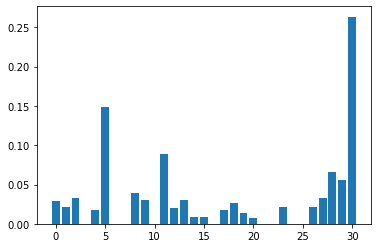

In [237]:
from xgboost import plot_importance
from matplotlib import pyplot
pyplot.bar(range(len(xgb_r.feature_importances_)), xgb_r.feature_importances_)
pyplot.show()

<Figure size 360x360 with 0 Axes>

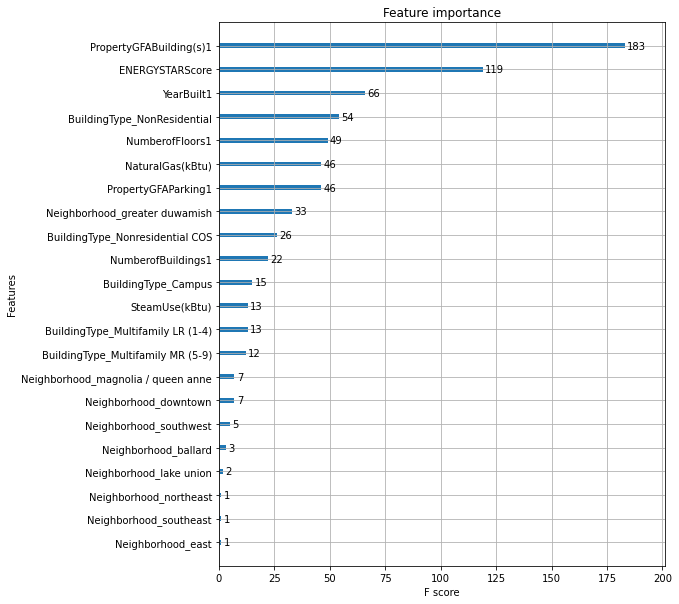

In [254]:
plt.figure(figsize=(5,5))
plot_importance(random_Search_CV1.best_estimator_)
plt.rcParams["figure.figsize"] = (8,8)
plt.show()

In [322]:
pip install wandb --upgrade

Note: you may need to restart the kernel to use updated packages.


In [111]:
import wandb
wandb.login()

wandb: WARNING Calling wandb.login() after wandb.init() has no effect.


True

In [112]:
#configuration des hyperparametres avec wandb
sweep_config = {
  "name": "My Sweep xgBoost",
  "method": "random",
  'metric': {
      'name': 'mae',
      'goal':'minimize'
  },
 'early_terminate':{
      'type': 'hyperband',
      'max_iter': 20
  },
 
  "parameters": {
        "gamma": {
            "values":  [1,2,3,4,5,6,7,8,9,10]
        },
        "learning_rate": {
            "values":  [0.001,0.008,0.01,0.03,0.05,0.1,0.3,0.5]
        },
         "max_depth": {
            "values":  [5,10,15,20,50,60,80,90,100]
        },
         "n_estimators": {
            "values":  [500,1000,1200]
        },
         "colsample_bytree": {
            "values":  [0.1,0.5,0.7]
        },
         "subsample": {
            "values":  [0.1,0.5,0.7]
        }
 
    }
}

sweep_id = wandb.sweep(sweep_config, entity = 'agar', project = 'My Sweep xgBoost')

wandb: WARNING Calling wandb.login() after wandb.init() has no effect.


Create sweep with ID: mnyb5qmc
Sweep URL: https://wandb.ai/agar/My%20Sweep%20xgBoost/sweeps/mnyb5qmc


In [113]:
import time
def train():
    
    # Initialize a new wandb run
    run = wandb.init()
    print("config:", dict(run.config))
    for i in range(run.config.n_estimators):
        #xgb_r = xg.XGBRegressor() 
        #xgb_r.fit(X_train1, y_train1)
        watchlist = [(X_train1, 'train'), (X_test1, 'test')]
        num_round = 5
        xgb_r = xg.train(sweep_config, X_train1, num_round, watchlist,
                callbacks=[wandb.xgboost.wandb_callback()])
        y_pred = xgb_r.predict(X_test1)
        maae = mae(y_test1, y_pred)
        wandb.log({'mae' : maae})
        
wandb.agent(sweep_id, function=train)

wandb: WARNING Calling wandb.login() after wandb.init() has no effect.
wandb: Agent Starting Run: eic83nay with config:
wandb: 	colsample_bytree: 0.1
wandb: 	gamma: 7
wandb: 	learning_rate: 0.03
wandb: 	max_depth: 100
wandb: 	n_estimators: 1200
wandb: 	subsample: 0.7
wandb: wandb version 0.10.24 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade


config: {'colsample_bytree': 0.1, 'gamma': 7, 'learning_rate': 0.03, 'max_depth': 100, 'n_estimators': 1200, 'subsample': 0.7}


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

wandb: Agent Starting Run: qbqvp4kb with config:
wandb: 	colsample_bytree: 0.1
wandb: 	gamma: 5
wandb: 	learning_rate: 0.5
wandb: 	max_depth: 90
wandb: 	n_estimators: 1200
wandb: 	subsample: 0.5
wandb: wandb version 0.10.24 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade


config: {'colsample_bytree': 0.1, 'gamma': 5, 'learning_rate': 0.5, 'max_depth': 90, 'n_estimators': 1200, 'subsample': 0.5}


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

wandb: Agent Starting Run: 63roxk02 with config:
wandb: 	colsample_bytree: 0.1
wandb: 	gamma: 10
wandb: 	learning_rate: 0.05
wandb: 	max_depth: 5
wandb: 	n_estimators: 1000
wandb: 	subsample: 0.7
wandb: wandb version 0.10.24 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade


config: {'colsample_bytree': 0.1, 'gamma': 10, 'learning_rate': 0.05, 'max_depth': 5, 'n_estimators': 1000, 'subsample': 0.7}


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

wandb: ERROR Detected 3 failed runs in the first 60 seconds, killing sweep.
wandb: To disable this check set WANDB_AGENT_DISABLE_FLAPPING=true
wandb: Network error (ConnectionError), entering retry loop. See wandb\debug-internal.log for full traceback.
wandb: Network error resolved after 0:01:22.505774, resuming normal operation.
